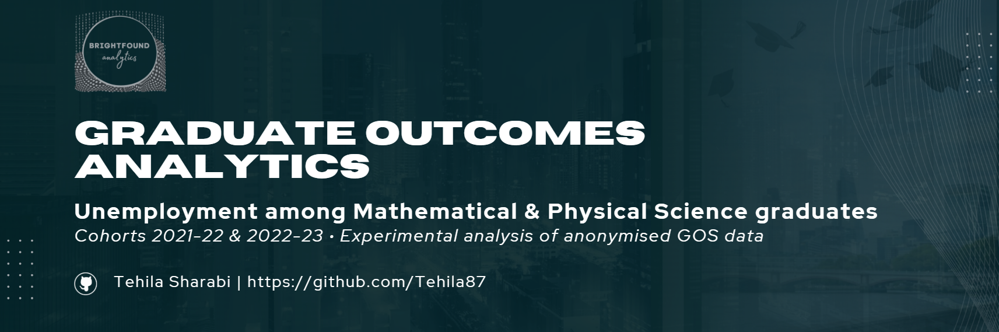

## INTRO

This repository presents an analysis of **three de-identified datasets derived from institutional Higher Education (HE) administrative data and the Graduate Outcomes Survey (GOS)**, containing information on approximately **3,700 Mathematical & Physical Sciences graduates** from the **2021–22 and 2022–23 cohorts**. Of these graduates, approximately one third responded to the Graduate Outcomes Survey, which is administered **15 months after graduation**.


#### Data Overview
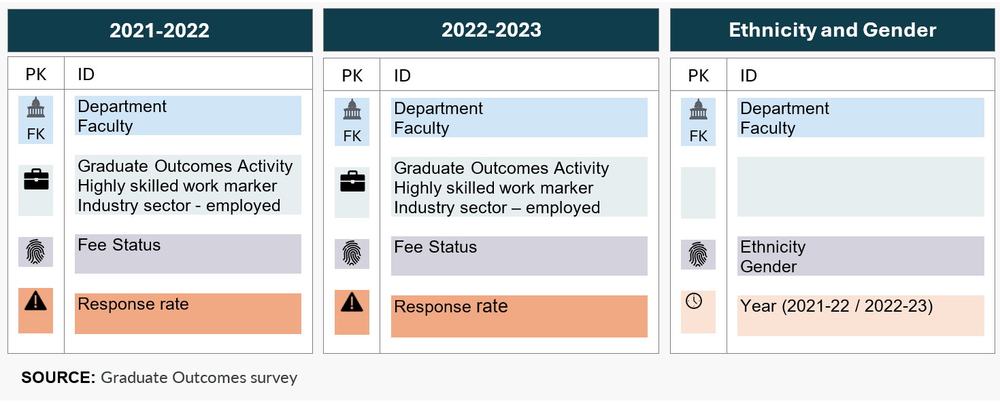

#### Privacy-protection
To enable public sharing while preserving analytical validity, all datasets were subjected to a **multi-stage anonymisation and privacy-protection workflow**. Original individual identifiers were replaced with **stable, keyed BLAKE2–based anonymised IDs** (`anon_id`, `anonymise_id_column`), ensuring that records remain **consistently linkable across datasets** without exposing personal identifiers. To further reduce disclosure risk and prevent the reconstruction of original counts, the data were **synthetically expanded using a controlled bootstrap-based resampling procedure** (`expand_by_bootstrap`), increasing sample size while preserving empirical distributions. A **balanced resampling strategy** was applied to ensure that all original records are retained at least once in the expanded sample, thereby reducing the risk of accidental loss of rare outcome categories (e.g. unemployment within small demographic groups) during synthetic expansion.

Additional privacy protection was introduced through **controlled stochastic perturbation** (`expand_by_bootstrap`, `flip_rate`, `flip_cols`), whereby a small proportion of selected categorical variables were probabilistically re-sampled within observed distributions. Perturbation was explicitly restricted to non-outcome variables, excluding protected fields and logically linked attributes (e.g. department–faculty pairs, labour-market outcome indicators, and response-status fields) to preserve the validity of derived rates.

Following synthetic expansion, duplicated records were aligned across datasets and deterministically assigned **unique pseudo-identifiers** (`pad_to_target_counts`, `make_unique_ids_consistently`), preserving one-to-one correspondence across all tables and enabling safe cross-dataset joins.

#### Reproducibility
The resulting datasets preserve **structural relationships, marginal distributions, and analytical signal**, while ensuring that published outputs do not reproduce original totals or identifiable records. Beyond privacy protection, this workflow is explicitly designed to support **reproducibility and reuse**: the full pipeline can be applied directly to real-world GOS data by researchers, higher education institutions, or policy teams, allowing users to generate equivalent analytical outputs at scale, subject to appropriate sample-size and event-count considerations(with the anonymisation step omitted where appropriate). 

#### Note on visualisations
All visualisations in this repository follow a **minimum disclosure threshold**, whereby results are displayed only for subgroups with **at least 40 respondents**, to avoid unstable estimates, protect confidentiality, and and support basic analytical stability. Additional considerations regarding event sparsity and interpretability of unemployment rates are discussed at the start of the unemployment analysis section.

---
##  NOTEBOOK FLOW
#### End-to-end analytical workflow, from privacy-preserving data preparation to stakeholder-focused analysis and interpretation.

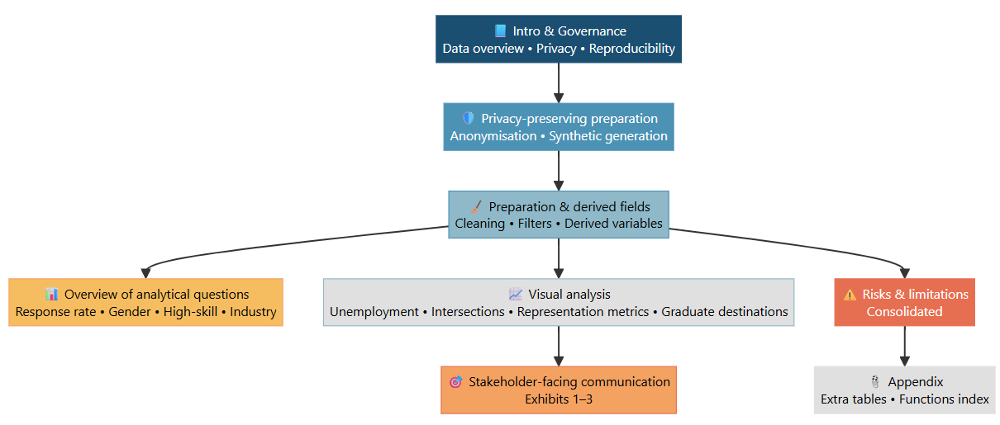

**In this workflow, data will be uploaded, cleaned, validated, and transformed** to answer stakeholders' questions on key outcome metrics such as high-skill and full-time employment, the share of graduates entering influential industry sectors, and unemployment, with regard to specific groups (by gender, ethnicity and subject area).

#### Scope & Intent
***The analyses shown here are not intended to be fully comprehensive, nor to reproduce official Graduate Outcomes statistics or institutional benchmarks.*** They are meant to demonstrate analytical approach, data handling, and the ability to create informative data visualisations and surface decision-relevant insights **in a manner consistent with responsible data governance and disclosure control**. Some parts of the analysis are written as reusable, parameterised functions. For example, reusable functions were created to calculate unemployment rates by group, calculate the share of graduates in high-skilled work, and summarise industry distribution. These functions are designed to support reproducible, descending-ranked tables and subgroup comparisons across gender, ethnicity, or department.

Following the question-led analysis, the notebook presents a **set of visualisations** focusing on **unemployment** rates among Mathematical & Physical Sciences graduates, as well as an additional set of visualisations providing brief insights into **diversity and inclusion**. 

#### Risks & Limitations
The notebook includes frequent references to risks and limitations where relevant. It concludes with a summary note on **risks and limitations**, alongside brief suggestions for further inquiry and for additional data that may support the development of targeted strategies to improve key graduate outcomes.

In [1]:
# Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

In [2]:
# loading the datasets
grad_2021_22 = pd.read_csv("grad_2021_22.csv")
grad_2022_23 = pd.read_csv("grad_2022_23.csv")
grad_demographics = pd.read_csv("grad_demographics.csv")

## Data Anonymisation and Synthetic Data Generation for Privacy Protection

In [3]:
# ============================================================
#   1) Anonymise IDs consistently across ALL 3 datasets (linkable)
#   2) Change totals by creating a synthetic expanded sample
#
# Output DataFrames created by this script:
#   - grad_2021_22_safe
#   - grad_2022_23_safe
#   - grad_demographics_safe
# ============================================================

# importing hashlib to create stable anonymised IDs using SHA-256 hashing
import hashlib
# importing shuffle to randomize row order (slight privacy boost; avoids preserving original order)
from sklearn.utils import shuffle
# explain
from typing import List, Tuple, Optional

In [4]:
# ----------------------------
# REPRODUCIBILITY SETTINGS
# ----------------------------
# random seed so that you can re-run the notebook and get the same results
RANDOM_STATE = 42

# numpy random generator object; used for all random sampling below
rng = np.random.default_rng(RANDOM_STATE)

# ID ANONYMISATION (LINKABLE ACROSS DATASETS)
# Creating a private secret string 
SALT = "CHANGE_THIS_TO_A_LONG_PRIVATE_SECRET_123!"

In [5]:
def anon_id(real_id: str, salt: str = SALT, prefix: str = "anon_", n_chars: int = 16) -> str:
    """
    Converts a real ID into a stable anonymised ID using keyed BLAKE2s.
    - SAME real_id always maps to SAME anonymised id (as long as SALT stays unchanged).
    - Keeps datasets LINKABLE by id after anonymisation.
    - Output format stays: prefix + hex[:n_chars]
    """
    if pd.isna(real_id):
        return None

    real_id = str(real_id).encode("utf-8")
    # Derive a fixed 32-byte key from an arbitrary-length secret
    key = hashlib.sha256(str(salt).encode("utf-8")).digest()[:32]

    # Keyed hash (safer than concatenating salt+id)
    h = hashlib.blake2s(real_id, key=key)  # default digest_size=32 bytes => 64 hex chars
    digest = h.hexdigest()

    return prefix + digest[:n_chars]


In [6]:
def anonymise_id_column(df: pd.DataFrame, id_col: str = "id") -> pd.DataFrame:
    """
    Returns a COPY of df where df[id_col] is replaced by stable anonymised IDs.
    Does NOT modify the original dataframe in memory.
    """
    df_out = df.copy(deep=True)
    df_out[id_col] = df_out[id_col].map(lambda x: anon_id(x))
    return df_out


# -------------------------------------
# 2) CREATING SYNTHETIC EXPANDED SAMPLE
# -------------------------------------
# - Create a larger dataset by sampling rows with replacement (bootstrap-style)
# - Add slight controlled randomness (a small number of "category flips")
# - Preserve logical relationships like (department <-> faculty).
#   i.e. treat department+faculty as a linked pair and do NOT change one without the other.
# - Result: changes totals so outputs are not identical to the original dataset

# Create an expanded synthetic dataset by sampling rows with replacement.
def expand_by_bootstrap(
    df: pd.DataFrame,
    factor: float = 1.30, # How much bigger to make the dataset. Example: factor=1.30 -> 30% more rows than original
    id_col: str = "id",
    linked_pairs: list = None, # List of tuples that represent columns that should remain consistent together.
                               # Example: [('department', 'faculty')]
    flip_rate: float = 0.02,   # After resampling, optionally change a small percentage of rows in selected columns,
                               # to add noise and avoid identical counts. Example: 0.02 = flip 2% of rows (small but effective)
    flip_cols: list = None,    # Which columns are allowed to "flip" (change values). *Avoid flipping linked columns (department/faculty). 
    random_state: int = 42     # controls reproducibility
) -> pd.DataFrame:
    """
    Output:
    - a new dataframe with more rows (synthetic expanded sample)
    """
    rng_local = np.random.default_rng(random_state)

    n_original = len(df)
    n_new = int(np.round(n_original * factor))

    # 1) BALANCED bootstrap expansion:
    # Keep ALL original rows once, then add only the extra rows by sampling with replacement.
    df_base = df.copy(deep=True)

    extra = n_new - n_original
    if extra > 0:
        extra_idx = rng_local.integers(low=0, high=n_original, size=extra)
        df_extra = df.iloc[extra_idx].copy(deep=True)
        df_expanded = pd.concat([df_base, df_extra], ignore_index=True)
    else:
    # if factor <= 1, just return a shuffled copy of the original
        df_expanded = df_base.copy(deep=True)

    df_expanded = df_expanded.reset_index(drop=True)

    if flip_cols is None:
        flip_cols = []

    # Prepare a set of protected columns that should not be flipped
    protected = {id_col}
    if linked_pairs:
        for pair in linked_pairs:
            for col in pair:
                protected.add(col)
    # Also protect outcome/denominator columns so KPIs don't collapse
    for col in ["graduate_outcomes_activity", "response_status"]:
        if col in df_expanded.columns:
            protected.add(col)

    # For each column allowed to flip:
    # - randomly pick some rows
    # - re-draw a value from that column's distribution
    for col in flip_cols:
        if col not in df_expanded.columns:
            continue
        if col in protected:
            # skip protected columns like id, department, faculty
            continue

        # determine how many rows to flip for this column
        n_flip = int(np.round(len(df_expanded) * flip_rate))
        if n_flip <= 0:
            continue
        # Select rows eligible for flipping:
        # ONLY rows where the survey WAS completed
        # If this dataset has response_status, flip only among respondents.
        # Otherwise (e.g., demographics), allow flipping across all rows.
        if "response_status" in df_expanded.columns:
            eligible_rows = df_expanded.index[
                df_expanded["response_status"] == "Survey completed or partially completed"]
        else:
            eligible_rows = df_expanded.index

        # If there are no eligible rows, skip flipping this column
        if len(eligible_rows) == 0:
            continue

        # Make sure we do not try to flip more rows than exist
        n_flip = min(n_flip, len(eligible_rows))

        # Randomly select rows to flip from the eligible subset
        flip_rows = rng_local.choice(eligible_rows, size=n_flip, replace=False)

        # Use ORIGINAL distribution so flips don't reinforce bootstrap distortions
        if "response_status" in df.columns:
            eligible_orig = df.index[df["response_status"] == "Survey completed or partially completed"]
            series = df.loc[eligible_orig, col]
        else:
            series = df[col]

        probs = series.value_counts(normalize=True, dropna=False)
        values = probs.index.to_list()
        p = probs.values

        # assign new sampled values to selected rows
        df_expanded.loc[flip_rows, col] = rng_local.choice(values, size=n_flip, p=p)

    # 4) Shuffle row order (extra safety + avoids preserving any structure)
    df_expanded = shuffle(df_expanded, random_state=random_state).reset_index(drop=True)

    return df_expanded

In [7]:
# APPLY THE ANONYMISATION WORKFLOW TO THE ORIGINAL DATASETS
# A) ANONYMISE IDs CONSISTENTLY

grad_2021_22_anon = anonymise_id_column(grad_2021_22, id_col="id")
grad_2022_23_anon = anonymise_id_column(grad_2022_23, id_col="id")
grad_demographics_anon = anonymise_id_column(grad_demographics, id_col="id")

# View anonymised IDs 
print("Anonymised IDs example (grad_2021_22):")
print(grad_2021_22_anon["id"].head())

Anonymised IDs example (grad_2021_22):
0    anon_ea277186e0de5e7b
1    anon_6a65a278d213339b
2    anon_7e74cfd184c7aaaf
3    anon_f0ff2d1c64898779
4    anon_2c0baafd9c0ddeb1
Name: id, dtype: object


In [8]:
# B) EXPAND EACH DATASET (TO CHANGE TOTALS)

# Define linked columns that should remain consistent as a pair
LINKED_PAIRS = [("department", "faculty")]

# Columns that are safe-ish to "flip" a bit to add noise to totals (keep response rate out)
FLIP_COLS_MAIN = ["fee_status", "graduate_outcomes_activity",
    "highly_skilled_work_marker", "industry_sector_employed"]

# For demographics dataset:
FLIP_COLS_DEMO = ["ethnicity", "gender", "response status two"]

# Choose how much to expand
EXPANSION_FACTOR = 1.30

# Choose flip rate for added noise
FLIP_RATE = 0.02 # 2% of rows per selected column will be flipped

grad_2021_22_safe = expand_by_bootstrap(grad_2021_22_anon, factor=EXPANSION_FACTOR,
    id_col="id", linked_pairs=LINKED_PAIRS, flip_rate=FLIP_RATE, flip_cols=FLIP_COLS_MAIN,
    random_state=RANDOM_STATE)

grad_2022_23_safe = expand_by_bootstrap(grad_2022_23_anon, factor=EXPANSION_FACTOR,
    id_col="id", linked_pairs=LINKED_PAIRS, flip_rate=FLIP_RATE, flip_cols=FLIP_COLS_MAIN,
    random_state=RANDOM_STATE)

In [9]:
# ------------------------------------------------------------
# C) BUILD grad_demographics_safe to MATCH the 2 main safe sets
#    (so every synthetic ID in the main datasets exists in demo)
#    *at this point IDs are duplicated but NOT yet _dup1/_dup2.
# ------------------------------------------------------------

def build_demographics_safe_for_year(
    demo_anon: pd.DataFrame,
    expanded_main: pd.DataFrame,
    year_label: str
) -> pd.DataFrame:
    """
    Creates demographics rows that match the expanded MAIN dataset row-for-row.
    At this point in the pipeline:
    - expanded_main contains duplicated base IDs (e.g., anon_xxxx repeated)
    - we want demographics rows repeated in the exact same way
    """

    # 1) Keep only the main IDs for the relevant year
    main_ids = expanded_main[["id"]].copy()
    main_ids["year"] = year_label  # attach year label so we match correct demographics year

    # 2) Take demographics rows for that year
    demo_year = demo_anon[demo_anon["year"] == year_label].copy(deep=True)

    # 3) Merge: repeats demographics rows as many times as the ID appears in expanded_main
    out = main_ids.merge(demo_year, on=["id", "year"], how="left")

    return out

# Build demographics-safe rows that match the expanded MAIN datasets (before _dup numbering exists)
grad_demographics_safe_21 = build_demographics_safe_for_year(
    grad_demographics_anon, grad_2021_22_safe, "2021-22")

grad_demographics_safe_22 = build_demographics_safe_for_year(
    grad_demographics_anon, grad_2022_23_safe, "2022-23")

grad_demographics_safe = pd.concat([grad_demographics_safe_21, grad_demographics_safe_22],
    ignore_index=True)

In [10]:
# Check if totals changed
print("\nRow counts (original vs safe):")
print("grad_2021_22:", len(grad_2021_22), "->", len(grad_2021_22_safe))
print("grad_2022_23:", len(grad_2022_23), "->", len(grad_2022_23_safe))
print("grad_demographics:", len(grad_demographics), "->", len(grad_demographics_safe))

# Example: check distribution shifts (counts will change due to expansion + flipping)
print("\nExample distribution check (graduate_outcomes_activity) - original vs safe:")
print(grad_2021_22["graduate_outcomes_activity"].value_counts(dropna=False).head())
print(grad_2021_22_safe["graduate_outcomes_activity"].value_counts(dropna=False).head())


Row counts (original vs safe):
grad_2021_22: 1789 -> 2326
grad_2022_23: 1912 -> 2486
grad_demographics: 3701 -> 4812

Example distribution check (graduate_outcomes_activity) - original vs safe:
graduate_outcomes_activity
NaN                             1129
Full-time employment             368
Full-time further study          114
Employment and further study      61
Unemployed                        45
Name: count, dtype: int64
graduate_outcomes_activity
NaN                             1463
Full-time employment             481
Full-time further study          153
Employment and further study      83
Unemployed                        54
Name: count, dtype: int64


In [11]:
# Number of duplicated IDs (excluding the first occurrence)
print(grad_2021_22_safe["id"].duplicated().sum())
print(grad_2022_23_safe["id"].duplicated().sum())
print(grad_demographics_safe["id"].duplicated().sum())

537
574
1111


In [12]:
# Replace duplicated ids with new unique fake IDs (_dup1, _dup2, …) in a way that is consistent across all datasets.
# ============================================================
# ----------------------------
# 0) Helper: count occurrences per base id
# ----------------------------
def _counts_by_id(df: pd.DataFrame, id_col: str = "id") -> pd.Series:
    # returns: Series indexed by id, values = how many times id appears in df
    return df[id_col].astype(str).value_counts()

# ----------------------------
# 1) Build a GLOBAL target count per id
#    (max count across all datasets)
# ----------------------------
c1 = _counts_by_id(grad_2021_22_safe, "id")
c2 = _counts_by_id(grad_2022_23_safe, "id")
c3 = _counts_by_id(grad_demographics_safe, "id")

# Union of all ids appearing anywhere
all_ids = c1.index.union(c2.index).union(c3.index)

# For each id, target count = maximum count across the three dfs (missing treated as 0)
target = pd.concat([c1.reindex(all_ids, fill_value=0), c2.reindex(all_ids, fill_value=0),
    c3.reindex(all_ids, fill_value=0)], axis=1).max(axis=1)

# ----------------------------
# 2) Pad a dataframe so each id appears exactly target[id] times
#    (ONLY duplicates rows when needed)
# ----------------------------
def pad_to_target_counts(
    df: pd.DataFrame,
    target_counts: pd.Series,
    id_col: str = "id",
    random_state: int = 42
) -> pd.DataFrame:
    rng_local = np.random.default_rng(random_state)
    df_out = df.copy(deep=True)

    # current counts in this df
    cur = _counts_by_id(df_out, id_col)

    rows_to_add = []

    # loop over ids that appear in this df OR are required by target
    for _id, t in target_counts.items():
        current = int(cur.get(_id, 0))
        needed = int(t - current)

        if needed <= 0:
            continue  # already enough occurrences

        # if the id doesn't exist in this df at all, we cannot invent a row for it
        # (you can decide later whether you want to drop such ids globally)
        if current == 0:
            continue

        # sample 'needed' rows *from existing rows of that id* (with replacement)
        pool = df_out[df_out[id_col].astype(str) == str(_id)]
        sampled = pool.sample(n=needed, replace=True, random_state=random_state)

        rows_to_add.append(sampled)

    if rows_to_add:
        df_out = pd.concat([df_out] + rows_to_add, ignore_index=True)

    return df_out

# Apply padding (so all 3 dfs have matching id multiplicities)
grad_2021_22_safe = pad_to_target_counts(grad_2021_22_safe, target, id_col="id", random_state=RANDOM_STATE)
grad_2022_23_safe = pad_to_target_counts(grad_2022_23_safe, target, id_col="id", random_state=RANDOM_STATE)
grad_demographics_safe = pad_to_target_counts(grad_demographics_safe, target, id_col="id", random_state=RANDOM_STATE)

# ----------------------------
# 3) Create consistent UNIQUE ids: baseID_dup1, baseID_dup2, ...
#    Assigning dup numbers deterministically. by sorting within each id group on
#    ALL columns (stable).
# ----------------------------
def make_unique_ids_consistently(df: pd.DataFrame, id_col: str = "id") -> pd.DataFrame:
    df_out = df.copy(deep=True)

    # sort columns list for stable ordering (keeps behaviour deterministic)
    sort_cols = [c for c in df_out.columns if c != id_col]

    # stable sort: first by id, then by other columns (stringified) to fix ordering
    if sort_cols:
        # convert sort columns to strings temporarily for consistent sorting even with NaNs
        tmp = df_out[sort_cols].astype(str)
        df_out = df_out.assign(_tmp_sort_key=tmp.apply(lambda r: "||".join(r.values), axis=1))
        df_out = df_out.sort_values([id_col, "_tmp_sort_key"], kind="mergesort").drop(columns=["_tmp_sort_key"])
    else:
        df_out = df_out.sort_values([id_col], kind="mergesort")

    # dup index within each base id: 1..k
    dup_idx = df_out.groupby(id_col).cumcount() + 1

    # new unique linkable id
    df_out[id_col] = df_out[id_col].astype(str) + "_dup" + dup_idx.astype(str)

    # return in original row order is NOT required for correctness,
    # but if you prefer: shuffle again for privacy
    df_out = shuffle(df_out, random_state=RANDOM_STATE).reset_index(drop=True)

    return df_out

grad_2021_22_safe = make_unique_ids_consistently(grad_2021_22_safe, id_col="id")
grad_2022_23_safe = make_unique_ids_consistently(grad_2022_23_safe, id_col="id")
grad_demographics_safe = make_unique_ids_consistently(grad_demographics_safe, id_col="id")

# ----------------------------
# 4) Verification checks
# ----------------------------
print("Duplicate IDs after final step (should all be 0):")
print("grad_2021_22_safe:", grad_2021_22_safe["id"].duplicated().sum())
print("grad_2022_23_safe:", grad_2022_23_safe["id"].duplicated().sum())
print("grad_demographics_safe:", grad_demographics_safe["id"].duplicated().sum())

print("\nExample overlap check (should be > 0 if linking is intact):")
print("2021 vs demographics overlap:", len(set(grad_2021_22_safe["id"]).intersection(set(grad_demographics_safe["id"]))))
print("2022 vs demographics overlap:", len(set(grad_2022_23_safe["id"]).intersection(set(grad_demographics_safe["id"]))))

Duplicate IDs after final step (should all be 0):
grad_2021_22_safe: 0
grad_2022_23_safe: 0
grad_demographics_safe: 0

Example overlap check (should be > 0 if linking is intact):
2021 vs demographics overlap: 2326
2022 vs demographics overlap: 2486


In [13]:
# OPTIONAL: SAVE SAFE DATASETS TO CSV
# ============================================================
# grad_2021_22_safe.to_csv("grad_2021_22_safe.csv", index=False)
# grad_2022_23_safe.to_csv("grad_2022_23_safe.csv", index=False)
# grad_demographics_safe.to_csv("grad_demographics_safe.csv", index=False)

## Data Preparation
#### *If working with real GOS data, start here after uploading the data*

In [14]:
# View and compare total count of graduate records
grad_2021_22_safe.head() # replace with grad_2022_23_safe ; grad_demographics_safe
print ("Number of 2021-22 graduates included in manipulated sample:", grad_2021_22_safe.shape[0])
print ("Number of 2022-23 graduates included in manipulated sample:", grad_2022_23_safe.shape[0])
print ("Total 2021-22 and 2022-23 graduates included in both manipulated datasets:", grad_2021_22_safe.shape[0]+grad_2022_23_safe.shape[0])
print ("Number of 2022-23 graduates included in the manipulated demographics dataset:", grad_demographics_safe.shape[0])

Number of 2021-22 graduates included in manipulated sample: 2326
Number of 2022-23 graduates included in manipulated sample: 2486
Total 2021-22 and 2022-23 graduates included in both manipulated datasets: 4812
Number of 2022-23 graduates included in the manipulated demographics dataset: 4812


In [15]:
# Standardise whitespace for all categorical columns
CAT_COLS = ["ethnicity", "department", "faculty", "fee_status", "gender",
    "graduate_outcomes_activity", "industry_sector_employed", "response_status"]
# Cleaning function
def clean_cat(s):
    s = s.astype(str).str.strip().str.replace(r"\s+", " ", regex=True)
    s = s.mask(s.str.lower().isin(["nan", "none", "null", ""]))  # turn common placeholders into real missing
    return s
# Apply across 3 datasets:
for df in [grad_2021_22_safe, grad_2022_23_safe, grad_demographics_safe]:
    for col in CAT_COLS:
        if col in df.columns:
            df[col] = clean_cat(df[col])

In [16]:
# Checking for duplicates based on ID:
duplicated_records_2021_22 = grad_2021_22_safe[grad_2021_22_safe.duplicated(subset='id', keep=False)]
print(duplicated_records_2021_22.shape)
duplicated_records_2022_23 = grad_2022_23_safe[grad_2022_23_safe.duplicated(subset='id', keep=False)]
print(duplicated_records_2022_23.shape)
duplicated_records_grad_demographics = grad_demographics_safe[grad_demographics_safe.duplicated(subset='id', keep=False)]
print(duplicated_records_grad_demographics.shape)

(0, 8)
(0, 8)
(0, 7)


**NOTE**: no duplicated rows were found

In [17]:
# Checking for redundant columns (with repeating same values)
# --- Checking for redundant columns (with repeating same values) ---
redundant_cols_2021_22 = [col for col in grad_2021_22_safe.columns if grad_2021_22_safe[col].nunique() == 1]
redundant_cols_2022_23 = [col for col in grad_2022_23_safe.columns if grad_2022_23_safe[col].nunique() == 1]
redundant_cols_demo = [col for col in grad_demographics_safe.columns if grad_demographics_safe[col].nunique() == 1]
print(f"Redundant columns (only one unique value): {redundant_cols_2021_22, redundant_cols_2022_23,redundant_cols_demo}")

Redundant columns (only one unique value): (['faculty'], ['faculty'], ['faculty'])


**NOTE** The column faculty was a redundant column across all three datasets. For data architecture reasons (possible future enrichment of the data to include graduates from additional faculties), the column is not deleted. Instead, it is documented that all graduates in this assignment are from the same faculty: Mathematical & Physical Sciences.

In [18]:
# Checking for missing fields: precentages of missing data in each column
print(f"Missing data %, 2021-22 grads:\n{grad_2021_22_safe.isnull().mean() * 100}")
print(f"Missing data %, 2022-23 grads:\n{grad_2022_23_safe.isnull().mean() * 100}")
print(f"Missing data %, demographics dataset:\n{grad_demographics_safe.isnull().mean() * 100}")

Missing data %, 2021-22 grads:
id                             0.000000
department                     0.000000
faculty                        0.000000
fee_status                     0.000000
graduate_outcomes_activity    62.897678
highly_skilled_work_marker    62.897678
industry_sector_employed      75.580396
response_status                0.000000
dtype: float64
Missing data %, 2022-23 grads:
id                             0.000000
department                     0.000000
faculty                        0.000000
fee_status                     0.000000
graduate_outcomes_activity    71.802092
highly_skilled_work_marker    71.802092
industry_sector_employed      82.381335
response_status                0.000000
dtype: float64
Missing data %, demographics dataset:
id                     0.0
year                   0.0
department             0.0
ethnicity              0.0
faculty                0.0
gender                 0.0
response status two    0.0
dtype: float64


In [19]:
# Checking if misingness in outcome-related variables is linked to survey non-respondance - 2021_22 file
grad_2021_22_safe.groupby('response_status')[['graduate_outcomes_activity', 'highly_skilled_work_marker', 'industry_sector_employed']].apply(
    lambda x: x.isnull().mean()*100)

,graduate_outcomes_activity,highly_skilled_work_marker,industry_sector_employed
response_status,,,
Survey completed or partially completed,0.0,0.0,34.183082
Survey not completed,100.0,100.0,100.000000


In [20]:
# Checking if misingness in outcome-related variables is linked to survey non-respondance - 2023_23 file
grad_2022_23_safe.groupby('response_status')[['graduate_outcomes_activity', 'highly_skilled_work_marker', 'industry_sector_employed']].apply(
    lambda x: x.isnull().mean()*100)

,graduate_outcomes_activity,highly_skilled_work_marker,industry_sector_employed
response_status,,,
Survey completed or partially completed,0.000000,0.000000,37.122302
Survey not completed,99.664992,99.664992,99.944165


**MISSING DATA PATTERNS**: Overall, missing data in outcome variables aligns closely with respondents’ survey completion status: For respondents who completed or partially completed the survey, there are no missing values in graduate_outcomes_activity or highly_skilled_work_marker, and only around 34%-37% missing in industry_sector_employed (reflecting graduates not in employment); For those who did not complete the survey, 100% of values are missing across all three variables. This confirms that ***missingness in outcome-related variables is structurally linked to survey non-response*** - i.e., missing by design rather than data quality issues. **NOTE**: less then 0.5% of records where survey was not completed do contain values in the outcome-related fields. This issue is investigated below. 

In [21]:
# define the columns that should ONLY have data if the survey was completed
outcome_cols = ['graduate_outcomes_activity','highly_skilled_work_marker','industry_sector_employed']
# condition: survey not completed
not_completed = grad_2022_23_safe['response_status'] == "Survey not completed"
# condition: at least one of the outcome columns is NOT null
has_illegal_data = grad_2022_23_safe[outcome_cols].notnull().any(axis=1)
# filter the suspicious rows
suspicious_rows = grad_2022_23_safe[not_completed & has_illegal_data]
# look at them
print(suspicious_rows.shape)
suspicious_rows[['response_status', 'id'] + outcome_cols ].head(20)

(6, 8)


,response_status,id,graduate_outcomes_activity,highly_skilled_work_marker,industry_sector_employed
220,Survey not completed,anon_cefd6cc3d2c02065_dup3,Not in publication population,Not applicable,NaN
324,Survey not completed,anon_833af3c8e854b460_dup1,Not in publication population,Not applicable,NaN
593,Survey not completed,anon_cefd6cc3d2c02065_dup1,Not in publication population,Not applicable,NaN
1433,Survey not completed,anon_cefd6cc3d2c02065_dup2,Not in publication population,Not applicable,NaN
1819,Survey not completed,anon_57dc1d63292a69fa_dup1,Not in publication population,Not applicable,Unknown
2334,Survey not completed,anon_1e405e81f1701e05_dup1,Not in publication population,Not applicable,NaN


In [22]:
# Replace all values in the three outcome-related columns with NaN - only for these four six rows 
# (where graduate_outcomes_activity == "Not in publication population" and response_status == "Survey not completed"))

# Create a clean copy first
grad_2022_23_clean = grad_2022_23_safe.copy()

# Define the condition: only those rows that meet BOTH criteria
condition = ((grad_2022_23_safe['graduate_outcomes_activity'] == 'Not in publication population') &
    (grad_2022_23_safe['response_status'] == 'Survey not completed'))

# Apply replacement only to those rows and columns
grad_2022_23_clean.loc[condition, outcome_cols] = np.nan

In [23]:
# Confirming new alignment of misingness in outcome-related variables
grad_2022_23_clean.groupby('response_status')[['graduate_outcomes_activity', 'highly_skilled_work_marker', 'industry_sector_employed']].apply(
    lambda x: x.isnull().mean()*100)

,graduate_outcomes_activity,highly_skilled_work_marker,industry_sector_employed
response_status,,,
Survey completed or partially completed,0.0,0.0,37.122302
Survey not completed,100.0,100.0,100.000000


**NOTE:** In 2022–23, six graduates recorded as “Survey not completed” contained the placeholder value **“Not in publication population”** in graduate_outcomes_activity. This value was assumed to carry no meaningful information while introducing noise into the analysis.
To prepare the data for analysis and ensure consistent alignment of missingness across datasets, these placeholders were recoded to missing (null), along with all other outcome-related values (e.g., “Not applicable”, “Unknown”) within these four specific records.

## Overview of analytical questions and summary results
*Originally developed to address institutional stakeholder information needs, these results are presented here in a generalised and reusable analytical form.*

The points below provide a high-level orientation to the questions explored in this section and the corresponding results; detailed analyses and methodological choices are presented in the sections that follow.

> **Bullet points summary:**
> * Between the 2021–22 and 2022–23 graduating cohorts, the overall survey response rate declined by almost **10 percentage points**, from approximately **37%** to **28%**.
> * In **2021–22**, the ratio of male to female graduating students was **1,295 to 1,030**, representing **56%** and **44%** of the cohort, respectively. This gender gap narrowed in **2022–23**, when the ratio was **1,255** to **1,228**, approximately **50/50**.
> * Of the **844** graduates across both cohorts who reported being in full-time employment, **732 (approximately 87%)** were in high-skilled roles. > Fewer than **6%** were in medium- or low-skilled roles combined, while the remaining **7% (68 graduates)** were recorded as “Not applicable”.
> * Across both cohorts, **Space and Climate Physics** recorded the highest share of respondents in full-time, high-skilled employment (approximately **79%**), followed by **the Institute for Risk and Disaster Reduction** (around **65%**).
> * Across cohorts and genders, the overall unemployment rate stood at **7.4%**, with variation by cohort, field of study and gender, as explored in subsequent sections.

#### QUESTION 1. RESPONSE RATE
Q: What was the difference between the overall response rates to the survey between 2022-23 and 2021-22?

In [24]:
# Merging the datasets (2021-22 and 2022-23)
# Add the year column:
grad_2021_22_safe['year'] = '2021-22'
grad_2022_23_clean['year'] = '2022-23'
# Merge the datasets (stack one on top of the other)
grads_combined = pd.concat([grad_2021_22_safe, grad_2022_23_clean], ignore_index=True) # ignore_index=True ensures the index resets
# Sanity check
grads_combined['year'].value_counts()

year
2022-23    2486
2021-22    2326
Name: count, dtype: int64

In [25]:
# Calculate response rate (% of completed responses) by year; add raw freq columns
# Calculate totals per year:
response_summary = (grads_combined.groupby('year', as_index=False).agg(
        total=('response_status', 'size'), # 'size' = all rows in the group
        responded=('response_status', lambda x: x.str.contains("Survey completed", na=False).sum())))

# Add response rate (%)
response_summary['response_rate'] = (response_summary['responded'] / response_summary['total'] * 100)
response_summary

,year,total,responded,response_rate
0,2021-22,2326,863,37.102322
1,2022-23,2486,695,27.956557


A: Between the 2021–22 and 2022–23 graduating cohorts, the overall survey response rate **declined by almost 10 percentage points**, from approximately **37%** to **28%** (*see below*).

#### QUESTION 2. GENDER DISTRIBUTION
Q: What was the ratio of male to female students in 2021-22?

In [26]:
# keep only 2021-22 graduates
grads_demographics_2021_22 = grad_demographics_safe[grad_demographics_safe['year'] == '2021-22']
# get counts by gender
gender_balance_2021_22 = (grads_demographics_2021_22['gender'].value_counts().rename_axis('gender').reset_index(name='count'))
# calculate total number of students
total_2021_22 = gender_balance_2021_22['count'].sum()
# add percentage column
gender_balance_2021_22['percent'] = (gender_balance_2021_22['count']/ total_2021_22*100)
# Same for the year 2022-23 
grads_demographics_2022_23 = grad_demographics_safe[grad_demographics_safe['year'] == '2022-23']
gender_balance_2022_23 = (grads_demographics_2022_23['gender'].value_counts().rename_axis('gender').reset_index(name='count'))
total_2022_23 = gender_balance_2022_23['count'].sum()
gender_balance_2022_23['percent'] = (gender_balance_2022_23['count']/ total_2022_23*100)
# Display results
print("for the year 2021-22:")
gender_balance_2021_22

for the year 2021-22:


,gender,count,percent
0,M,1295,55.674979
1,F,1030,44.282029
2,O,1,0.042992


In [27]:
print("for the year 2022-23:")
gender_balance_2022_23

for the year 2022-23:


,gender,count,percent
0,M,1255,50.482703
1,F,1228,49.396621
2,O,3,0.120676


A: The ratio of male to female graduating students in **2021–22** was **1,295 to 1,030**, representing **56%** and **44%** of the cohort, respectively. This gender gap narrowed in **2022–23**, when the ratio was **1,255** to **1,228**, approximately **50/50**. In both years, only a few graduated (<5 total) identified as another gender (other/non-binary).

#### QUESTION 3-5: FULL-TIME EMPLOYMENT & HIGH_SKILLED WORK
Q: What proportion of those in full-time employment (2021-22 and 2022-23) were in high-skilled work?

In [28]:
# keep only graduates in full-time employment
grads_combined_full_time = grads_combined[grads_combined['graduate_outcomes_activity'] == 'Full-time employment']
# get counts by skill level highly_skilled_work_marker
skill_level_summary = (grads_combined_full_time['highly_skilled_work_marker'].value_counts().rename_axis('skill level').reset_index(name='count'))
# calculate total number of graduates
total_full_time_employment = skill_level_summary['count'].sum()
# add percentage column
skill_level_summary['percent'] = (skill_level_summary['count']/ total_full_time_employment*100)
# Display results
print("total graduates in full-time employment:", total_full_time_employment)
skill_level_summary

total graduates in full-time employment: 844


,skill level,count,percent
0,High-skilled,732,86.729858
1,Not applicable,63,7.464455
2,Medium-skilled,31,3.672986
3,Low-skilled,18,2.132701


A: **Out of 844** graduates across 2021–22 and 2022–23 who reported being in full-time employment, **732 (approximately 87%) were in high-skilled work**. Fewer than 6% were in medium-skilled or low-skilled roles combined and the remaining 7% (68 graduates) were recorded as “Not applicable". 

Q: Which two departments had the highest rate of full-time employed students in high-skilled work?

In [29]:
# interpretation: what % of each department’s entire graduating cohort went into full-time high-skilled employment?

# keep only graduates who participated in the survey
grads_combined_responded = grads_combined[grads_combined['response_status'] ==  'Survey completed or partially completed'].copy()

# Adding Boolean columns to identify subgroups (is_full_time and/or is_high_skill); use a copy of the dataset
grads_combined_responded['full_time_high_skill'] = (
    (grads_combined_responded['graduate_outcomes_activity'] == 'Full-time employment') &
    (grads_combined_responded['highly_skilled_work_marker'] == 'High-skilled'))


# get counts by department, employment (graduate_outcomes_activity) and skill level (highly_skilled_work_marker)
outcome_by_department_summary = (grads_combined_responded.groupby('department', as_index=False).agg(
    total_responded = ('id', 'size'),
    full_time_high_skill_count = ('full_time_high_skill', 'sum')))

outcome_by_department_summary['full_time_high_skill_rate'] = (
    outcome_by_department_summary['full_time_high_skill_count'] / outcome_by_department_summary['total_responded'] * 100)

outcome_by_department_summary.sort_values(by='full_time_high_skill_rate', ascending=False, inplace=True)
outcome_by_department_summary

,department,total_responded,full_time_high_skill_count,full_time_high_skill_rate
8,Space and Climate Physics,93,73,78.494624
3,Institute for Risk and Disaster Reduction,63,41,65.079365
2,Faculty of Mathematical and Physical Sciences,31,17,54.838710
1,Earth Sciences,138,72,52.173913
7,Science and Technology Studies,68,34,50.000000
9,Statistical Science,142,65,45.774648
0,Chemistry,274,122,44.525547
6,Physics and Astronomy,364,157,43.131868
4,Mathematics,264,104,39.393939
5,Natural Sciences,121,47,38.842975


A: Across both graduating cohorts, **Space and Climate Physics** recorded the highest share of survey respondents employed in full-time, high-skilled roles (approximately **79%**). **The Institute for Risk and Disaster Reduction** ranked second, with around **65%** of respondents reporting full-time, high-skilled employment.

5. Which two ethnic groups had the highest rate of full-time employed students in high-skilled work? Did the same rankings apply when looking at male graduates only?

In [30]:
# merging demographics & graduate outcome results, using a left join; using suffixes fro easy reference
graduates_all_merged = grads_combined.merge(grad_demographics_safe, on='id', how='left', suffixes=('_comb', '_demo'))
# graduates_all_merged.head()

In [31]:
# Identify and delete duplicate columns:
# Find columns that share the same base name
comb_cols = [c for c in graduates_all_merged.columns if c.endswith('_comb')]
demo_cols = [c for c in graduates_all_merged.columns if c.endswith('_demo')]

# Find columns with same base name before the suffix
common_bases = set(c.replace('_comb', '') for c in comb_cols) & set(c.replace('_demo', '') for c in demo_cols)
common_bases

identical_cols = []

for base in common_bases:
    col_comb = base + '_comb'
    col_demo = base + '_demo'
    if graduates_all_merged[col_comb].equals(graduates_all_merged[col_demo]):
        identical_cols.append(base)

identical_cols

['faculty', 'department', 'year']

In [32]:
print((graduates_all_merged['response_status'].equals(graduates_all_merged['response status two'])))

True


In [33]:
# safely drop the redundant duplicate columns
graduates_all_merged.drop(
    columns=['department_demo','faculty_demo','year_demo','response status two'], inplace=True)
# retain and rename the original columns for clarity
graduates_all_merged = graduates_all_merged.rename(columns={'department_comb':'department', 'faculty_comb':'faculty','year_comb':'year'})

In [34]:
# designing a reusable analysis engine that allows to pick a population,
# slice it by some dimension (gender / ethnicity / etc.),
# and get a table with comparable full-time, high-skill employment rates per subgroup.

def full_time_high_skill_summary(
    data,
    groupby_dim,                 # e.g. 'gender', 'ethnicity', 'department', etc.
    department=None,
    faculty=None,
    fee_status=None,
    industry=None,
    year=None,
    gender=None,
    ethnicity=None,
    response_filter=None,        # optional: restrict response statuses
    employment_filter=None,      # e.g. 'Full-time employment' or None
    skill_filter=None            # e.g. 'High-skilled' or None
):
    """
    Build a summary table showing, for each group in `groupby_dim`,
    - how many respondents there are
    - how many are full-time AND high-skilled
    - what % that represents out of respondents

    Optional filters narrow which rows are included before grouping.
    """

    # 1. Start with a copy
    df = data.copy()

   # 2. Apply optional filters (narrowing the population analysed)
    # Each condition checks if a filter argument was provided by the user.
    # If so, it subsets the dataframe accordingly.
    # This allows flexible, dynamic queries — e.g., focusing on a single
    # department, cohort year, or demographic group without rewriting the code.
    if department is not None:
        df = df[df['department'] == department]
    if faculty is not None:
        df = df[df['faculty'] == faculty]
    if fee_status is not None:
        df = df[df['fee_status'] == fee_status]
    if industry is not None:
        df = df[df['industry_sector_employed'] == industry]
    if year is not None:
        df = df[df['year'] == year]
    if gender is not None:
        df = df[df['gender'] == gender]
    if ethnicity is not None:
        df = df[df['ethnicity'] == ethnicity]
    if response_filter is not None: # optional: for explicitly restricting response_status values
        df = df[df['response_status'] == response_filter]
    if employment_filter is not None:
        df = df[df['graduate_outcomes_activity'] == employment_filter]
    if skill_filter is not None:
        df = df[df['highly_skilled_work_marker'] == skill_filter]

    # 3) Flags for aggregation
    # Respondent definition: completed or partially completed
    df['is_responded'] = df['response_status'] == 'Survey completed or partially completed'

    df['is_full_time'] = df['graduate_outcomes_activity'] == 'Full-time employment'
    df['is_high_skill'] = df['highly_skilled_work_marker'] == 'High-skilled'
    df['is_full_time_and_high_skill'] = df['is_full_time'] & df['is_high_skill']

    # IMPORTANT: numerator should be within respondents
    df['is_full_time_high_skill_respondent'] = df['is_responded'] & df['is_full_time_and_high_skill']

    # 4. Aggregate results by the chosen grouping variable (e.g., gender, ethnicity, department)
    # For each category (e.g. each gender), count how many graduates meet each condition.
    summary = (
        df.groupby(groupby_dim, as_index=False)
          .agg(total_responded=('is_responded', 'sum'),
              full_time_high_skill_count=('is_full_time_high_skill_respondent', 'sum')))

    # 5) Rate out of respondents (avoid divide-by-zero)
    summary['full_time_high_skill_rate'] = (
        summary['full_time_high_skill_count']
        / summary['total_responded'].replace(0, pd.NA)* 100)

    # 6) Sort for interpretation
    summary = summary.sort_values(by='full_time_high_skill_rate', ascending=False).reset_index(drop=True)

    return summary


In [35]:
# Compare high-skill rates, by ethnicity, for men:
full_time_high_skill_summary(graduates_all_merged, groupby_dim='ethnicity', gender='M')

,ethnicity,total_responded,full_time_high_skill_count,full_time_high_skill_rate
0,Black,25,14,56.000000
1,Other ethnic background,31,16,51.612903
2,Asian,148,76,51.351351
3,Unknown,58,28,48.275862
4,White,459,218,47.494553
5,Mixed,64,23,35.937500
6,Chinese,131,47,35.877863


In [36]:
# Compare high-skill rates, by ethnicity, for men:
full_time_high_skill_summary(graduates_all_merged, groupby_dim='ethnicity', gender='F')

,ethnicity,total_responded,full_time_high_skill_count,full_time_high_skill_rate
0,Mixed,39,25,64.102564
1,White,302,156,51.655629
2,Other ethnic background,21,10,47.619048
3,Asian,122,58,47.540984
4,Unknown,20,9,45.000000
5,Chinese,122,48,39.344262
6,Black,14,3,21.428571


In [37]:
# Compare high-skill rates, by fee status (run if interested):
full_time_high_skill_summary(graduates_all_merged, groupby_dim='fee_status')

,fee_status,total_responded,full_time_high_skill_count,full_time_high_skill_rate
0,UK,1026,511,49.805068
1,EU,258,108,41.860465
2,Overseas,274,113,41.240876


A: Despite constituting the smallest subgroup in the sample—thereby limiting statistical confidence—**Black male** graduates (n = 25) recorded the **highest rate of full-time employment in high-skilled roles**, at approximately **56%**. In contrast, **Black female** graduates (n = 14) exhibited the **lowest rate** of full-time, high-skilled employment, with only **3 respondents** reporting such outcomes (approximately **21%**).

The **lowest rates among men** were observed for **Mixed** and **Chinese** graduates, at approximately 36% each.

Among female graduates, **Mixed-ethnicity** graduates recorded the **highest share** of full-time, high-skilled employment (approximately 64%).

Across genders, approximately **half of White graduates** were employed in full-time, high-skilled roles (**47% among men** and **52% among women**) - similarity to **Asian graduates** (**51% among men** and **48% among women**). 

Notably, **Chinese graduates** showed a consistently low employment rate in full-time, high-skilled employment, across genders (approximately **36%**), despite representing the second-largest ethnic group in the sample after White graduates. This pattern warrants particular attention, given the higher statistical confidence associated with the larger sample size, as it **points to a possible graduate employment pipeline that channels Chinese graduates towards lower-skilled or lower-paid roles.**

**Note:** Although Black graduates displayed both the highest and lowest rates of full-time, high-skilled employment—among men and women, respectively—the number of Black respondents was small (25 men and 14 women). This limited sample size constrains the reliability of these estimates and they should therefore be interpreted with caution.

#### QUESTION 6: INDUSTRY DISTRIBUTION
6. What was the most popular industry sector amongst Chemistry graduates?

In [38]:
# ---------------------------------------------------------------
# Function 1: industry_sector_summary
# ---------------------------------------------------------------
def industry_sector_summary(data,
    # filters
    department=None, faculty=None, fee_status=None, year=None, gender=None, ethnicity=None,
    skill_level=None,            # e.g. 'High-skilled' or None
    employment_types=None        # e.g. ['Full-time employment', 'Part-time employment'] or None
):
    """
    Among the selected graduates, return a ranking of industries:
    industry_sector_employed | count | percent_of_group
    sorted by percent_of_group (descending).
    """

    # 1. start with a copy
    df = data.copy()

    # 2. Apply optional filters to focus on a subset of graduates.
    #    Each argument acts as a conditional selector (if provided).
    if department is not None: df = df[df['department'] == department]
    if faculty is not None: df = df[df['faculty'] == faculty]
    if fee_status is not None: df = df[df['fee_status'] == fee_status]
    if year is not None: df = df[df['year'] == year]
    if gender is not None: df = df[df['gender'] == gender]
    if ethnicity is not None: df = df[df['ethnicity'] == ethnicity]
    if skill_level is not None: df = df[df['highly_skilled_work_marker'] == skill_level]

    # employment_types: list of acceptable statuses
    if employment_types is not None: df = df[df['graduate_outcomes_activity'].isin(employment_types)]

    # 3. keep only rows with a known industry
    df = df[~df['industry_sector_employed'].isna()]

    # 4. group by industry and count
    summary = (
        df.groupby('industry_sector_employed', as_index=False)
          .agg(count=('id', 'size')))

    # 5. compute share of each industry within this filtered group
    total = summary['count'].sum()
    summary['percent_of_group'] = summary['count'] / total * 100

    # 6. sort by share descending
    summary = summary.sort_values(
        by='percent_of_group',
        ascending=False).reset_index(drop=True)

    return summary

In [39]:
# Industry distribution among all employed graduates (full-time OR part-time), all genders)
industry_sector_summary(graduates_all_merged, # department = 'Chemistry' # optional
    employment_types=['Full-time employment', 'Part-time employment'])

,industry_sector_employed,count,percent_of_group
0,Accountancy & Financial Services,126,15.235792
1,"IT, Technology & Telecomms",97,11.729141
2,Banking and investment,77,9.310762
3,Unknown,70,8.464329
4,Academic Research and HE,66,7.980653
5,Manufacturing,59,7.134220
6,"Scientific Research, development & analysis",38,4.594921
7,Teaching or other educational activities,33,3.990326
8,Retail and Wholesale activities,29,3.506651
9,Consultancy,28,3.385732


In [40]:
# Industry distribution among all employed graduates (full-time OR part-time) - MEN ONLY
industry_sector_summary(graduates_all_merged, gender = 'M', 
    employment_types=['Full-time employment', 'Part-time employment'])

,industry_sector_employed,count,percent_of_group
0,Accountancy & Financial Services,82,17.336152
1,"IT, Technology & Telecomms",59,12.473573
2,Banking and investment,45,9.513742
3,Unknown,41,8.668076
4,Manufacturing,40,8.456660
5,Academic Research and HE,38,8.033827
6,"Scientific Research, development & analysis",19,4.016913
7,Teaching or other educational activities,19,4.016913
8,Retail and Wholesale activities,17,3.594080
9,Engineering,15,3.171247


In [41]:
# Industry distribution among all employed grads (full-time OR part-time) - WOMEN ONLY
industry_sector_summary(graduates_all_merged, gender = 'F',
    employment_types=['Full-time employment', 'Part-time employment'])

,industry_sector_employed,count,percent_of_group
0,Accountancy & Financial Services,44,12.500000
1,"IT, Technology & Telecomms",38,10.795455
2,Banking and investment,31,8.806818
3,Unknown,29,8.238636
4,Academic Research and HE,28,7.954545
5,Manufacturing,19,5.397727
6,"Scientific Research, development & analysis",19,5.397727
7,Consultancy,17,4.829545
8,Health and Social Care,16,4.545455
9,Teaching or other educational activities,14,3.977273


In [42]:
# alternative: include unknown industry as it's own category:
# ---------------------------------------------------------------
# Function 2: industry_distribution_inc_unknown
# ---------------------------------------------------------------
def industry_distribution_inc_unknown(
    data,
    department=None,
    faculty=None,
    year=None,
    gender=None,
    ethnicity=None,
    employment_types=('Full-time employment', 'Part-time employment')
):
    """
    Among the selected graduates in the specified employment_types,
    return a ranked table of industries, INCLUDING unknown / missing industry
    as its own category.

    Output columns:
        industry_sector_employed
        count
        percent_of_group
        total_group_n  (for reference, same on every row)
    """

    df = data.copy()

    # apply filters
    if department is not None:
        df = df[df['department'] == department]
    if faculty is not None:
        df = df[df['faculty'] == faculty]
    if year is not None:
        df = df[df['year'] == year]
    if gender is not None:
        df = df[df['gender'] == gender]
    if ethnicity is not None:
        df = df[df['ethnicity'] == ethnicity]

    # restrict to chosen employment statuses
    df = df[df['graduate_outcomes_activity'].isin(employment_types)]

    # turn missing/blank industry to an explicit bucket
    df = df.copy()
    df['industry_clean'] = df['industry_sector_employed'].fillna('Unknown / Not reported')

    # group by industry_clean
    summary = (
        df.groupby('industry_clean', as_index=False)
          .agg(count=('id', 'size')))

    total_n = summary['count'].sum()
    summary['percent_of_group'] = summary['count'] / total_n * 100
    summary['total_group_n'] = total_n  # convenience column

    summary = summary.sort_values('percent_of_group', ascending=False).reset_index(drop=True)

    return summary

In [43]:
# Industry distribution among all employed graduatess (full-time OR part-time), all genders) - uncomment to run
# === Including 'Unknown / Not reported" industry as a valid sub category === 
#industry_distribution_inc_unknown(graduates_all_merged, # department = 'Chemistry', optional
#    employment_types=['Full-time employment', 'Part-time employment'])
# **Note:** The data include multiple small cells; an excerpt of the resulting output is shown below for illustration.

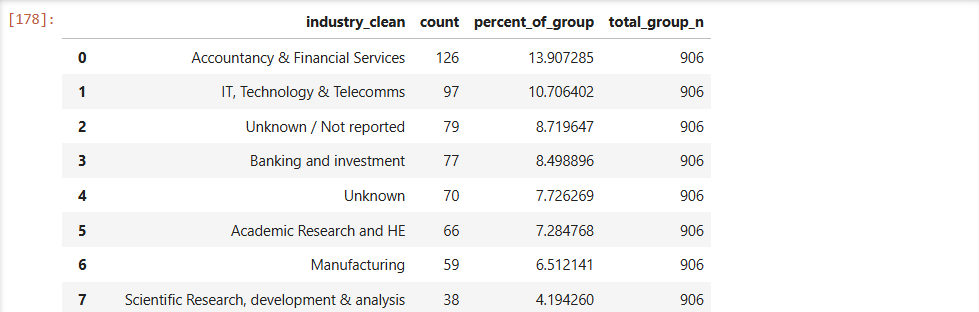

In [44]:
# Industry distribution among all employed graduates (full-time OR part-time)) - MEN only - uncomment to run
# === Including 'Unknown / Not reported" industry as a valid sub category === 
#industry_distribution_inc_unknown(graduates_all_merged, gender = 'M',
#    employment_types=['Full-time employment', 'Part-time employment'])
# **Note:** The data include multiple small cells; an excerpt of the resulting output is shown below for illustration.

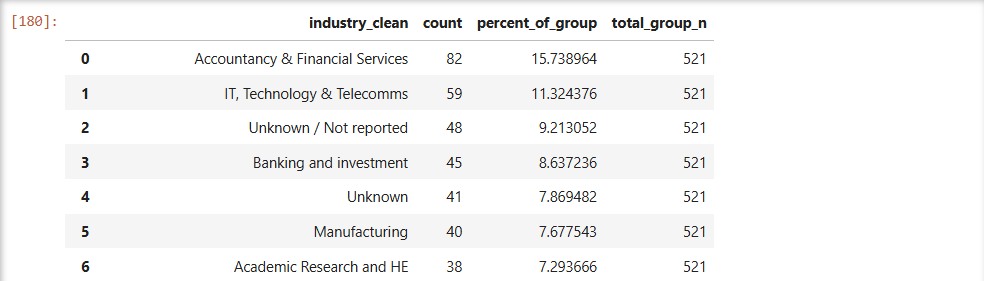

In [45]:
# Industry distribution among all employed graduates (full-time OR part-time)) - WOMEN only - uncomment to run
# === Including 'Unknown / Not reported" industry as a valid sub category === 
#industry_distribution_inc_unknown(graduates_all_merged, gender = 'F',
#    employment_types=['Full-time employment', 'Part-time employment'])
# **Note:** The data include multiple small cells; an excerpt of the resulting output is shown below for illustration.

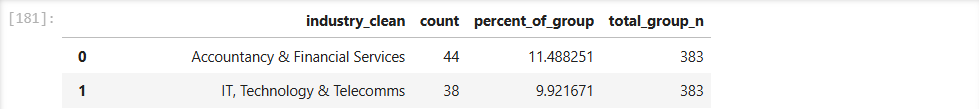

A: **Accountancy & Financial Services** was the most common industry sector among Mathematical and Physical Science graduates overall (across both cohorts and all genders, n=906), with approximately **14%** of employed graduates working in this sector (126 graduates). Another common destination across genders was **IT, Technology & Telecomms**, accounting for approximately **11%** of employed graduates. These top destinations were shared across genders. For further exploration of sector destinations by gender see the flow chart (gender -> destinations) towards the end of this notebook.

## Visual analysis

This section focuses on unemployment as an outcome metric. It builds ranked tables and visual comparisons (by department, gender, and ethnicity), and then formats those outputs into presentation-ready visuals. The same logic is later used to surface diversity and representation context (e.g. gender balance and ethnicity mix).

### Defining a minimum subgroup-size threshold to ensure confidence and interpretability

To ensure that visualised subgroup comparisons are **statistically interpretable and responsibly disclosed**, all subgroup-based figures in this chapter apply a **fixed minimum subgroup-size threshold**. Estimates based on very small numbers of respondents are excluded from visualisation.

Subgroup-level proportions (e.g. unemployment rates by gender, ethnicity, or department) become highly unstable when calculated from small samples. With low counts, even a change of one or two observations can result in large swings in percentage values, increasing the risk of over-interpreting random variation rather than underlying patterns.

For this reason, **a minimum threshold of 40 respondents with known outcomes** is applied consistently across all visualisations. This threshold is motivated by standard sampling-error considerations for proportion estimates: at subgroup sizes of approximately 40–50 observations, estimated proportions typically carry a margin of error of roughly ±10–15 percentage points at the 95% confidence level, depending on the underlying prevalence. While still coarse, this level of precision provides a basic safeguard against extreme volatility in reported rates.

This threshold is applied uniformly across all subgroup-based analyses to promote **consistency, transparency, and reproducibility**, and to ensure that excluded categories are handled systematically rather than selectively.

By grounding inclusion criteria in sampling-error logic rather than data-dependent optimisation, this approach prioritises analytical integrity and disclosure control, while maintaining sufficient coverage to support exploratory, hypothesis-generating analysis.

**For transparency and auditability, each visualisation is accompanied by a concise documentation note** specifying the number of categories shown and excluded, as well as the total number of respondents suppressed due to the minimum subgroup-size threshold. This ensures that readers can clearly distinguish between patterns observed in the displayed data and information excluded on governance grounds.

An example of such a documentation note is shown below:

> **Note:** Departments shown: 9 / 10 | Departments excluded entirely because no group had n ≥ 40: Faculty of Mathematical and Physical Sciences | Cells with n < 40 were suppressed (excluded respondents: 31).

### Exploring unemployment: Tables & figures

In [46]:
# Documenting key figures
# define total population of graduates as an onject
total_grads = len(graduates_all_merged)
print("Total number of graduates:", total_grads)
# Average unemployment rate across graduates (Maths) 
avg_unemployment_rate = (graduates_all_merged
    # keeps only records of graduates who actually reported an outcome (respondents):
    .loc[graduates_all_merged['graduate_outcomes_activity'].notna(), 'graduate_outcomes_activity'] 
    # flags True for unemployed, False for employed or any other valid category:
    .eq('Unemployed') # calculates the share of True values among those respondents.
    .mean() * 100)
print("Average unemployment rate across graduates:", avg_unemployment_rate)

Total number of graduates: 4812
Average unemployment rate across graduates: 7.381258023106548


In [47]:
# define a function that returns unemployment rates by different features
def unemployment_summary_by_group_table(
    data,
    groupby_dim,                 # e.g. 'gender', 'ethnicity', 'department'
    department=None,
    faculty=None,
    fee_status=None,
    industry=None,
    year=None,
    gender=None,
    ethnicity=None,
    min_n: int = 40 
):
    """
    Returns:
      summary (DataFrame): unemployment by group
      cohort_size (int): total graduates after filters (before dropping missing outcome)
    """

    df = data.copy()

    # apply filters
    if department is not None:
        df = df[df['department'] == department]
    if faculty is not None:
        df = df[df['faculty'] == faculty]
    if fee_status is not None:
        df = df[df['fee_status'] == fee_status]
    if industry is not None:
        df = df[df['industry_sector_employed'] == industry]
    if year is not None:
        df = df[df['year'] == year]
    if gender is not None:
        df = df[df['gender'] == gender]
    if ethnicity is not None:
        df = df[df['ethnicity'] == ethnicity]

    # this is the *full* filtered cohort size, regardless of outcome response
    cohort_size = len(df)

    # keep only rows with a known outcome for the unemployment calculation
    df = df[~df['graduate_outcomes_activity'].isna()].copy()

    df['is_unemployed'] = (df['graduate_outcomes_activity'] == 'Unemployed')

    summary = (
        df.groupby(groupby_dim, as_index=False)
          .agg(
              total_known_outcome=('id', 'size'),
              unemployed_count=('is_unemployed', 'sum')))
    # Apply minimum subgroup size threshold
    summary = summary[summary['total_known_outcome'] >= min_n].copy()

    summary['unemployment_rate_pct'] = (
        summary['unemployed_count'] /
        summary['total_known_outcome'].replace(0, pd.NA) * 100)
    summary['unemployment_rate_pct'] = summary['unemployment_rate_pct'].round(1)

    summary = summary.sort_values(
        by='unemployment_rate_pct',
        ascending=False
    ).reset_index(drop=True)

    # make a nicer-looking copy for display
    summary_display = summary.copy()
    summary_display['cohort_size'] = cohort_size  # keep it!
    summary_display['unemployment_rate_pct'] = summary_display['unemployment_rate_pct'].map(
        lambda x: f"{x:.1f}%")
    summary_display = summary_display.rename(columns={
        groupby_dim: groupby_dim.capitalize(),
        'total_known_outcome': 'Respondents with known outcome (n)',
        'unemployed_count': 'Unemployed (n)',
        'unemployment_rate_pct': 'Unemployment rate (%)',
        'cohort_size': 'Cohort size (total grads)'})

    #return summary_display, cohort_size
    summary_display['Cohort size (total grads)'] = cohort_size
    return summary_display

In [48]:
# Experimentation: exploring unemployment among speficic department
# explore unemployment rate among Chemistry graduates by gender - uncomment to explore
# unemployment_summary_by_group_table(data=graduates_all_merged, groupby_dim='gender', department='Chemistry')

**Methodological note: interpretation of unemployment rates for narrowly defined subgroups**

In the original dataset, unemployment among graduates of a spesific department is a **low-frequency outcome**, particularly when further disaggregated by gender. At this level of granularity, the number of unemployed individuals within each subgroup falls in the **single-digit range**. As a result, each individual observation represents a non-trivial share of the estimated unemployment rate, meaning that small absolute changes can translate into visibly large percentage-point differences.

Following the creation of the semi-synthetic expanded dataset, the absolute number of unemployed graduates of spesific departments by gender may change slightly. This occurs despite unemployment remaining a rare outcome within the cohort and does not reflect a structural change in employment outcomes. Rather, such differences are driven by **stochastic variation affecting a very small number of observations**.

This behaviour is an expected consequence of the synthetic expansion methodology used in this project. The approach relies on bootstrap-based resampling combined with a deliberately low level of controlled randomness, applied only to eligible non-outcome variables. While this process preserves overall distributions and percentage-based patterns for higher-frequency outcomes, **rare events can exhibit visible fluctuations when results are examined at very fine levels of disaggregation**, such as department-by-gender intersections.

For these reasons, **unemployment rates for narrowly defined subgroups (e.g. individual departments disaggregated by gender) are included for exploratory purposes only**. While such visualisations meet the minimum respondent-count threshold applied throughout the notebook, they remain sensitive to small absolute numbers of unemployment events and should therefore be interpreted with particular caution.

In [49]:
# double-check the unemployment counts - uncomment to explore
#(graduates_all_merged.query("department == 'Chemistry' and not graduate_outcomes_activity.isna()")
#                     .groupby(['gender', 'graduate_outcomes_activity'])
#                     .size()  # Counts rows for each combination.
#                     .unstack(fill_value=0))   # Displays side-by-side; show 0 where there are no records, instead of missing (NaN).

In [50]:
# Exploring unenployment rate among all graduates (Mathematical and Physical Sciences)
# Using the function to explore unemployment rates by year - all graduates
unemployment_summary_by_group_table(data=graduates_all_merged, groupby_dim='year')

,Year,Respondents with known outcome (n),Unemployed (n),Unemployment rate (%),Cohort size (total grads)
0,2022-23,695,61,8.8%,4812
1,2021-22,863,54,6.3%,4812


In [51]:
# Using the function to explore unemployment rates by gender - all graduates
unemployment_summary_by_group_table(data=graduates_all_merged, groupby_dim='gender')

,Gender,Respondents with known outcome (n),Unemployed (n),Unemployment rate (%),Cohort size (total grads)
0,F,640,48,7.5%,4812
1,M,916,67,7.3%,4812


In [52]:
# Explore outcomes by gender - uncomment to run
#(graduates_all_merged.query("graduate_outcomes_activity.notna()").groupby(['gender', 'graduate_outcomes_activity'])
#                     .size()  # Counts rows for each combination.
#                     .unstack(fill_value=0))   # Displays side-by-side; show 0 where there are no records, instead of missing (NaN).

In [53]:
# Using the function to explore unemployment rates by fee status - all graduates
unemployment_summary_by_group_table(data=graduates_all_merged, groupby_dim='fee_status')

,Fee_status,Respondents with known outcome (n),Unemployed (n),Unemployment rate (%),Cohort size (total grads)
0,Overseas,274,29,10.6%,4812
1,UK,1026,74,7.2%,4812
2,EU,258,12,4.7%,4812


In [54]:
# Using the function to explore unemployment rates by ethnicity - all graduates
unemployment_summary_by_group_table(data=graduates_all_merged, groupby_dim='ethnicity')

,Ethnicity,Respondents with known outcome (n),Unemployed (n),Unemployment rate (%),Cohort size (total grads)
0,Chinese,253,34,13.4%,4812
1,Unknown,78,6,7.7%,4812
2,White,762,49,6.4%,4812
3,Other ethnic background,52,3,5.8%,4812
4,Asian,270,15,5.6%,4812
5,Mixed,104,5,4.8%,4812


In [55]:
# Using the function to explore unemployment rates across departments
unemployment_summary_by_group_table(data=graduates_all_merged, groupby_dim='department')

,Department,Respondents with known outcome (n),Unemployed (n),Unemployment rate (%),Cohort size (total grads)
0,Mathematics,264,33,12.5%,4812
1,Statistical Science,142,13,9.2%,4812
2,Physics and Astronomy,364,29,8.0%,4812
3,Natural Sciences,121,9,7.4%,4812
4,Earth Sciences,138,10,7.2%,4812
5,Science and Technology Studies,68,4,5.9%,4812
6,Chemistry,274,12,4.4%,4812
7,Institute for Risk and Disaster Reduction,63,2,3.2%,4812
8,Space and Climate Physics,93,2,2.2%,4812


**Note:** In the current implementation, the column *“Cohort size (total grads)”* represents the total number of graduates in scope for the entire analysis (after filters are applied, but before dropping missing outcomes), and therefore repeats the same value for all rows. Future refinements may include adding: **(a)** a per-group cohort size (i.e., total graduates relevant to each subgroup), and **(b)** a response rate column unique to each group (respondents / total per group). In this workflow, response rates are instead calculated and displayed automatically in the subtitle of visual outputs generated by the companion plotting function (`plot_rate_bars`).

## Interpretation and methodological scope

**Important note on interpretation.**
Unemployment events in the sample data are relatively rare. As a result, several unemployment rates reported in this section are based on small absolute numbers of unemployed graduates, even where the total number of respondents with known outcomes for the group in question exceeds standard disclosure and reliability thresholds (set prior to visualisation at n ≥ 40). 

This analysis should therefore be interpreted as **exploratory and diagnostic**, rather than as definitive evidence of labour-market demand or department-level performance. Observed differences in unemployment rates are intended to highlight **potential risk concentrations and directional signals**, not to support fine-grained ranking or causal claims.

### **Best-practice guidance for future application**

For future applications of this workflow using larger or more complete Graduate Outcomes datasets, best practice would be to complement respondent-count thresholds (e.g. minimum  respondents with known outcomes, set here to n ≥ 40) with an additional **event-count heuristic (minimum number of unemployment events)**. In particular, unemployment rates should ideally be interpreted only where the number of unemployed graduates within a given group reaches a minimum of **approximately 10 events**, to ensure basic statistical stability.

Achieving such thresholds is likely to require sample sizes substantially larger than those used in this exploratory analysis - potentially on the order of several times the current cohort size - depending on the underlying unemployment prevalence.

### **Analytical intent and use of findings**

The primary purpose of this project is to build and demonstrate a **transparent, governance-aware analytical workflow** for exploring graduate unemployment across departments and demographic intersections, rather than to make claims about current labour-market conditions. All analytical perspectives, practical takeaways, and policy-oriented suggestions presented here and in the complementary dashboard decks should be treated as **testable hypotheses**, to be validated using fuller, real-world Graduate Outcomes data.

Stakeholders with direct access to complete GOS datasets may apply and extend this workflow to generate robust, unbiased, and policy-relevant evidence to support efforts to reduce unemployment among STEM graduates in the UK and beyond.

### Exploring unemployment: visualisations

Visualisations follow a **semi-structured, exploratory approach**. Many charts - including vertical and horizontal bar plots, lollipop charts, pie charts, and summary tables - are generated using **parameterised, reusable plotting functions**. Other figures are produced through **focused, one-off queries** designed to address specific analytical questions and to support downstream use in presentation slides

In [56]:
# importing additional libraries
import textwrap
from matplotlib.colors import to_rgba
from matplotlib.patches import Circle
from matplotlib.patches import Patch
import plotly.colors as pc
import plotly.graph_objects as go
from __future__ import annotations
from dataclasses import dataclass
from typing import Dict, Iterable, List, Optional, Sequence, Tuple, Union

In [57]:
# Define palettes mapping

# gender 
#gender_colors = {"F": "#B9E3F1", "M": "#4C92B5"}
gender_colors = {'F':'#B9E3F1','M':"#4C92B5", 'O':'#6E6E6E'}
gender_colors_mwo= {"Men": "#4C92B5","Women": "#B9E3F1","Other/Non-binary": "#6E6E6E"}

ethnicity_colors = {
    # Over-represented / dominant
    'Chinese': '#1B4F72',        # deep teal-blue (strong presence)
    'White':   '#4C92B5',        # mid blue (large but less dominant than Chinese)
    # Medium representation
    'Asian':   '#8FB9C8',        # desaturated blue-grey (in-between)
    # Under-represented / at-risk
    'Black':   '#E76F51',        # strong orange-red (clear risk signal)
    'Mixed':   '#F4A261',        # softer orange (still at-risk, less extreme)
    'Other ethnic background': '#F6BD60',  # amber / caution
    # Neutral / excluded
    'Unknown': '#E0E0E0'}

#unemployment
unemployment_colors = {
    "base":      "#FCE0CF",  # light orange (non-highlighted)
    "highlight": "#E07A5F",  # darker orange (highlighted category)
    "label":     "dimgray"}

# Industry palette (teal/blue/green + orangish-yellow accent + neutrals)
industry_palette = [
    "#F4A261",  # orange
    "#E9C46A",  # orangish-yellow accent
    "#7FB069",  # soft green
    "#3AAFA9",  # green-teal
    "#0F3D4C",  # deep teal
    "#2AA198",  # teal
    "#A8DADC",  # pale teal
    "#1B4F72",  # deep blue
    ]

# share of women scale - blue-grey endpoints
# Dark (low women share) -> Light (high women share)
INDUSTRY_LOW  = "#2f3e46"   # dark blue-grey
INDUSTRY_HIGH = "#d9ecef"   # light blue-grey

# build a stakeholder-facing palette for departments (by unemployment  rate)
def build_stakeholder_department_palette(df):
    """
    df must contain columns: department, rate_b, delta_pp
    Returns a dict: {department: hex_color}
    """
    ORANGE = "#F4A261"   # risk / worsening
    TEAL   = "#0F3D4C"   # resilient / improving
    GREY   = "#CFCFCF"   # neutral
    DARK_GREY = "#6E6E6E"  # optional for 'Faculty...' or aggregates

    palette = {}

    for _, r in df.iterrows():
        dept = r["department"]
        rate_b = float(r["rate_b"])
        delta  = float(r["delta_pp"])

        if (delta >= 3.0) or (rate_b >= 10.0):
            palette[dept] = ORANGE
        elif (delta <= -1.0) or (rate_b <= 3.0):
            palette[dept] = TEAL
        else:
            palette[dept] = GREY

    # Optional: force “aggregate” categories darker, if present
    if "Faculty of Mathematical and Physical Sciences" in palette:
        palette["Faculty of Mathematical and Physical Sciences"] = DARK_GREY

    return palette

In [58]:
# setting design-related definitions and helpers

# --- circle size scaling (area units used by matplotlib scatter) ---
MIN_CIRCLE_SIZE = 1200   # smallest circle (your requirement)
SIZE_SCALE = 14         # controls how fast circles grow with % rate

# define the years available in the data
year_a = '2021-22'
year_b = '2022-23'

def scale_circle_size(rate_pct):
    # area grows with rate^2, making small increases visible
    return MIN_CIRCLE_SIZE + SIZE_SCALE * (rate_pct ** 2)

def rgba(hex_color, alpha):
    return to_rgba(hex_color, alpha)

# --- Unified coloring: convert hex to rgba with transparency ---
def hex_to_rgba(hex_color, alpha=0.45):
    hex_color = hex_color.lstrip("#")
    r = int(hex_color[0:2], 16)
    g = int(hex_color[2:4], 16)
    b = int(hex_color[4:6], 16)
    return f"rgba({r},{g},{b},{alpha})"

def nudge_duplicates(y_values, min_gap=0.55):
    """
    Given a list/array of y positions, return adjusted y positions so that
    items that share the same y (or are too close) are nudged apart.
    """
    # work in sorted order so nudges are stable
    idx_sorted = sorted(range(len(y_values)), key=lambda i: y_values[i])
    y_adj = list(y_values)

    last_y = None
    for i in idx_sorted:
        y = y_adj[i]
        if last_y is None:
            last_y = y
            continue
        if (y - last_y) < min_gap:
            y_adj[i] = last_y + min_gap
            last_y = y_adj[i]
        else:
            last_y = y
    return y_adj

# alternative
def scatter_radius_in_ydata(ax, s):
    """
    Convert scatter size s (points^2) into a radius in *y-data units*.
    """
    r_pts = np.sqrt(s / np.pi)  # radius in points
    r_px = r_pts * ax.figure.dpi / 72.0  # points -> pixels

    # pixels per 1 y-data unit
    (x0, y0) = ax.transData.transform((0, 0))
    (x1, y1) = ax.transData.transform((0, 1))
    px_per_y = abs(y1 - y0)

    return r_px / px_per_y

# helpers to interpolate colours

def lerp(a, b, t):
    return a + (b - a) * t

def hex_to_rgb(hex_color):
    hex_color = hex_color.lstrip("#")
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

def rgb_to_hex(rgb):
    return "#{:02x}{:02x}{:02x}".format(*[max(0, min(255, int(round(x)))) for x in rgb])

def blend_hex(c1, c2, t):
    r1, g1, b1 = hex_to_rgb(c1)
    r2, g2, b2 = hex_to_rgb(c2)
    return rgb_to_hex((lerp(r1, r2, t), lerp(g1, g2, t), lerp(b1, b2, t)))

In [59]:
# ============================================================
# VISUALISATION UTILITIES (GOVERNANCE + REUSABLE PREP)
# ============================================================
# setting the threshold fro displaying informatio
MIN_N=40
# -----------------------------
# Config (keep minimal)
# -----------------------------
@dataclass(frozen=True)
class Gov:
    MIN_N: int = 40

    # Core columns used throughout your notebook
    ID_COL: str = "id"
    YEAR_COL: str = "year"
    RESPONSE_STATUS_COL: str = "response_status"
    RESPONDED_VALUE: str = "Survey completed or partially completed"

    OUTCOME_COL: str = "graduate_outcomes_activity"
    UNEMPLOYED_VALUE: str = "Unemployed"

# -----------------------------
# Helpers: validation + filtering
# -----------------------------
def _require_cols(df: pd.DataFrame, cols: Sequence[str], where: str = "") -> None:
    missing = [c for c in cols if c not in df.columns]
    if missing:
        ctx = f" ({where})" if where else ""
        raise KeyError(f"Missing required columns{ctx}: {missing}")

def apply_filters(
    df: pd.DataFrame,
    filters: Optional[Dict[str, Union[Any, Sequence[Any], Callable[[pd.Series], pd.Series]]]] = None
) -> pd.DataFrame:
    """
    Minimal, explicit filtering.
    filters examples:
      {"faculty": "Mathematical and Physical Sciences"}
      {"year": ["2021-22", "2022-23"]}
      {"department": lambda s: s.notna()}
    """
    if not filters:
        return df

    out = df
    for col, rule in filters.items():
        _require_cols(out, [col], where="apply_filters")

        if callable(rule):
            mask = rule(out[col])
            if not isinstance(mask, pd.Series) or mask.dtype != bool:
                raise ValueError(f"Filter callable for '{col}' must return a boolean Series.")
            out = out.loc[mask]
        elif isinstance(rule, (list, tuple, set)):
            out = out.loc[out[col].isin(rule)]
        else:
            out = out.loc[out[col] == rule]

    return out

# -----------------------------
# Governance-aware denominators
# -----------------------------
def add_response_flags(
    df: pd.DataFrame,
    *,
    outcome_col: str,
    responded_flag_col: str = "_responded",
    has_outcome_col: str = "_has_outcome"
) -> pd.DataFrame:
    """
    Adds:
      - _responded: response_status indicates survey completed/partial
      - _has_outcome: outcome_col is not null (used as respondent-denominator in many of your plots)
    """
    _require_cols(df, [outcome_col], where="add_response_flags")
    out = df.copy()

    # _responded is useful for response-rate charts; _has_outcome is useful for outcome-based denominators.
    if "response_status" in out.columns:
        out[responded_flag_col] = out["response_status"].eq(Gov.RESPONDED_VALUE)
    else:
        out[responded_flag_col] = False

    out[has_outcome_col] = out[outcome_col].notna()
    return out

# -----------------------------
# Core: build tidy summary + apply MIN_N + auto-drop empty x
# -----------------------------
@dataclass(frozen=True)
class MinNMeta:
    min_n: int
    x_col: str
    hue_col: Optional[str]
    # Counts used in notes
    excluded_respondents: int
    respondents_shown: int
    total_shown: int
    n_x_shown: int
    n_x_all: int
    excluded_x: Tuple[str, ...]  # x categories removed entirely
    cohort_size: int
    cohort_size_shown_x: int
    respondents_all_shown_x: int

def summarise_unemployment(
    data: pd.DataFrame,
    *,
    x_col: str,
    hue_col: Optional[str] = None,
    filters: Optional[Dict[str, Any]] = None,
    min_n: int = Gov.MIN_N,
    id_col: str = Gov.ID_COL,
    outcome_col: str = Gov.OUTCOME_COL,
    unemployed_value: str = Gov.UNEMPLOYED_VALUE,
    x_order: Optional[Sequence[Any]] = None,
    hue_order: Optional[Sequence[Any]] = None
) -> Tuple[pd.DataFrame, MinNMeta]:
    """
    Returns a tidy (long) summary df with:
      n_total, n_resp, n_unemp, rate_pct
    Governance:
      - drop rows (cells) where n_resp < min_n
      - drop x groups where no cells remain

    This matches the behaviour you’ve been using: automatic dropping, no extra modes/options.
    """
    _require_cols(data, [id_col, x_col, outcome_col], where="summarise_unemployment")
    if hue_col is not None:
        _require_cols(data, [hue_col], where="summarise_unemployment")

    df = apply_filters(data, filters)
    cohort_size = len(df)

    # Flags
    df = add_response_flags(df, outcome_col=outcome_col)
    df["_is_unemp"] = df[outcome_col].eq(unemployed_value)

    group_cols = [x_col] + ([hue_col] if hue_col else [])
    grp = df.groupby(group_cols, dropna=False)

    base = (grp[id_col].size().rename("n_total").reset_index()
        .merge(grp["_has_outcome"].sum().rename("n_resp").reset_index(), on=group_cols, how="left")
        .merge(grp["_is_unemp"].sum().rename("n_unemp").reset_index(), on=group_cols, how="left"))

    base["n_resp"] = base["n_resp"].fillna(0).astype(int)
    base["n_unemp"] = base["n_unemp"].fillna(0).astype(int)
    base["rate_pct"] = np.where(base["n_resp"] > 0, base["n_unemp"] / base["n_resp"] * 100, np.nan)

    # Enforce ordering (optional, but keeps visuals consistent)
    if x_order is not None:
        base[x_col] = pd.Categorical(base[x_col], categories=list(x_order), ordered=True)
    if hue_col is not None and hue_order is not None:
        base[hue_col] = pd.Categorical(base[hue_col], categories=list(hue_order), ordered=True)

    # --- Apply governance MIN_N (drop low-n cells) ---
    before_total_respondents = int(base["n_resp"].sum())
    base_visible = base.loc[base["n_resp"] >= int(min_n)].copy()

    # Drop x groups that became empty
    x_all = base[x_col].dropna().astype(str).unique().tolist()
    x_shown = base_visible[x_col].dropna().astype(str).unique().tolist()
    excluded_x = tuple([x for x in x_all if x not in set(x_shown)])
    #excluded_x = tuple(sorted(set(map(str, x_all)) - set(map(str, x_shown))))

    # If hue exists, ensure that after dropping x-empty we truly only keep shown x
    if base_visible.shape[0] > 0:
        base_visible = base_visible.loc[base_visible[x_col].astype(str).isin(set(map(str, x_shown)))]

    excluded_respondents = before_total_respondents - int(base_visible["n_resp"].sum())

    # ---------------------------------------------------------
    # Denominator + respondents for SHOWN x-categories
    # (after analytic filters, before MIN_N)
    # ---------------------------------------------------------
    base_scope = base.loc[
        base[x_col].astype(str).isin(set(map(str, x_shown)))].copy()
    cohort_size_shown_x = int(base_scope["n_total"].sum())
    respondents_all_shown_x = int(base_scope["n_resp"].sum())

    meta = MinNMeta(
        min_n=int(min_n),
        x_col=x_col,
        hue_col=hue_col,
        excluded_respondents=int(excluded_respondents),
        respondents_shown=int(base_visible["n_resp"].sum()),
        total_shown=int(base_visible["n_total"].sum()),
        n_x_shown=len(x_shown),
        n_x_all=len(x_all),
        excluded_x=excluded_x,
        cohort_size=int(cohort_size),
        cohort_size_shown_x=cohort_size_shown_x,
        respondents_all_shown_x=respondents_all_shown_x)

    return base_visible, meta

# -----------------------------
# Standardised text: subtitle + footnote
# -----------------------------
def subtitle_respondent_rate(meta: MinNMeta) -> str:
    """
    Subtitle for respondent-based plots, computed on SHOWN CELLS ONLY (aligned with the plotted denominator).
    """
    rr = (meta.respondents_shown / meta.total_shown * 100) if meta.total_shown else 0.0
    return f"(shown bars only: n={meta.respondents_shown:,} of {meta.total_shown:,} graduates; {rr:.1f}% response)"

def footnote_min_n(meta: MinNMeta, *, label_x: Optional[str] = None, label_hue: Optional[str] = None) -> str:
    """
    One governance footnote: what was suppressed and what was dropped.
    """
    x_name = (label_x or meta.x_col).capitalize()
    x_display_map = {'M': 'Men', 'F': 'Women', 'O': 'Other/Non-binary'}
    excluded_display = [x_display_map.get(x, x) for x in meta.excluded_x]
    hue_name = (label_hue or meta.hue_col).capitalize() if meta.hue_col else None

    dropped_x_part = (f"{x_name}s excluded entirely because no group had n ≥ {meta.min_n}: "
        f"{', '.join(excluded_display) if excluded_display else 'None'}.")

    if hue_name:
        suppressed_part = f"{hue_name}-specific cells with n < {meta.min_n} were suppressed (excluded respondents: {meta.excluded_respondents:,})."
    else:
        suppressed_part = f"Cells with n < {meta.min_n} were suppressed (excluded respondents: {meta.excluded_respondents:,})."

    return f"Note: {x_name}s shown: {meta.n_x_shown} / {meta.n_x_all} | {dropped_x_part} | {suppressed_part}"

# -----------------------------
# For non-respondent plots (e.g., women/diversity across ALL graduates)
# -----------------------------
def summarise_share(
    data: pd.DataFrame,
    *,
    group_col: str,
    value_col: str,
    value_is: Any,
    filters: Optional[Dict[str, Any]] = None,
    id_col: str = Gov.ID_COL
) -> pd.DataFrame:
    """
    Generic representation summary across ALL graduates (not respondent-based):
      share_pct = count(value==value_is) / total * 100
    Returns tidy df: group_col, n_total, n_value, share_pct
    """
    _require_cols(data, [id_col, group_col, value_col], where="summarise_share")
    df = apply_filters(data, filters)

    grp = df.groupby(group_col, dropna=False)
    out = (
        grp[id_col].size().rename("n_total").reset_index()
        .merge(grp.apply(lambda g: int((g[value_col] == value_is).sum())).rename("n_value").reset_index(),
               on=group_col, how="left"))
    out["n_value"] = out["n_value"].fillna(0).astype(int)
    out["share_pct"] = np.where(out["n_total"] > 0, out["n_value"] / out["n_total"] * 100, np.nan)
    return out

def footnote_all_graduates(*, filters_desc: Optional[str] = None) -> str:
    """
    Minimal note for ALL-graduates denominators (no response-rate language).
    """
    if filters_desc:
        return f"Note: Denominator is all graduates in-scope. Filters applied: {filters_desc}."
    return "Note: Denominator is all graduates in-scope."

# single-dimension quick summary
def unemployment_summary_by_group_plot(data, groupby_dim, *, filters=None, min_n=40):
    plot_df, meta = summarise_unemployment(
        data,
        x_col=groupby_dim,
        hue_col=None,
        filters=filters,
        min_n=min_n)

    return plot_df, meta

In [60]:
# function that draws a chart from the summary data. Supports vertical bars (with % labels above and n= below), 
# and also an alternate horizontal "lollipop" style for ranking.  
# Automatically annotates response coverage in a subtitle.
def plot_rate_bars(
    df,
    category_col,
    rate_col,
    n_col,
    *,
    title=None,
    subtitle=None,
    footnote=None,
    meta=None,              # MinNMeta (from summarise_unemployment)
    print_note=True,        # print governance note before plotting
    xlabel=None,
    ylabel=None,
    sort=True,
    ascending=True,
    figsize=(12, 6),
    bar_color=None,
    label_color=None,
    rotate_x=45,
    highlight_category=None,
    highlight_color=None,
    savepath=None,
    direction='vertical',   # 'vertical' or 'horizontal'
    order='ascending',       # 'ascending' or 'descending'
    style='bar',            # 'bar' (default) or 'circle' (vertical only)
    circle_size=900,
    palette="gender",
    add_trend_line=False,
    trend_line_color="dimgray",):

    df_plot = df.copy()
    # -------------------------
    # Governance note: print (not on chart)
    # -------------------------
    if print_note and meta is not None:
        print(footnote_min_n(meta, label_x=category_col)) 

    # palette can be a string ("gender"/"unemployment") OR a dict mapping category->hex
    if isinstance(palette, dict):
        # Use per-category colors; fallback if missing
        label_color = label_color or "dimgray"
        bar_color = bar_color or "#CFCFCF"   # fallback
        highlight_color = highlight_color or bar_color
    else:
        if bar_color is None or highlight_color is None or label_color is None:
            if palette == "gender":
                bar_color = bar_color or gender_colors["F"]
                highlight_color = highlight_color or gender_colors["M"]
                label_color = label_color or "dimgray"
            elif palette == "unemployment":
                bar_color = bar_color or unemployment_colors["base"]
                highlight_color = highlight_color or unemployment_colors["highlight"]
                label_color = label_color or unemployment_colors["label"]
    if sort:
        ascending_flag = True if order == 'ascending' else False
        df_plot = df_plot.sort_values(by=rate_col, ascending=ascending_flag)

    colors = []
    for cat in df_plot[category_col].astype(str):
        if highlight_category is not None and cat == str(highlight_category):
            colors.append(highlight_color)
        elif isinstance(palette, dict):
            colors.append(palette.get(cat, bar_color))  # fallback if missing key
        else:
            colors.append(bar_color)
    fig, ax = plt.subplots(figsize=figsize)

    # ---------------------------------------------------------
    # VERTICAL: bars or circles
    # ---------------------------------------------------------
    if direction == 'vertical':
        ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f"{y:.0f}%"))
        max_rate = df_plot[rate_col].max() if len(df_plot) else 1
        ax.set_ylim(-max_rate * 0.15, max_rate * 1.15)

        if style == 'bar':
            bars = ax.bar(df_plot[category_col], df_plot[rate_col], 
                          color=colors, edgecolor="none")
            if add_trend_line and style == "bar":
                x = np.arange(len(df_plot))
                y = df_plot[rate_col].to_numpy()
                ax.plot(x, y, color=trend_line_color, linewidth=2, marker="o", zorder=4)

            # n= labels below bars
            for bar, n in zip(bars, df_plot[n_col]):
                ax.text(bar.get_x() + bar.get_width() / 2, -max_rate * 0.07,
                    f"n={int(n):,}", ha="center", va="top", fontsize=9, color=label_color)

            # % labels above bars
            for bar, rate in zip(bars, df_plot[rate_col]):
                ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + max_rate * 0.02,
                    f"{rate:.1f}%", ha="center", va="bottom", fontsize=9, color="black")

        elif style == 'circle':
            cats = df_plot[category_col].astype(str).tolist()
            x = np.arange(len(cats))
            y = df_plot[rate_col].to_numpy()
            if add_trend_line:
                ax.plot(x, y, color=trend_line_color, linewidth=2, marker="o", zorder=4)

            ax.scatter(x, y, s=circle_size, c=colors, edgecolors="none", zorder=3)
            ax.set_xticks(x)
            ax.set_xticklabels(cats)
            ax.set_xlim(-0.5, len(cats) - 0.5)

            # n= labels below circles
            for xi, n in zip(x, df_plot[n_col]):
                ax.text(xi, -max_rate * 0.07, f"n={int(n):,}",
                    ha="center", va="top", fontsize=9, color=label_color)

            # % labels above circles
            for xi, rate in zip(x, y):
                ax.text(xi, rate + max_rate * 0.02, f"{rate:.1f}%",
                    ha="center", va="bottom", fontsize=9, color="black")
        else:
            raise ValueError("style must be 'bar' or 'circle' for vertical charts")

    # ---------------------------------------------------------
    # HORIZONTAL: lollipop
    # ---------------------------------------------------------
    else:
        for ycat, val, color in zip(df_plot[category_col], df_plot[rate_col], colors):
            ax.plot([0, val], [ycat, ycat], color=color, lw=2)
            ax.scatter(val, ycat, color=color, s=60, zorder=3)
            ax.text(val + 0.5, ycat, f"{val:.1f}%", va='center', ha='left', fontsize=9)

        ax.invert_yaxis()
        ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:.0f}%"))

    # ---------------------------------------------------------
    # Subtitle automation
    # ---------------------------------------------------------
    subtitle_text = None

    if subtitle is not None:
        subtitle_text = subtitle

    elif meta is not None:
        # Correct denominator: relevant population for the SHOWN categories
        denom = int(meta.cohort_size_shown_x)

        # Correct respondents for response rate: ALL respondents (shown + excluded by MIN_N)
        respondents_all = int(meta.respondents_all_shown_x)
        rr = respondents_all / denom * 100 if denom else 0.0
        has_exclusions = (meta.excluded_respondents > 0) or (meta.n_x_shown < meta.n_x_all)

        if has_exclusions:
            subtitle_text = (f"(shown bars only: n={meta.respondents_shown:,} of {denom:,} graduates; "
                f"{rr:.1f}% response)")
        else:
            subtitle_text = (f"(n={respondents_all:,} of {denom:,} graduates; "
                f"{rr:.1f}% response)")

    fig.text(0.5, 0.96, title, ha="center", va="top", fontsize=14, fontweight="bold")
    if subtitle_text: 
        fig.text(0.5, 0.90, subtitle_text, ha="center", va="top", fontsize=12, color="dimgray")
    if direction == 'vertical':
        plt.setp(ax.get_xticklabels(), rotation=rotate_x, ha="right")

    # Keep axes for vertical bar charts 
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(True)
    ax.spines["bottom"].set_visible(True)
    ax.grid(axis="y" if direction == 'vertical' else "x", linestyle=":", alpha=0.35)

    if footnote:
        fig.text(0.01, 0.01, footnote, ha="left", va="bottom", fontsize=9, color="dimgray")
    plt.tight_layout(rect=[0, 0.06 if footnote else 0, 1, 0.88])
    if savepath:
        fig.savefig(savepath, dpi=300, bbox_inches="tight")
    plt.show()

#### **Unemployment by department**

Note: Departments shown: 9 / 10 | Departments excluded entirely because no group had n ≥ 40: Faculty of Mathematical and Physical Sciences. | Cells with n < 40 were suppressed (excluded respondents: 31).


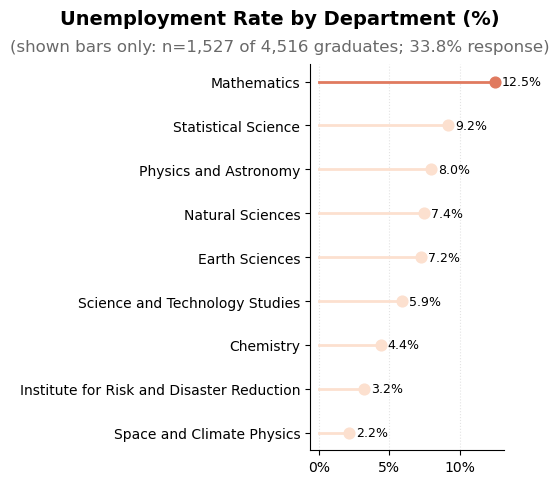

In [61]:
dept_unemp_plot, meta = summarise_unemployment(graduates_all_merged,
    x_col="department", hue_col=None, min_n=MIN_N)

plot_rate_bars(df=dept_unemp_plot, category_col="department", rate_col="rate_pct", n_col="n_resp",
    title="Unemployment Rate by Department (%)", meta=meta, print_note=True, palette="unemployment",
    direction="horizontal", order="descending", figsize=(5.5, 5),
    highlight_category="Mathematics", savepath="Unemployment_Rate_by_Department.png")

**Takeaway - Unemployment rate across departments**: 12.5% of Mathematics graduates reported being unemployed 15 months after graduation. This figure was greater than the averagae unemployment rate across graduates by approximately 5 percentage points (7.4%)

#### **Unemployment by gender**

Note: Genders shown: 2 / 3 | Genders excluded entirely because no group had n ≥ 40: Other/Non-binary. | Cells with n < 40 were suppressed (excluded respondents: 2).


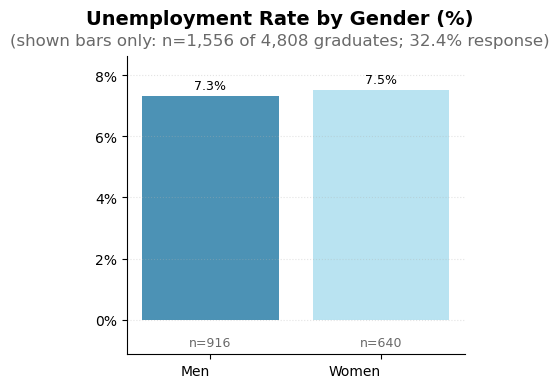

In [62]:
# Unemployment by gender
gen_unemp_plot, meta = summarise_unemployment(graduates_all_merged, x_col="gender",
    hue_col=None, min_n=MIN_N)

# Map gender codes AFTER summary (so meta stays correct)
gender_map = {'M': 'Men', 'F': 'Women', 'O': 'Other/Non-binary'}
gen_unemp_plot["gender"] = gen_unemp_plot["gender"].map(gender_map)

plot_rate_bars(df=gen_unemp_plot, category_col="gender", rate_col="rate_pct", n_col="n_resp",
    title="Unemployment Rate by Gender (%)", meta=meta, print_note=True, highlight_category="Men",
    palette="gender", style="bar", direction="vertical", figsize=(4, 4), rotate_x=0,
    savepath="Unemployment_Rate_by_Gender.png")

**Takeaway**: At faculty level, unemployment rates were similar across genders, ranging between 7–8% among respondents.

#### **Unemployment by year**

Note: Years shown: 2 / 2 | Years excluded entirely because no group had n ≥ 40: None. | Cells with n < 40 were suppressed (excluded respondents: 0).


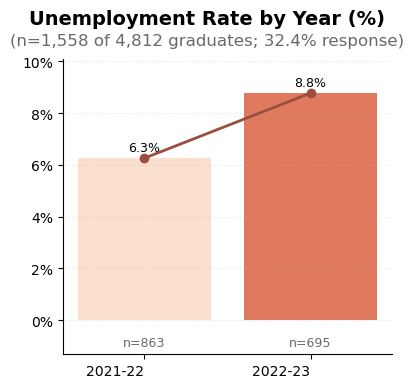

In [63]:
# Unemployment by year
year_unemp_plot, meta = summarise_unemployment(graduates_all_merged, x_col="year",
    hue_col=None, min_n=MIN_N)

plot_rate_bars(df=year_unemp_plot, category_col="year", rate_col="rate_pct", n_col="n_resp",
    title="Unemployment Rate by Year (%)", meta=meta, print_note=True, highlight_category="2022-23",
    palette="unemployment", add_trend_line=True, trend_line_color="#9A4F3F", figsize=(4, 4),
    rotate_x=0,savepath="Unemployment_Rate_by_Year.png" )

**Trend**: Unemployment increased by 2.5 percentage points between 2021–22 and 2022–23.

#### **Unemployment by fee status**

Note: Fee_statuss shown: 3 / 3 | Fee_statuss excluded entirely because no group had n ≥ 40: None. | Cells with n < 40 were suppressed (excluded respondents: 0).


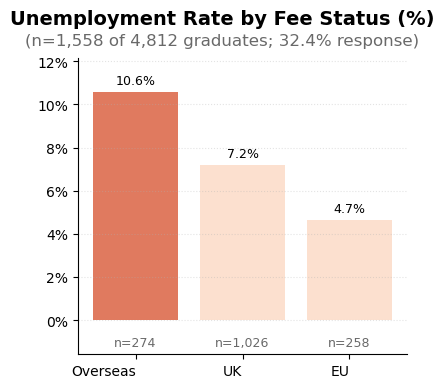

In [64]:
# Unemployment by Fee Status
fee_stat_unemp_plot, meta = summarise_unemployment(graduates_all_merged, x_col="fee_status",
    hue_col=None, min_n=MIN_N)

plot_rate_bars(df=fee_stat_unemp_plot, category_col="fee_status", rate_col="rate_pct",
    n_col="n_resp", title="Unemployment Rate by Fee Status (%)", meta=meta, print_note=True,
    highlight_category="Overseas", palette="unemployment", order="descending",
    figsize=(4, 4), rotate_x=0, savepath="Unemployment_Rate_by_Fee_Statue.png")

#### **Unemployment by ethnicity**

Note: Ethnicitys shown: 6 / 7 | Ethnicitys excluded entirely because no group had n ≥ 40: Black. | Cells with n < 40 were suppressed (excluded respondents: 39).


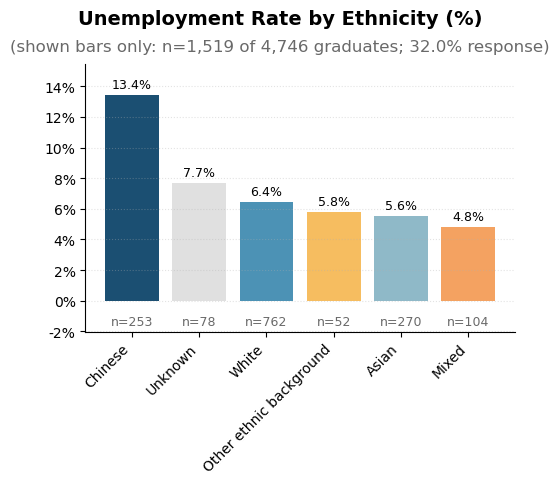

In [65]:
# Unemployment by Ethnicity
ethn_unemp_plot, meta = summarise_unemployment(graduates_all_merged, x_col="ethnicity",
    hue_col=None, min_n=MIN_N)

plot_rate_bars(df=ethn_unemp_plot, category_col="ethnicity", rate_col="rate_pct",
    n_col="n_resp", title="Unemployment Rate by Ethnicity (%)", meta=meta, print_note=True,
    palette=ethnicity_colors, order="descending", figsize=(5, 5),
    rotate_x=45, savepath="Unemployment_Rate_by_Ethnicity.png")

### **Comparisons by department across gender, ethnicities and status**

#### **Unemployment gender gap by department**

Note: Departments shown: 6 / 10 Excluded 4 department(s) where either nF or nM < 40 Excluded: Faculty of Mathematical and Physical Sciences, Institute for Risk and Disaster Reduction, Science and Technology Studies, Space and Climate Physics. (total excluded respondents: 254)


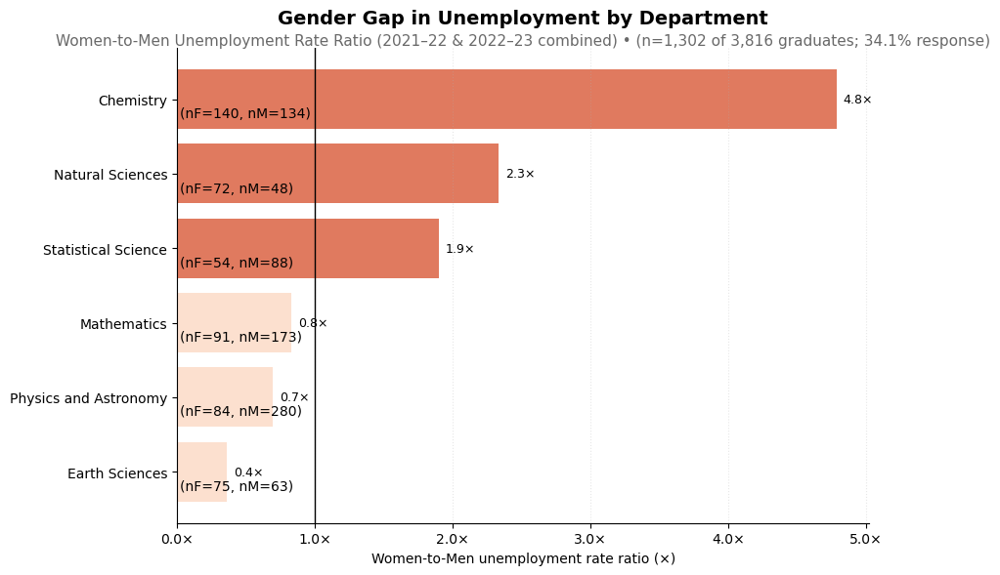

In [66]:
# Plotting the gender gap by department:
# Display a gender gap by calculating the ratio (F/M in unemployment)

df = graduates_all_merged.copy()

# keep only F/M for the ratio chart (but DO NOT drop missing outcomes yet)
df = df[df["gender"].isin(["F", "M"])].copy()

# define unemployment flag (NaN outcome -> False, will be excluded from counts later)
df["is_unemployed"] = (df["graduate_outcomes_activity"] == "Unemployed")

dept_gender_summary = (df.loc[~df["graduate_outcomes_activity"].isna()].groupby(["department", "gender"], as_index=False)
      .agg(total_known_outcome=("id", "size"), unemployed_count=("is_unemployed", "sum")))

dept_gender_summary["unemployment_rate_pct"] = (
    dept_gender_summary["unemployed_count"] /
    dept_gender_summary["total_known_outcome"].replace(0, pd.NA) * 100)

plot_dept_gender_df = dept_gender_summary.pivot(index="department", columns="gender", values="unemployment_rate_pct")
# build n by gender
n_by_gender = dept_gender_summary.pivot(index="department", columns="gender", values="total_known_outcome").fillna(0)

# Order department by overall unemployment
dept_unemp, _ = unemployment_summary_by_group_plot(data=graduates_all_merged, groupby_dim='department')
dept_unemp = dept_unemp.sort_values('rate_pct', ascending=True)
# reset index
plot_dept_gender_df = plot_dept_gender_df.reindex(dept_unemp["department"].tolist())
gap_df = plot_dept_gender_df.copy()

# compute ratio (Women ÷ Men)
gap_df['Ratio_Women_vs_Men'] = gap_df["F"] / gap_df["M"]

# handle divide-by-zero (e.g., if men's unemployment rate = 0)
gap_df['Ratio_Women_vs_Men'] = gap_df['Ratio_Women_vs_Men'].replace([np.inf, -np.inf], np.nan)

# Keep only departments where BOTH F and M meet threshold
eligible_departments = n_by_gender[(n_by_gender.get('F', 0) >= MIN_N) & (n_by_gender.get('M', 0) >= MIN_N)].index.tolist()

# Diagnostics
excluded_departments = [d for d in n_by_gender.index if d not in eligible_departments]
excluded_respondents = (n_by_gender.loc[excluded_departments, ["F", "M"]].sum().sum()
    if excluded_departments else 0)

print(f"Note: Departments shown: {len(eligible_departments)} / {n_by_gender.shape[0]} "
    f"Excluded {len(excluded_departments)} department(s) where "
    f"either nF or nM < {MIN_N} "
    f"Excluded: {', '.join(excluded_departments)}. "
    f"(total excluded respondents: {int(excluded_respondents)})")

# Filter gap dataframe to only eligible departments
gap_df_filtered = gap_df.loc[eligible_departments].copy()

# attach sample sizes for annotation (from filtered departments only)
gap_df_filtered['nF'] = [int(n_by_gender.loc[dept, 'F']) if ('F' in n_by_gender.columns and dept in n_by_gender.index) else 0
    for dept in gap_df_filtered.index]
gap_df_filtered['nM'] = [int(n_by_gender.loc[dept, 'M']) if ('M' in n_by_gender.columns and dept in n_by_gender.index) else 0
    for dept in gap_df_filtered.index]

# sort by ratio ascending (lowest ratios first)
gap_df_filtered = gap_df_filtered.sort_values('Ratio_Women_vs_Men', ascending=True)
included_departments = gap_df_filtered.index.tolist()
# -----------------------------
# Subtitle numbers (match plot)
# -----------------------------
# numerator/denominator must match the original chart: F/M only
respondents_all = int(graduates_all_merged.loc[(graduates_all_merged["department"].isin(included_departments)) &
        (graduates_all_merged["gender"].isin(["F", "M"])) & (~graduates_all_merged["graduate_outcomes_activity"].isna()),
        "id"].shape[0])

denom = int(graduates_all_merged.loc[(graduates_all_merged["department"].isin(included_departments)) &
        (graduates_all_merged["gender"].isin(["F", "M"])), "id"].shape[0])

rr = respondents_all / denom * 100 if denom else 0.0

subtitle_text = f"(n={respondents_all:,} of {denom:,} graduates; {rr:.1f}% response)"

# --- Plot ---
fig, ax = plt.subplots(figsize=(10,6))

bars = ax.barh(gap_df_filtered.index, gap_df_filtered['Ratio_Women_vs_Men'],
    color=np.where(gap_df_filtered['Ratio_Women_vs_Men'] > 1, "#E07A5F", "#FCE0CF"), edgecolor="none")

# labels like "1.7×" or "0.8×"
for bar, ratio, nf, nm in zip(bars, gap_df_filtered['Ratio_Women_vs_Men'], gap_df_filtered['nF'], gap_df_filtered['nM']):
    if pd.notnull(ratio):
        ax.text(bar.get_width() + 0.05, bar.get_y() + bar.get_height()/2, f"{ratio:.1f}×",
            va='center', ha='left', fontsize=9, color='black')
        ax.text(0.02, bar.get_y() + bar.get_height()/2 - 0.1, f"(nF={nf}, nM={nm})",
            va='top', ha='left', fontsize=10, color='black')

# reference line at 1×
ax.axvline(1, color='black', linewidth=1)
# format axis
ax.set_xlabel("Women-to-Men unemployment rate ratio (×)")
ax.set_ylabel("")
ax.set_title("Gender Gap in Unemployment by Department", fontsize=14, fontweight='bold', pad=18)
# subtitle line 
ax.text(0.5, 1.0, f"Women-to-Men Unemployment Rate Ratio (2021–22 & 2022–23 combined) • {subtitle_text}",
    transform=ax.transAxes, ha="center", va="bottom", fontsize=11, color="dimgray")
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:.1f}×"))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(axis='x', linestyle=':', alpha=0.3)
plt.tight_layout()
fig.savefig("gender_gep_in_unemployment.png", dpi=300, bbox_inches="tight")
plt.show()

**Takeaway** Large gender gaps are concentrated in Chemistry and Natural Sciences, while Physics and Astronomy and especially Earth Sciences show higher unemployment among men.

In [67]:
# Functions for plotting unemployment by two variables (intersections):
# ============================================================
#  UNEMPLOYMENT by DEPT × ETHNICITY (& Other intersections)
# - builds BOTH counts and rates from graduates_all_merged
# - keeps subgroups if at least one bar is visible
# - clear spacing between subgroups (group_gap)
# - labels >0% above bars
# - labels 0.0% ONLY when the bar is visible (n>=MIN_N), with subgroup name
#   and stacks 0% labels within the same department to avoid overlap
# - subgroup name on x-ticks; counts printed below axis (readable)
# - subtitle: response rate for SHOWN BARS ONLY 
# ============================================================
def build_unemp_base_and_mask(
    data: pd.DataFrame,
    x_col: str,
    hue_col: str,
    *,
    outcome_col: str = "graduate_outcomes_activity",
    unemployed_value: str = "Unemployed",
    id_col: str = "id",
    min_n: int = 40,
    filters: dict | None = None,
    x_order: list | None = None,
    hue_order: list | None = None,
):
    """
    Recreating template logic:
    - build base from row-level data
    - respondent denom = outcome notna
    - rate = unemp / respondents
    - visible_mask = n_resp >= min_n
    - keep x if ANY hue visible (Option B behaviour)
    - suppress small-n cells (NaN)
    - subtitle uses SHOWN BARS ONLY (aligned)
    - returns everything needed for plotting + the top Note line pieces
    """
    df = data.copy()
    # filters
    if filters:
        for col, val in filters.items():
            if isinstance(val, (list, tuple, set)):
                df = df[df[col].isin(val)].copy()
            else:
                df = df[df[col] == val].copy()

    # base flags
    df["_has_outcome"] = df[outcome_col].notna()
    df["_is_unemp"] = df[outcome_col].eq(unemployed_value)

    grp = df.groupby([x_col, hue_col], dropna=False)

    base = (grp[id_col].size().rename("n_total").reset_index()
        .merge(grp["_has_outcome"].sum().rename("n_resp").reset_index(), on=[x_col, hue_col], how="left")
        .merge(grp["_is_unemp"].sum().rename("n_unemp").reset_index(), on=[x_col, hue_col], how="left"))

    base["n_resp"] = base["n_resp"].fillna(0).astype(int)
    base["n_unemp"] = base["n_unemp"].fillna(0).astype(int)
    base["rate_pct"] = np.where(base["n_resp"] > 0, base["n_unemp"] / base["n_resp"] * 100, np.nan)

    # wide tables
    rate_wide = base.pivot(index=x_col, columns=hue_col, values="rate_pct")
    n_resp_wide = base.pivot(index=x_col, columns=hue_col, values="n_resp").fillna(0).astype(int)
    n_total_wide = base.pivot(index=x_col, columns=hue_col, values="n_total").fillna(0).astype(int)

    # enforce orders if provided (important for consistent styling)
    if hue_order is not None:
        rate_wide = rate_wide.reindex(columns=hue_order)
        n_resp_wide = n_resp_wide.reindex(columns=hue_order)
        n_total_wide = n_total_wide.reindex(columns=hue_order)
    if x_order is not None:
        rate_wide = rate_wide.reindex(index=x_order)
        n_resp_wide = n_resp_wide.reindex(index=x_order)
        n_total_wide = n_total_wide.reindex(index=x_order)

    # suppress bars where n_resp < MIN_N; keep x if ANY visible
    visible_mask = n_resp_wide.ge(min_n)
    rate_plot = rate_wide.where(visible_mask)
    x_keep = visible_mask.any(axis=1)
    rate_plot = rate_plot.loc[x_keep].copy()
    n_resp_plot = n_resp_wide.loc[x_keep].copy()
    n_total_plot = n_total_wide.loc[x_keep].copy()
    visible_mask_plot = visible_mask.loc[x_keep].copy()

    # insert ordering:
    x_order = (rate_plot.max(axis=1, skipna=True).sort_values(ascending=True).index)
    rate_plot = rate_plot.loc[x_order]
    n_resp_plot = n_resp_plot.loc[x_order]
    n_total_plot = n_total_plot.loc[x_order]
    visible_mask_plot = visible_mask_plot.loc[x_order]

    # x categories shown + excluded entirely
    x_shown = rate_plot.index.tolist()
    excluded_x = visible_mask.any(axis=1).eq(False)
    excluded_x = excluded_x[excluded_x].index.tolist()

    # excluded respondents (suppressed cells inside shown x groups)
    suppressed_mask_plot = visible_mask_plot.eq(False)
    excluded_respondents = int(n_resp_plot.where(suppressed_mask_plot, other=0).sum().sum())

    # subtitle: SHOWN BARS ONLY (aligned)
    visible_pairs = visible_mask_plot.stack().reset_index()
    visible_pairs.columns = [x_col, hue_col, "is_visible"]
    visible_pairs = visible_pairs[visible_pairs["is_visible"]][[x_col, hue_col]]

    base_visible = base.merge(visible_pairs, on=[x_col, hue_col], how="inner")
    respondents_plotted = int(base_visible["n_resp"].sum())
    total_graduates_plotted = int(base_visible["n_total"].sum())
    response_rate_plotted = (respondents_plotted / total_graduates_plotted * 100) if total_graduates_plotted else 0

    subtitle_text = (f"(shown bars only: n={respondents_plotted:,} of {total_graduates_plotted:,} graduates; "
        f"{response_rate_plotted:.1f}% response)")

    note_text = (f"Note: {x_col.capitalize()}s shown: {len(x_shown)} / {visible_mask.shape[0]} | "
        f"{x_col.capitalize()}s excluded entirely because no {hue_col} group had n ≥ {min_n}: "
        f"{', '.join(excluded_x) if excluded_x else 'None'} | "
        f"{hue_col.capitalize()}-specific bars with n < {min_n} were suppressed "
        f"(excluded respondents: {excluded_respondents:,}).")

    return {"base": base, "rate_plot": rate_plot, "n_resp_plot": n_resp_plot, "n_total_plot": n_total_plot,
        "visible_mask_plot": visible_mask_plot, "x_shown": x_shown, "excluded_x": excluded_x,
        "excluded_respondents": excluded_respondents, "subtitle_text": subtitle_text, "note_text": note_text}

In [68]:
# Plotting function (Template-style)
# produces group_gap, vertical separators, counts under axis, legend on the right, and note line.
def plot_intersection_template_style(
    rate_plot: pd.DataFrame,
    n_resp_plot: pd.DataFrame,
    *,
    x_label_wrap: int = 18,
    title_lines: list[str],
    subtitle_text: str,
    note_text: str | None = None,
    plot_kind: str = "grouped_rate", # "grouped_rate" (current) OR "stacked_share"
    overall_marker: bool = False,
    overall_rate:pd.Series | None = None, #indexed by x category
    overall_label: str = "Overall (all respondents with known outcomes in x category)",
    print_overall_note: bool = True,
    colors: dict | None = None,
    figsize=(16, 7),
    bar_width=0.2,
    group_gap=0.55,
    legend_title=None,
    counts_formatter=None,   # function(row: pd.Series) -> str
    rotate_x=0,
    savepath: str | None = None,
    ylabel="Unemployment rate (%)",):
    """
    rate_plot: wide DF (index=x groups, cols=hues) with NaN = suppressed
    n_resp_plot: wide DF (same shape) counts used for counts below axis
    """
    x_groups = rate_plot.index.tolist()
    hues = rate_plot.columns.tolist()

    # --------------------------------------------------
    # ADDITIONAL MODE: stacked 100% shares (Option A)
    # - each row sums to 100% using ONLY visible categories (not suppressed)
    # - suppressed cells (NaN in rate_plot) contribute 0 and do NOT enter denominator
    # --------------------------------------------------
    if plot_kind == "stacked_share":
        counts = n_resp_plot.reindex(index=x_groups, columns=hues).copy()

        visible = rate_plot.reindex(index=x_groups, columns=hues).notna()
        counts_visible = counts.where(visible, other=0)

        row_totals = counts_visible.sum(axis=1)
        keep_rows = row_totals > 0
        counts_visible = counts_visible.loc[keep_rows]
        row_totals = row_totals.loc[keep_rows]

        shares = counts_visible.div(row_totals, axis=0) * 100

        fig, ax = plt.subplots(figsize=figsize)

        if note_text:
            fig.text(0.01, 0.99, note_text, ha="left", va="top", fontsize=9, color="dimgray")

        y_pos = np.arange(len(shares))
        left = np.zeros(len(shares))

        for h in shares.columns:
            vals = shares[h].values
            ax.barh(y_pos, vals, left=left, height=0.72, color=(colors.get(h, "#cccccc") if colors else "#B9E3F1"),
                edgecolor="none", label=str(h))
            left += vals
        # --- Add labels for Women's share only ---
        if "Women" in shares.columns:
            women_vals = shares["Women"].values
            men_vals = shares.get("Men", pd.Series(0, index=shares.index)).values

            for i, w in enumerate(women_vals):
                if w > 0:
                    ax.text(men_vals[i] + w / 2,   # center of Women segment
                i,                     # y position
                f"{w:.1f}%", va="center", ha="center", fontsize=9, color="black")

        labels = ["\n".join(textwrap.wrap(str(d), x_label_wrap)) for d in shares.index.tolist()]
        ax.set_yticks(y_pos)
        ax.set_yticklabels(labels, fontsize=10)
        ax.set_xlabel("Share of graduates (%)")
        ax.set_ylabel("")
        ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:.0f}%"))
        ax.set_title("\n".join(title_lines), fontsize=14, fontweight="bold", pad=18)
        ax.text(0.5, 0.99, subtitle_text, transform=ax.transAxes,
                ha="center", va="bottom", fontsize=12, color="dimgray")
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.grid(axis="x", linestyle=":", alpha=0.35)
        if legend_title is None:
            legend_title = "Group"
        ax.legend(title=legend_title, bbox_to_anchor=(1.02, 1), loc="upper left", frameon=False)
        plt.tight_layout()
        if savepath: fig.savefig(savepath, dpi=300, bbox_inches="tight")
        plt.show()
        return

    if overall_marker and print_overall_note:
        print("Note: Bars show chosen groupings (if n≥40); "
            "the black marker shows the overall rate by all graduates in the x-axis category.")
    
    fig, ax = plt.subplots(figsize=figsize)
    # reserve space at top for note + titles, and bottom for counts
    if note_text:
        fig.text(0.01, 0.99, note_text, ha="left", va="top", fontsize=9, color="dimgray")
    # geometry
    n_x = len(x_groups)
    group_width = len(hues) * bar_width
    x_base = np.arange(n_x) * (group_width + group_gap)
    # separators
    for xb in x_base:
        ax.axvline(xb - group_gap/2, linestyle=":", alpha=0.15)
    # stack 0% labels per x group (like your template)
    zero_stack = {xg: 0 for xg in x_groups}
    # bars + labels
    for i, h in enumerate(hues):
        x_pos = x_base + i * bar_width
        heights = rate_plot[h].values
        bars = ax.bar(x_pos, heights, width=bar_width, label=str(h),
            color=(colors.get(h, "#cccccc") if colors else "#B9E3F1"), edgecolor="none")

        for xg, bar, val in zip(x_groups, bars, heights):
            if np.isnan(val):
                continue  # suppressed
            if val > 0:
                ax.text(bar.get_x() + bar.get_width()/2, val + 0.45, f"{val:.1f}%",
                    ha="center", va="bottom", fontsize=8, color="black")
            else:
                # show 0% only when visible (n>=MIN_N) and stack
                y = 0.12 + 0.22 * zero_stack[xg]
                zero_stack[xg] += 1
                ax.text(bar.get_x() + bar.get_width()/2, y, f"{h}: 0.0%",
                    ha="center", va="bottom", fontsize=7, color="black")
    if overall_marker:
        if overall_rate is None:
            raise ValueError("overall_marker=True requires overall_rate (a Series indexed by x category).")

        # ensure alignment to what is actually shown on the x-axis
        overall_vals = overall_rate.reindex(x_groups)

        for xb, xg, ov in zip(x_base, x_groups, overall_vals.values):
            if pd.isna(ov):
                continue
            x_center = xb + (group_width - bar_width) / 2
            ax.plot([x_center - 0.18, x_center + 0.18], [ov, ov],
                    color="black", linewidth=1.4, solid_capstyle="round", zorder=5)

    # x ticks in middle of group
    xticks = x_base + (group_width - bar_width) / 2
    labels = ["\n".join(textwrap.wrap(str(d), x_label_wrap)) for d in x_groups]
    ax.set_xticks(xticks)
    ax.set_xticklabels(labels, rotation=rotate_x, ha="center", fontsize=10)
    ax.tick_params(axis="x", pad=10)

    # counts under axis (template style)
    if counts_formatter is None:
        # default: one line per hue: "Hue=n"
        def counts_formatter(row: pd.Series) -> str:
            parts = [f"{col}={int(row[col])}" for col in hues]
            return ", ".join(parts)

    for xt, xg in zip(xticks, x_groups):
        row = n_resp_plot.loc[xg]
        ax.text(xt, -0.20, counts_formatter(row), ha="center", va="top", fontsize=9, transform=ax.get_xaxis_transform())

    plt.subplots_adjust(bottom=0.30)

    # formatting
    ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f"{y:.0f}%"))
    ax.set_ylabel(ylabel, fontsize=12)
    # title block: main title
    ax.set_title("\n".join(title_lines), fontsize=14, fontweight="bold", pad=18)
    # subtitle
    ax.text(0.5,0.99, subtitle_text, transform=ax.transAxes, ha="center", va="bottom",
            fontsize=12, fontweight="normal", color="dimgray")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.grid(axis="y", linestyle=":", alpha=0.35)

    if legend_title is None:
        legend_title = "Group"
    if overall_marker:
        overall_handle = plt.Line2D([0, 1], [0, 0], color="black", lw=1.4)
        handles, labels_leg = ax.get_legend_handles_labels()
        handles = handles + [overall_handle]
        labels_leg = labels_leg + [overall_label]
        ax.legend(handles, labels_leg, title=legend_title,
                  bbox_to_anchor=(1.02, 1), loc="upper left", frameon=False)
    else:
        ax.legend(title=legend_title, bbox_to_anchor=(1.02, 1), loc="upper left", frameon=False)
    
    if savepath: fig.savefig(savepath, dpi=300, bbox_inches="tight")
    plt.show()

#### **Unemployment by department and gender**

Note: Departments shown: 9 / 10 | Departments excluded entirely because no gender group had n ≥ 40: Faculty of Mathematical and Physical Sciences | Gender-specific bars with n < 40 were suppressed (excluded respondents: 73).


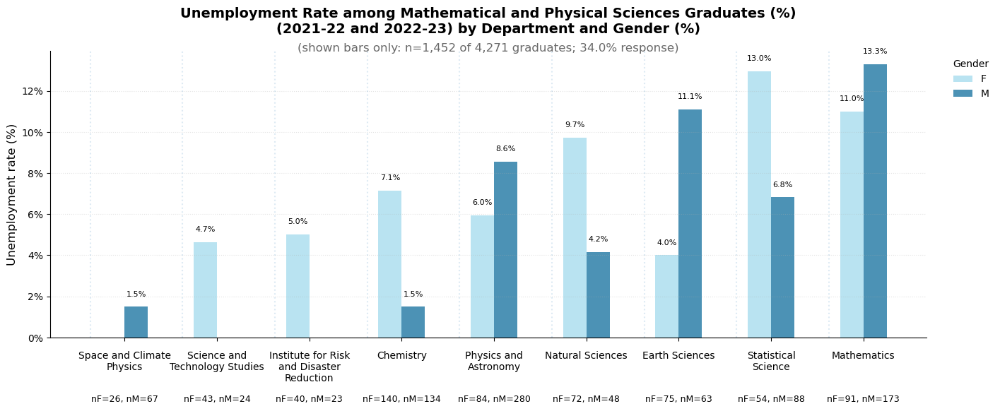

In [69]:
# Gender × Department
res = build_unemp_base_and_mask(graduates_all_merged,
    x_col="department", # change as needed
    hue_col="gender", # change as needed
    min_n=MIN_N, filters={"faculty": "Mathematical and Physical Sciences"}, # change as needed
    hue_order=["F", "M"])

print(res["note_text"])  # prints the “Note: …” sentence

plot_intersection_template_style(res["rate_plot"], res["n_resp_plot"],title_lines=[
        "Unemployment Rate among Mathematical and Physical Sciences Graduates (%)",
        "(2021-22 and 2022-23) by Department and Gender (%)"],
    subtitle_text=res["subtitle_text"], #   note_text=res["note_text"],
    colors=gender_colors, legend_title="Gender",
    bar_width=0.28,           # 2 groups -> wider bars look better
    group_gap=0.55, figsize=(16, 7), rotate_x=0,
    counts_formatter=lambda r: f"nF={int(r.get('F',0))}, nM={int(r.get('M',0))}",
    savepath="unemployment_by_gender_and_department.png")

Despite low subgroup counts and the additional noise introduced to comply with data-privacy requirements, an examination of departments with larger cohorts reveals several **consistent directional patterns** in unemployment rates.

However, all patterns reported below should be interpreted as **indicative rather than conclusive**. The displayed percentages are point estimates only, and for most department–gender subgroups the corresponding **95% uncertainty bands overlap**, meaning that observed differences may reflect sampling variability rather than statistically definitive gaps.

* **Earth Sciences**: Unemployment was more common among male graduates (approximately **11%**) than among female graduates (approximately **4%**).

* **Chemistry**, **Natural Sciences** and **Statistical Sciences**: Unemployment was more common among female graduates (approximately **7%**, **10%** and **13%**, respectively) than among male graduates (approximately **2%**, **4%** and **7%**, respectively).

* **Mathematics**: Unemployment rates were similarly high across genders (approximately **11%-13%**).

#### **Unemployment by ethnicity and department**

Note: Departments shown: 9 / 10 | Departments excluded entirely because no ethnicity group had n ≥ 40: Faculty of Mathematical and Physical Sciences | Ethnicity-specific bars with n < 40 were suppressed (excluded respondents: 456).
Note: Bars show chosen groupings (if n≥40); the black marker shows the overall rate by all graduates in the x-axis category.


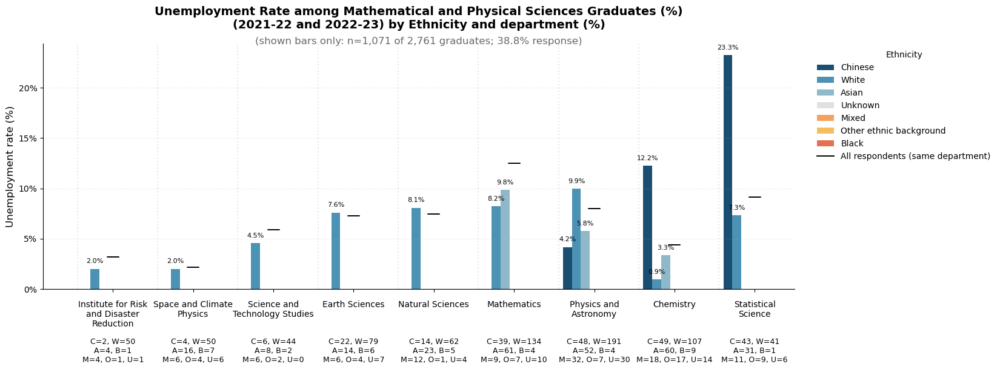

In [70]:
# Department × Ethnicity  + marker for all graduages in the department
res = build_unemp_base_and_mask(graduates_all_merged, x_col="department", hue_col="ethnicity", 
    min_n=MIN_N, filters={"faculty": "Mathematical and Physical Sciences"}, # change as needed
    hue_order=["Chinese", "White", "Asian", "Unknown", "Mixed", "Other ethnic background", "Black"])

print(res["note_text"])  

overall_rate = (res["base"].groupby("department", as_index=True).agg(n_unemp=("n_unemp", "sum"), n_resp=("n_resp", "sum"))
    .assign(rate_pct=lambda t: np.where(t["n_resp"] > 0, t["n_unemp"] / t["n_resp"] * 100, np.nan))["rate_pct"])

plot_intersection_template_style(res["rate_plot"], res["n_resp_plot"], title_lines=[
        "Unemployment Rate among Mathematical and Physical Sciences Graduates (%)",
        "(2021-22 and 2022-23) by Ethnicity and department (%)"],
    subtitle_text=res["subtitle_text"], #   note_text=res["note_text"],
    colors=ethnicity_colors,
    legend_title="Ethnicity",
    bar_width=0.28,           # 2 groups -> wider bars look better
    group_gap=0.55, figsize=(16, 7),  rotate_x=0,
    counts_formatter=lambda c: (
        f"C={int(c['Chinese'])}, W={int(c['White'])}\n"
        f"A={int(c['Asian'])}, B={int(c['Black'])}\n"
        f"M={int(c['Mixed'])}, O={int(c['Other ethnic background'])}, U={int(c['Unknown'])}"),
    overall_marker=True, overall_rate=overall_rate,
    overall_label="All respondents (same department)",
    savepath="unemployment_by_ethnicity_and_department.png")

**Note:** White and Chinese graduates constitute the largest ethnic groups within the Mathematical & Physical Sciences cohort. As a result, when unemployment is disaggregated simultaneously by department and ethnicity, many other ethnic groups fall below the minimum subgroup-size threshold (n < 40) and are therefore suppressed.
Among the ethnicity–department combinations that meet the disclosure threshold, Statistical Science graduates of Chinese ethnicity exhibit the highest observed unemployment rate (23%).

#### **Unemployment by ethnicity and gender**

Note: Ethnicitys shown: 5 / 7 | Ethnicitys excluded entirely because no gender group had n ≥ 40: Black, Other ethnic background | Gender-specific bars with n < 40 were suppressed (excluded respondents: 59).
Note: Bars show chosen groupings (if n≥40); the black marker shows the overall rate by all graduates in the x-axis category.


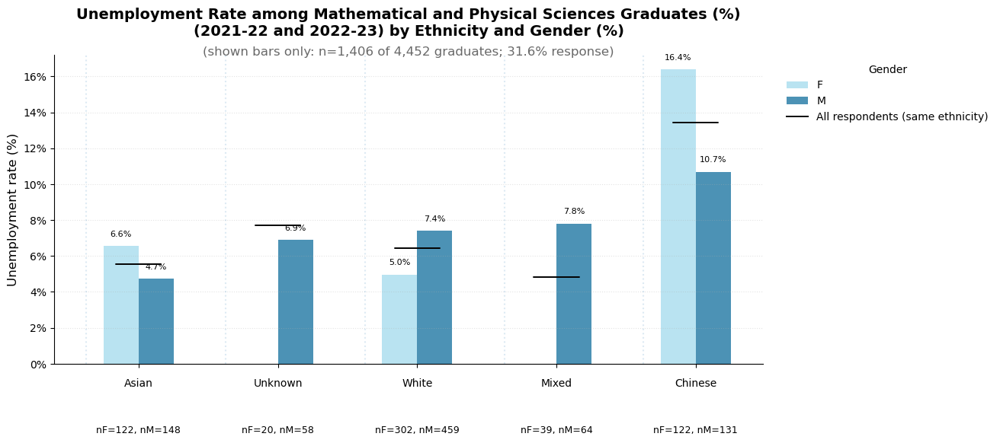

In [71]:
# Ethnicity × Gender + all genders marker
res = build_unemp_base_and_mask(graduates_all_merged, x_col="ethnicity", hue_col="gender", 
    min_n=MIN_N, filters={"faculty": "Mathematical and Physical Sciences"}, hue_order=["F", "M"])

print(res["note_text"]) 

overall_rate = (res["base"].groupby("ethnicity", as_index=True).agg(n_unemp=("n_unemp", "sum"), n_resp=("n_resp", "sum"))
    .assign(rate_pct=lambda t: np.where(t["n_resp"] > 0, t["n_unemp"] / t["n_resp"] * 100, np.nan))["rate_pct"])

plot_intersection_template_style(res["rate_plot"], res["n_resp_plot"], title_lines=[
        "Unemployment Rate among Mathematical and Physical Sciences Graduates (%)",
        "(2021-22 and 2022-23) by Ethnicity and Gender (%)"],
    subtitle_text=res["subtitle_text"], #    note_text=res["note_text"],
    colors=gender_colors, legend_title="Gender", bar_width=0.28, # 2 groups -> wider bars look better
    group_gap=0.55, figsize=(12, 7), rotate_x=0,
    counts_formatter=lambda r: f"nF={int(r.get('F',0))}, nM={int(r.get('M',0))}",
    overall_marker=True, overall_rate=overall_rate, overall_label="All respondents (same ethnicity)",
    savepath="unemployment_by_ethnicity_and_gender.png")

#### **Unemployment by department and year**

In [72]:
# build aemployment by department and year ranking plot
def build_unemp_rank_change_df(
    data,
    *,
    faculty,
    year_a="2021-22",
    year_b="2022-23",
    min_n=40):
    
    # Year A
    a = unemployment_summary_by_group_table(data=data, groupby_dim="department", faculty=faculty, year=year_a, min_n=min_n).copy()
    # Year B
    b = unemployment_summary_by_group_table(data=data, groupby_dim="department", faculty=faculty, year=year_b, min_n=min_n).copy()

    # Extract numeric rates
    def pct_to_float(x):
        return float(str(x).replace("%", ""))

    a = a.rename(columns={"Department": "department"})
    b = b.rename(columns={"Department": "department"})

    a["rate_a"] = a["Unemployment rate (%)"].map(pct_to_float)
    b["rate_b"] = b["Unemployment rate (%)"].map(pct_to_float)

    df = (a[["department", "rate_a"]].merge(b[["department", "rate_b"]], on="department", how="inner"))

    # TRUE ranks (1 = highest unemployment)
    df["rank_a"] = df["rate_a"].rank(ascending=False, method="min")
    df["rank_b"] = df["rate_b"].rank(ascending=False, method="min")
    df["delta_pp"] = df["rate_b"] - df["rate_a"]
    # Sort by RIGHT-SIDE ranking (visual anchor)
    df = df.sort_values("rank_b").reset_index(drop=True)

    # --------------------------------------------------
    # Subtitle: response rate for SHOWN departments only
    # --------------------------------------------------
    shown_departments = df["department"].unique().tolist()

    respondents_plotted = int(data.loc[(data["faculty"].eq(faculty)) & (data["department"].isin(shown_departments)) &
            (data["year"].isin([year_a, year_b])) & (~data["graduate_outcomes_activity"].isna()), "id"].shape[0])

    total_graduates_plotted = int(data.loc[(data["faculty"].eq(faculty)) & (data["department"].isin(shown_departments)) &
            (data["year"].isin([year_a, year_b])), "id"].shape[0])

    response_rate = (respondents_plotted / total_graduates_plotted * 100
        if total_graduates_plotted else 0)

    subtitle_text = (f"(n={respondents_plotted:,} of {total_graduates_plotted:,} graduates; "
        f"{response_rate:.1f}% response rate)")

    ## departments included in faculty (denominator for "shown: X / Y")
    faculty_depts = (data.loc[data["faculty"].eq(faculty), "department"].dropna().unique().tolist())
    total_depts = len(faculty_depts)

    # shown departments = those that survived min_n in BOTH years (since we inner-merged)
    shown_depts = df["department"].tolist()
    shown_n = len(shown_depts)

    excluded_depts = [d for d in faculty_depts if d not in shown_depts]

    # excluded respondents (known outcomes) in excluded departments, across BOTH years
    excluded_respondents = int(data.loc[(data["faculty"].eq(faculty)) & (data["department"].isin(excluded_depts)) &
            (data["year"].isin([year_a, year_b])) & (~data["graduate_outcomes_activity"].isna()),"id"].shape[0])

    note_text = (f"Note: Departments shown: {shown_n} / {total_depts} | "
        f"Departments excluded entirely because one or both years had n < {min_n}: "
        f"{', '.join(excluded_depts) if excluded_depts else 'None'}. | "
        f"Excluded respondents (known outcomes) in excluded departments: {excluded_respondents:,}.")

    return {"rank_df": df, "note_text": note_text, "subtitle_text": subtitle_text}

In [73]:
def plot_department_rank_slopegraph(
    df,
    *,
    departments_palette,
    year_a="2021-22",
    year_b="2022-23",
    title="Year-over-year unemployment rate by department",
    subtitle=None,
    total_graduates_plotted=None,
    figsize=(8.5, 9)):

    fig, ax = plt.subplots(figsize=figsize)
    df = df.copy()

    # circle sizes (already in points^2)
    df["s_a"] = df["rate_a"].apply(scale_circle_size)
    df["s_b"] = df["rate_b"].apply(scale_circle_size)

    # choose a fixed vertical step (in y-data units)
    STEP = 2.8 # bigger step => more separation

    # left side order: by rank_a (top = rank 1)
    left_order = df.sort_values("rank_a")["department"].tolist()
    right_order = df.sort_values("rank_b")["department"].tolist()
    pos_left  = {dept: i * STEP for i, dept in enumerate(left_order)}
    pos_right = {dept: i * STEP for i, dept in enumerate(right_order)}    
    df["_y0"] = df["department"].map(pos_left)
    df["_y1"] = df["department"].map(pos_right)
   
    # subtitle must be passed explicitly (rank_df has no counts)
    if subtitle is None:
        subtitle = ""
    x0, x1 = 0, 1

    df_plot = df.reset_index(drop=True)
    for i, r in df_plot.iterrows():
        dept = r["department"]
        color = departments_palette.get(dept, "#999999")

        y0 = r["_y0"]
        y1 = r["_y1"]

        # connecting line (SAME COLOR)
        ax.plot([0, 1], [y0, y1], color=color, linewidth=2.0, alpha=0.7, zorder=1)

        # dots (size scaled by unemployment rate)
        s_a = r["s_a"]
        s_b = r["s_b"]

        # helper: convert scatter "s" (area in pt^2) to a Circle radius in points
        def s_to_radius_pts(s):
            return np.sqrt(s / np.pi)
            
        # 2021-22 (solid baseline)
        ax.scatter(0, y0, s=s_a, color=color, edgecolors="white", linewidths=0.4, zorder=3)
        
        # 2022-23: draw "increase ring" effect if s_b > s_a
        if s_b > s_a:
            # outer (2022-23) translucent
            ax.scatter(1, y1, s=s_b, color=rgba(color, 0.45), edgecolors="none", zorder=2.6)
            # inner (2021-22 baseline) solid on top
            ax.scatter(1,y1, s=s_a, color=color, edgecolors="none", linewidths=0.4, zorder=3.2)
        elif s_b < s_a:
            # outline of OLD size (exact match to scatter sizing)
            ax.scatter(1, y1, s=s_a, facecolors="none", edgecolors="#8A8A8A", linewidths=0.4, zorder=2.6)
            # new smaller solid circle
            ax.scatter(1, y1, s=s_b, color=color, edgecolors="white", linewidths=0.4, zorder=3.2)
        else:
        # no increase (or decrease) -> normal solid 2022-23 circle
            ax.scatter(1, y1, s=s_b, color=color, edgecolors="white", linewidths=0.4, zorder=3.2)

        # labels INSIDE the circles
        ax.text(0, y0, f"{r['rate_a']:.1f}%", ha="center", va="center", fontsize=10, fontweight="bold", color="white", zorder=20)
        ax.text(1, y1, f"{r['rate_b']:.1f}%", ha="center", va="center", fontsize=10, fontweight="bold", color="white", zorder=20)
         
        # left labels
        ax.text(x0 - 0.08, y0, f"{dept}", ha="right", va="center", fontsize=10)
        # delta annotation (centered)
        mid_y = (y0 + y1)/2
        delta = r["delta_pp"]
        if pd.isna(delta) or delta == 0:
            base = 0.0
        elif delta > 0:
            base = -0.45   # ABOVE the line (remember: y increases downward visually)
        else:
            base = +0.45   # BELOW the line
        # tiny alternating jitter so two positives near each other don't overlap
        jitter = ((i % 2) * 2 - 1) * 0.12
        mid_y = mid_y + base + jitter
    
        if pd.isna(delta):
            delta_txt= "n/a"
            delta_color = "#4F4F4F"
        else:
            arrow = "▲" if delta > 1 else ("▼" if delta < -1 else "•")
            delta_txt = f"{arrow}{delta:+.1f} pp"
            delta_color = "#4A4A4A"
        ax.text(0.5, mid_y, delta_txt,
            ha="center", va="center", fontsize=9, fontweight="bold", color=delta_color,
                bbox=dict(boxstyle="round,pad=0.22", facecolor="white", edgecolor="none", alpha=0.7), zorder=10)

    # axes
    ax.set_xlim(-0.45, 1.35)
    ax.set_xticks([0, 1])
    ax.set_xticklabels([year_a, year_b], fontsize=11)
    ax.set_yticks([])
    y_min = min(df["_y0"].min(), df["_y1"].min())
    y_max = max(df["_y0"].max(), df["_y1"].max())
    PAD = 2.0
    ax.set_ylim(y_max + PAD, y_min - PAD)
    # styling
    for spine in ["top", "right", "left"]:
        ax.spines[spine].set_visible(False)
    ax.set_title(title, fontsize=15, fontweight="bold", pad=18)
    fig.text(0.5, 0.765, subtitle, ha="center", va="top", fontsize=11, color="dimgray")
    fig.text(0.5, -0.05, "Circle size reflects unemployment rate; outer ring indicates increase vs prior year.\n ▲ / ▼ shown only for changes greater than ±1 percentage point.\n Colour indicates unemployment risk (orange = higher / increasing; dark blue = lower / improving; grey = minimal change)",
    ha="center", va="bottom", fontsize=11, color="dimgray")
    fig.subplots_adjust(top=0.88)  # leaves room for title/subtitle
    plt.tight_layout(rect=[0, 0, 1, 0.82])
    # save figure 
    fig.savefig("unemployment_rate_by_department.png", dpi=300, bbox_inches="tight")
    plt.show()

Note: Departments shown: 7 / 10 | Departments excluded entirely because one or both years had n < 40: Institute for Risk and Disaster Reduction, Science and Technology Studies, Faculty of Mathematical and Physical Sciences. | Excluded respondents (known outcomes) in excluded departments: 162.


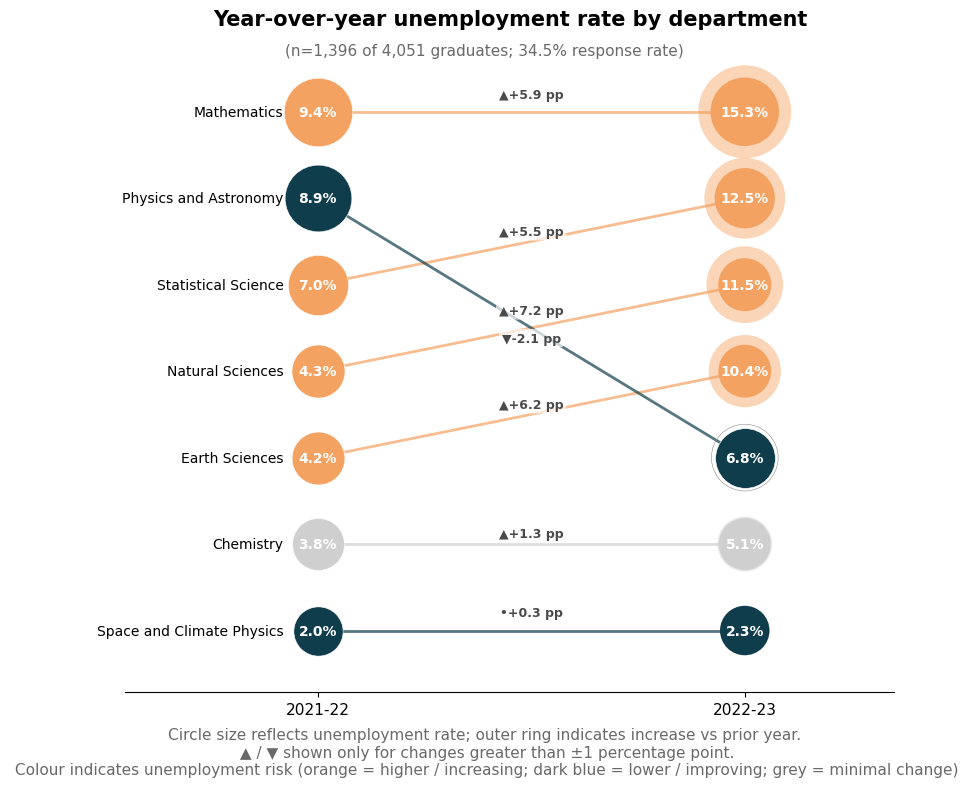

In [74]:
faculty_name = "Mathematical and Physical Sciences"

res_rank = build_unemp_rank_change_df(data=graduates_all_merged, faculty=faculty_name,
    year_a="2021-22", year_b="2022-23", min_n=MIN_N)
print(res_rank["note_text"])
rank_df = res_rank["rank_df"]

department_palette_stakeholder = build_stakeholder_department_palette(rank_df) 

plot_department_rank_slopegraph(rank_df, departments_palette =department_palette_stakeholder,
    year_a="2021-22", year_b="2022-23", subtitle=res_rank["subtitle_text"])

**Key Takeaways**: 
* The **unemployment rate among 2022–23 Mathematics graduates was the highest**, reaching approximately **15%**, up from around 9% in the previous year.
* The **largest year-over-year increase** was observed among **Natural Sciences graduates**, where unemployment rose by over 7 percentage points. This upward trend in unemployment rates was evident across departments, with **two clear exceptions**:

(1) unemployment among **Physics and Astronomy** graduates followed the opposite trend, decreasing from approximately **9% to 7%**, potentially signalling increased demand for graduates in this field; and
(2) the **unemployment rate among Space and Climate Physics graduates remained the lowest**, with a relatively stable figure of around **2%**.

### Representation, diversity and inclusion: snapshot
this part meant to provide a high level view on the share of women, as a group, and of women and men from ethnic minorities - among all graduates in the sample data and regaredless of response status - i.e., it relies solely on the manipulated and anonymised administrative data and not on GOS data.

#### **Gender distribution by year**

Shown n=4,808 (excluded n=4; excluded category: Other/Non-binary)


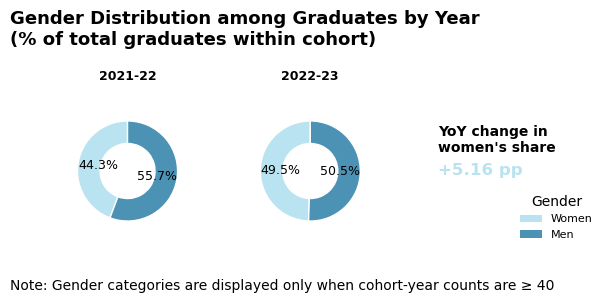

In [75]:
# plotting gender distribution: Gender donut pies + YoY change
# Helper: apply MIN_N per cohort-year (drop low-count genders)
def gender_counts_with_min_n(df, year_col, year_value, gender_col="gender", min_n=40,
                            keep_genders=("F", "M", "O")):
    """
    Returns:
      counts_shown: pd.Series for genders kept (>=min_n)
      excluded: dict with excluded genders + counts
      total_in_year: int (all grads in that year, after any upstream filters)
    """
    df_y = df.loc[df[year_col] == year_value].copy()
    
    # counts for allowed genders only (stable universe)
    counts = (df_y.loc[df_y[gender_col].isin(list(keep_genders)), gender_col].value_counts()
                .reindex(list(keep_genders), fill_value=0))
    shown = counts[counts >= min_n]
    excluded = counts[counts < min_n]

    excluded_info = {"excluded_genders": excluded.index.tolist(),"excluded_counts": excluded.to_dict(),
        "excluded_total": int(excluded.sum())}

    return shown, excluded_info, int(len(df_y))

# Build the two pies from raw data
df_all = graduates_all_merged.copy()

# Define the two cohorts 
year_a = "2021-22"
year_b = "2022-23"

shown_a, excl_a, total_a = gender_counts_with_min_n(df_all, "year", year_a, min_n=MIN_N)
shown_b, excl_b, total_b = gender_counts_with_min_n(df_all, "year", year_b, min_n=MIN_N)

# Convert to % within year, based on SHOWN categories only
pct_a = (shown_a / shown_a.sum() * 100) if shown_a.sum() else shown_a
pct_b = (shown_b / shown_b.sum() * 100) if shown_b.sum() else shown_b

# Ensure stable order + labels (only include what survived MIN_N)
label_map = {"F": "Women", "M": "Men", "O": "Other/Non-binary"}
plot_order = ["F", "M", "O"]
plot_order_a = [g for g in plot_order if g in pct_a.index]
plot_order_b = [g for g in plot_order if g in pct_b.index]

labels_a = [label_map[g] for g in plot_order_a]
sizes_a  = [float(pct_a.loc[g]) for g in plot_order_a]
colors_a = [gender_colors.get(g, "#CCCCCC") for g in plot_order_a]

labels_b = [label_map[g] for g in plot_order_b]
sizes_b  = [float(pct_b.loc[g]) for g in plot_order_b]
colors_b = [gender_colors.get(g, "#CCCCCC") for g in plot_order_b]

# Women YoY change (guard if Women excluded in either year)
women_a = float(pct_a.loc["F"]) if "F" in pct_a.index else np.nan
women_b = float(pct_b.loc["F"]) if "F" in pct_b.index else np.nan
women_delta = (women_b - women_a) if (pd.notna(women_a) and pd.notna(women_b)) else np.nan
sign = "+" if (pd.notna(women_delta) and women_delta > 0) else ""
delta_str = f"{sign}{women_delta:.2f} pp" if pd.notna(women_delta) else "n/a"

def autopct_fmt(pct):
    return f"{pct:.1f}%"

# plot
fig = plt.figure(figsize=(5, 2))
gs = fig.add_gridspec(nrows=1, ncols=3, width_ratios=[0.5, 0.5, 0.1], wspace=0.9)
ax1 = fig.add_subplot(gs[0,0])  # pie for 2021-22
ax2 = fig.add_subplot(gs[0,1])  # pie for 2022-23
ax3 = fig.add_subplot(gs[0,2])  # delta text for women only

# --- AX1 pie: year_a ---
ax1.pie(sizes_a, autopct=autopct_fmt, startangle=90, colors=colors_a,
    textprops={'fontsize':9}, wedgeprops={'width': 0.45, 'edgecolor': 'white'})
ax1.set_title(year_a, fontsize=9, fontweight='bold', pad=10)
ax1.axis('equal')  # keep it circular

# --- AX2 pie: year_b ---
ax2.pie(sizes_b, autopct=autopct_fmt, startangle=90, colors=colors_b,
    textprops={'fontsize':9}, wedgeprops={'width': 0.45, 'edgecolor': 'white'})

ax2.set_title(year_b, fontsize=9, fontweight='bold', pad=10)
ax2.axis('equal')

# --- AX3: Women change only - YoY text 
ax3.axis('off')  # we'll just write text

# add YoY change text
ax3.text(0.0, 0.8, "YoY change in\nwomen's share", fontsize=10, fontweight='bold', ha='left', va='top')

ax3.text(0.0, 0.55, f"{delta_str}", fontsize=12, fontweight='bold', color=gender_colors.get('F', 'black'), ha='left', va='top')

# --- overall figure title ---
fig.suptitle("Gender Distribution among Graduates by Year\n(% of total graduates within cohort)",
    fontsize=13, fontweight='bold', x=0.0, ha='left', y=1.3)

# Documentation (print + footnote)
def fmt_excl(excl):
    if not excl["excluded_genders"]:
        return "None"
    return ", ".join([label_map.get(g, g) for g in excl["excluded_genders"]])

total_shown = int(shown_a.sum()) + int(shown_b.sum())
total_excluded = excl_a['excluded_total'] + excl_b['excluded_total']

# categories should be the same in both years; keep it explicit
excluded_category = fmt_excl(excl_a)

doc_line = (f"Shown n={total_shown:,} "f"(excluded n={total_excluded:,}; "
    f"excluded category: {excluded_category})")
print(doc_line)

legend_elements = [Patch(facecolor=gender_colors['F'], edgecolor='none', label='Women'),
    Patch(facecolor=gender_colors['M'], edgecolor='none', label='Men')]

fig.legend(handles=legend_elements, loc='lower left', bbox_to_anchor=(1.0, 0.1), frameon=False,
    fontsize=8, title="Gender")
fig.text(0.0, -0.1, f"Note: Gender categories are displayed only when cohort-year counts are ≥ {MIN_N}")
fig.savefig("gender_distribution_donuts.png", dpi=300, bbox_inches="tight")
plt.show()

In [76]:
# additional faculty-level function (all grads)
def build_share_base_and_mask(
    data: pd.DataFrame,
    x_col: str,
    hue_col: str,
    *,
    id_col: str = "id",
    min_n: int = 40,
    filters: dict | None = None,
    x_order: list | None = None,
    hue_order: list | None = None,
    value_map: dict | None = None,     # e.g. {"F":"Women","M":"Men","O":"Other/Non-binary"}
):
    """
    Governance for composition (100% stacked) charts:
    - counts by x_col × hue_col
    - suppress cells where n < min_n
    - keep x if ANY hue visible (Option B)
    - Option A normalisation: % computed using ONLY the remaining (visible) categories per x
      so each displayed bar sums to 100%
    - returns pct_plot (0–100), n_plot (counts after suppression), and doc strings
    """
    df = data.copy()

    # filters
    if filters:
        for col, val in filters.items():
            if isinstance(val, (list, tuple, set)):
                df = df[df[col].isin(val)].copy()
            else:
                df = df[df[col] == val].copy()

    # optional value mapping (e.g., F/M/O -> Women/Men/Other)
    if value_map is not None:
        df[hue_col] = df[hue_col].map(value_map).fillna(df[hue_col])

    # base counts
    grp = df.groupby([x_col, hue_col], dropna=False)
    base = grp[id_col].size().rename("n_total").reset_index()

    # wide counts
    n_wide = base.pivot(index=x_col, columns=hue_col, values="n_total").fillna(0).astype(int)

    # enforce orders if provided
    if hue_order is not None:
        n_wide = n_wide.reindex(columns=hue_order)
    if x_order is not None:
        n_wide = n_wide.reindex(index=x_order)

    # suppress cells where n < MIN_N; keep x if ANY visible
    visible_mask = n_wide.ge(min_n)
    x_keep = visible_mask.any(axis=1)

    n_plot = n_wide.loc[x_keep].copy()
    visible_mask_plot = visible_mask.loc[x_keep].copy()

    # excluded respondents = suppressed counts inside shown x groups
    suppressed_mask_plot = visible_mask_plot.eq(False)
    excluded_people = int(n_plot.where(suppressed_mask_plot, other=0).sum().sum())

    # apply suppression for plotting (set suppressed cells to 0 so they disappear)
    n_plot_supp = n_plot.where(visible_mask_plot, other=0)

    # totals per x (after suppression) for "n=..." labels
    totals_by_x = n_plot_supp.sum(axis=1).astype(int)

    # ---- Documentation like your fee_status × ethnicity example ----
    shown_total = int(n_plot_supp.sum().sum())
    excluded_total = int(n_wide.sum().sum() - shown_total)

    # excluded categories per x (only where exclusions exist)
    suppressed_cells = n_wide.where(~visible_mask, other=0)  # counts suppressed anywhere
    excluded_by_x = {}
    for xg in n_wide.index.tolist():
        xs = suppressed_cells.loc[xg]
        dropped = xs[xs > 0].index.tolist()
        if dropped:
            excluded_by_x[str(xg)] = dropped
    def _fmt_list(xs, max_list=8):
        if not xs:
            return ""
        if len(xs) <= max_list:
            return ", ".join(xs)
        return ", ".join(xs[:max_list]) + f", … (+{len(xs) - max_list} more)"
    
    parts = []
    for xg in n_wide.index.tolist():
        dropped = excluded_by_x.get(str(xg), [])
        if dropped:
            parts.append(f"{xg}: {_fmt_list(dropped)}")
    
    doc_line = (f"Shown n={shown_total:,} (excluded n={excluded_total:,}; "
        f"excluded cells where {x_col} × {hue_col} n<{min_n}: "
        f"{' | '.join(parts) if parts else 'None'})")

    # Option A: normalise to 100% using ONLY remaining visible categories
    row_totals_visible = n_plot_supp.sum(axis=1)
    # drop any all-zero rows (rare)
    n_plot_supp = n_plot_supp.loc[row_totals_visible > 0].copy()
    row_totals_visible = row_totals_visible[row_totals_visible > 0]
    pct_plot = n_plot_supp.div(row_totals_visible, axis=0) * 100
    # optional ordering: by the second column if present, otherwise by max share
    if pct_plot.shape[1] >= 2:
        sort_col = pct_plot.columns[1]
        pct_plot = pct_plot.sort_values(by=sort_col, ascending=True)
        n_plot_supp = n_plot_supp.loc[pct_plot.index]
        visible_mask_plot = visible_mask_plot.loc[pct_plot.index]
    else:
        order = pct_plot.max(axis=1).sort_values(ascending=True).index
        pct_plot = pct_plot.loc[order]
        n_plot_supp = n_plot_supp.loc[order]
        visible_mask_plot = visible_mask_plot.loc[order]

    x_shown = pct_plot.index.tolist()
    excluded_x = x_keep.eq(False)
    excluded_x = excluded_x[excluded_x].index.tolist()

    # categories fully suppressed (never shown anywhere)
    suppressed_any = visible_mask.any(axis=0).eq(False)
    suppressed_cats = suppressed_any[suppressed_any].index.tolist()
    suppressed_cats_text = ", ".join(map(str, suppressed_cats)) if suppressed_cats else "None"

    # subtitle: displayed grads vs total grads (within filters)
    displayed_grads = int(n_plot_supp.sum().sum())
    total_grads_in_scope = int(df[id_col].shape[0])
    pct_in_scope = (displayed_grads / total_grads_in_scope * 100) if total_grads_in_scope else 0.0
    subtitle_text = f"(n={displayed_grads:,} of {total_grads_in_scope:,} graduates; {pct_in_scope:.1f}% shown after thresholding)"

    note_text = (f"Note: {x_col.capitalize()}s shown: {len(x_shown)} / {n_wide.shape[0]} | "
        f"{x_col.capitalize()}s excluded entirely because no {hue_col} group had n ≥ {min_n}: "
        f"{', '.join(excluded_x) if excluded_x else 'None'}. | "
        f"Cells with n < {min_n} were suppressed (excluded grads: {excluded_people:,}). | "
        f"Category excluded (below threshold): {suppressed_cats_text}.")

    return {
        "pct_plot": pct_plot,              # 0–100, sums to 100 per x
        "n_plot": n_plot_supp,             # counts after suppression (visible only)
        "visible_mask_plot": visible_mask_plot,
        "x_shown": x_shown,
        "excluded_x": excluded_x,
        "excluded_people": excluded_people,
        "subtitle_text": subtitle_text,
        "note_text": note_text,
        "counts_plot": n_plot_supp,     # absolute counts after suppression (for vertical stacks)
        "totals_by_x": totals_by_x,     # totals per x (after suppression)
        "doc_line": doc_line,          # your single-line documentation print
    }

#### **Gender distribution by department**

Note: Departments shown: 10 / 10 | Departments excluded entirely because no gender group had n ≥ 40: None. | Cells with n < 40 were suppressed (excluded grads: 4). | Category excluded (below threshold): Other/Non-binary.


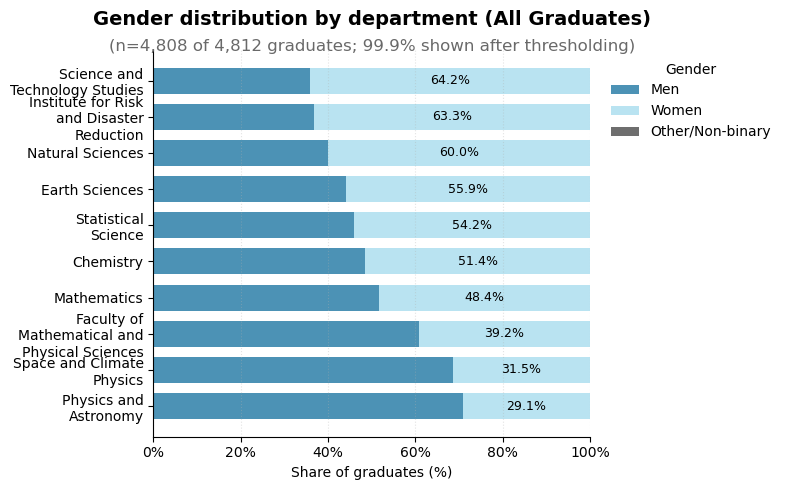

In [77]:
# Share of women across departments - stacked bars, Descending order
res = build_share_base_and_mask(data=graduates_all_merged, x_col="department", hue_col="gender", min_n=MIN_N,
    filters={"faculty": "Mathematical and Physical Sciences"},
    value_map={"F": "Women", "M": "Men", "O": "Other/Non-binary"},
    hue_order=["Men", "Women", "Other/Non-binary"])

print(res["note_text"])

plot_intersection_template_style(
    rate_plot=res["pct_plot"],      # percentages (0–100)
    n_resp_plot=res["n_plot"],      # counts (used only for stacking logic)
    plot_kind="stacked_share", title_lines=["Gender distribution by department (All Graduates)"],
    subtitle_text=res["subtitle_text"], colors=gender_colors_mwo, legend_title="Gender",
    figsize=(8, 5), savepath="gender_distribution_by_department.png")

#### **Ethnic composition by fee status**

Shown n=4,670 (excluded n=142; excluded cells where fee_status × ethnicity n<40: EU: Asian, Black, Chinese, Mixed, Other ethnic background, Unknown | Overseas: Black, Mixed)


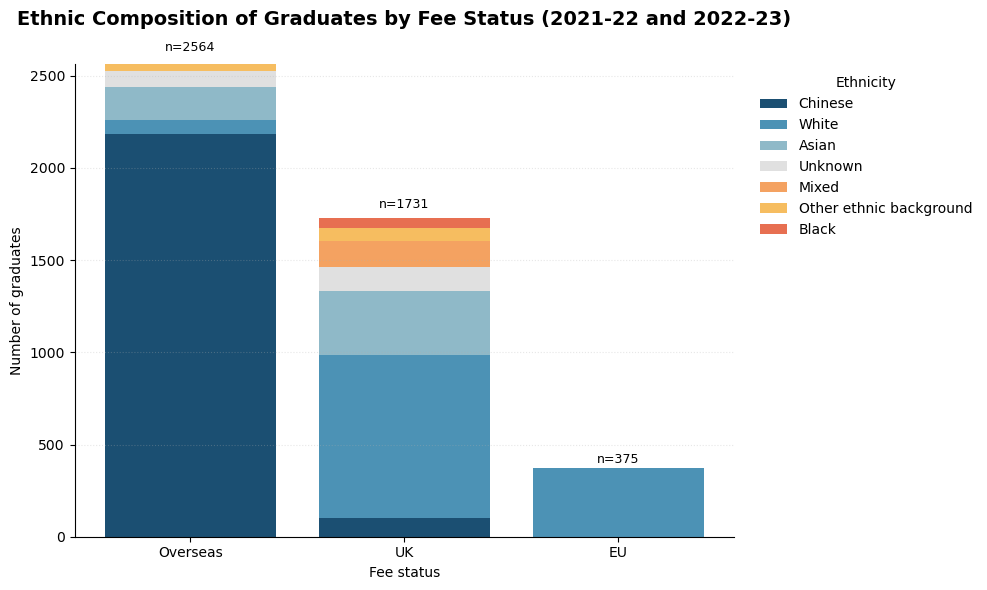

In [78]:
# Use the full dataset (all years together)
df_all = graduates_all_merged.copy()

# Count graduates by fee_status x ethnicity
eth_by_fee_counts = (df_all.groupby(['fee_status', 'ethnicity']).size().reset_index(name='count'))

# Apply MIN_N at the CELL level (fee_status × ethnicity)
eth_by_fee_counts_all = eth_by_fee_counts.copy()
eth_by_fee_counts_filt = eth_by_fee_counts_all[eth_by_fee_counts_all['count'] >= MIN_N].copy()

# Documentation (totals + excluded categories) ---
shown_total = int(eth_by_fee_counts_filt['count'].sum())
excluded_total = int(eth_by_fee_counts_all['count'].sum() - shown_total)
excluded_cells = eth_by_fee_counts_all[eth_by_fee_counts_all['count'] < MIN_N].copy()
# Pivot so rows = fee_status (Overseas, UK, EU),
eth_by_fee_pivot = (eth_by_fee_counts_filt.pivot(index='fee_status', columns='ethnicity', values='count').fillna(0))

# map: fee_status -> list of excluded ethnicities (ONLY where exclusions exist)
excluded_by_fee = (excluded_cells.groupby('fee_status')['ethnicity'].apply(lambda s: sorted(s.unique().tolist())).to_dict())

def fmt_list(xs, max_list=8):
    if not xs:
        return ""
    return ", ".join(xs[:max_list]) + (f", … (+{len(xs)-max_list} more)" if len(xs) > max_list else "")

parts = []
for fee in eth_by_fee_pivot.index.tolist() if '__total__' in eth_by_fee_pivot.columns else sorted(df_all['fee_status'].dropna().unique()):
    xs = excluded_by_fee.get(fee, [])
    if xs:  # only document where relevant (no zero-noise)
        parts.append(f"{fee}: {fmt_list(xs)}")

doc_line = (f"Shown n={shown_total:,} (excluded n={excluded_total:,}; "
    f"excluded cells where fee_status × ethnicity n<{MIN_N}: "
    f"{' | '.join(parts) if parts else 'None'})")
print(doc_line)

# Compute total graduates per fee_status and sort so the largest bar comes first
eth_by_fee_pivot['__total__'] = eth_by_fee_pivot.sum(axis=1)
eth_by_fee_pivot = eth_by_fee_pivot.sort_values(by='__total__', ascending=False)

# Split out the stacked data (all ethnicities) and the totals
stack_data = eth_by_fee_pivot.drop(columns='__total__')
totals = eth_by_fee_pivot['__total__']

# Define ethnicity plotting order - by overall size across the whole dataset + drop al 0 columns
ethnicity_order = stack_data.sum(axis=0).sort_values(ascending=False).index.tolist()
stack_data = stack_data[ethnicity_order]
stack_data = stack_data.loc[:, (stack_data.sum(axis=0) > 0)]  # safety: remove empty cols
ethnicity_order = stack_data.columns.tolist()

# Plot the stacked bars (absolute counts, not %)
fig, ax = plt.subplots(figsize=(10,6))

bottom = np.zeros(len(stack_data))
x = np.arange(len(stack_data.index))

for eth in ethnicity_order:
    vals = stack_data[eth].values
    ax.bar(x, vals, bottom=bottom, label=eth, color=ethnicity_colors.get(eth, '#999999'), edgecolor="none")
    bottom += vals

# Add total n labels on top of each bar
for xpos, total in enumerate(totals.values):
    ax.text(xpos, total + (total * 0.02 if total > 0 else 1), f"n={int(total)}",
        ha='center', va='bottom', fontsize=9, color='black')

# Axes & styling
ax.set_xticks(x)
ax.set_xticklabels(stack_data.index, rotation=0)
ax.set_ylabel("Number of graduates")
ax.set_xlabel("Fee status")
ax.set_title("Ethnic Composition of Graduates by Fee Status (2021-22 and 2022-23)",
            fontsize=14, fontweight='bold', pad=28)
ax.legend(title="Ethnicity", bbox_to_anchor=(1.02, 1), loc='upper left', frameon=False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(axis='y', linestyle=':', alpha=0.3)
plt.tight_layout()
fig.savefig("Ethnic Composition by fee status", dpi=300, bbox_inches="tight")
plt.show()

#### **Ethnic composition by year**

Shown n=4,746 (excluded n=66; excluded category below n<40: Black)


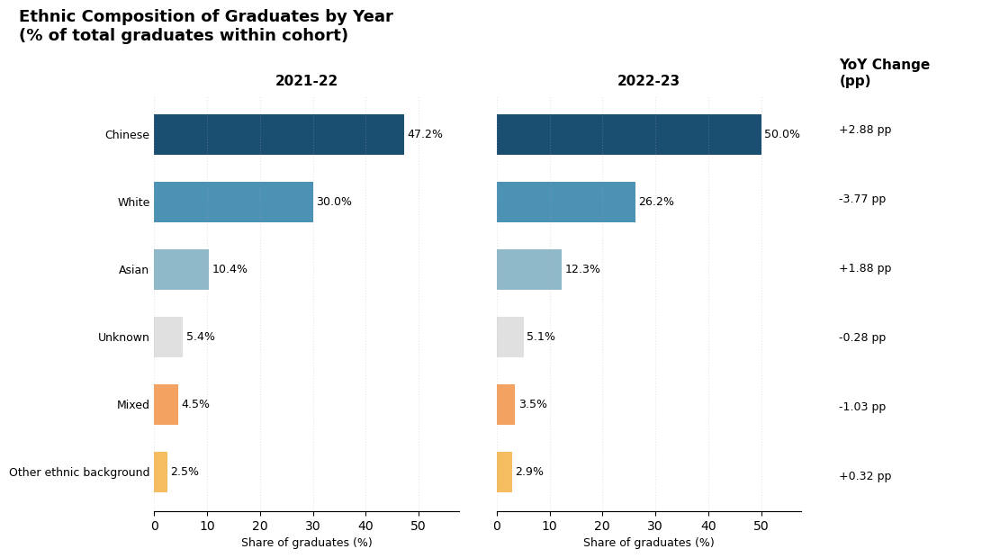

In [79]:
# overall ethnic makeup (by year), sorted by size (designed table) + YoY %
# Counts (year × ethnicity)
counts_by_year_ethnicity = (graduates_all_merged.groupby(['year', 'ethnicity']).size().reset_index(name='count'))

# safety measure: restrict to the desired years 
counts_by_year_ethnicity = counts_by_year_ethnicity[counts_by_year_ethnicity['year']
.isin([year_a, year_b])].copy()

# Apply MIN_N at the CELL level: year × ethnicity
counts_filt = counts_by_year_ethnicity[counts_by_year_ethnicity['count'] >= MIN_N].copy()

# Documentation totals (shown vs excluded)
shown_total = int(counts_filt['count'].sum())
excluded_total = int(counts_by_year_ethnicity['count'].sum() - shown_total)
excluded_cells = counts_by_year_ethnicity[counts_by_year_ethnicity['count'] < MIN_N].copy()

# categories excluded (for transparency)
excluded_categories = sorted(excluded_cells['ethnicity'].unique().tolist())

max_list = 8
excluded_list = ", ".join(excluded_categories[:max_list]) + (
    f", … (+{len(excluded_categories) - max_list} more)" if len(excluded_categories) > max_list else "")

doc_line = (f"Shown n={shown_total:,} (excluded n={excluded_total:,}; "
    f"excluded category below n<{MIN_N}: {excluded_list if excluded_categories else 'None'})")
print(doc_line)

# Pivot to: rows = year, cols = ethnicity
counts_pivot = (counts_filt.pivot(index='year', columns='ethnicity', values='count').fillna(0))

# Get percentages within each year, based on SHOWN categories only
perc_pivot = counts_pivot.div(counts_pivot.sum(axis=1), axis=0) * 100

# ordered by year_b share (descending)
ethnicities_all = sorted(list(set(perc_pivot.columns[(perc_pivot.loc[year_a] > 0)]).union(
         set(perc_pivot.columns[(perc_pivot.loc[year_b] > 0)]))),
    key=lambda e: perc_pivot.loc[year_b, e] if e in perc_pivot.columns else 0, reverse=True)

# Build summary table
summary_df = pd.DataFrame({'Ethnicity': ethnicities_all,
    f'{year_a} %': [perc_pivot.loc[year_a, e] if e in perc_pivot.columns else 0 for e in ethnicities_all],
    f'{year_b} %': [perc_pivot.loc[year_b, e] if e in perc_pivot.columns else 0 for e in ethnicities_all],})

summary_df['Change (pp)'] = summary_df[f'{year_b} %'] - summary_df[f'{year_a} %']

# Round nicely for display
summary_df_display = summary_df.copy()
summary_df_display[f'{year_a} %'] = summary_df_display[f'{year_a} %'].round(2)
summary_df_display[f'{year_b} %'] = summary_df_display[f'{year_b} %'].round(2)
summary_df_display['Change (pp)'] = summary_df_display['Change (pp)'].round(2)

fig = plt.figure(figsize=(12, 6))
gs = fig.add_gridspec(nrows=1, ncols=3, width_ratios=[1.2, 1.2, 0.6], wspace=0.15)
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1])
ax3 = fig.add_subplot(gs[0,2])
y_positions = np.arange(len(ethnicities_all))
vals_a = summary_df[f'{year_a} %'].values
vals_b = summary_df[f'{year_b} %'].values
deltas = summary_df['Change (pp)'].values

# choose a common x-limit so both bar blocks are visually comparable
xmax = max(vals_a.max(), vals_b.max()) * 1.15  # a little padding

# --- AX1: Year A bars ---
for i, eth in enumerate(ethnicities_all):
    ax1.barh(y_positions[i], vals_a[i], color=ethnicity_colors.get(eth, '#CCCCCC'), edgecolor='none', height=0.6)
    ax1.text(vals_a[i] + xmax*0.01, y_positions[i], f"{vals_a[i]:.1f}%", va='center',
        ha='left', fontsize=9, color='black')

# y-axis labels = ethnicity names on ax1
ax1.set_yticks(y_positions)
ax1.set_yticklabels(ethnicities_all, fontsize=9)
ax1.invert_yaxis()  # top = biggest group
ax1.set_xlim(0, xmax)
ax1.set_xlabel("Share of graduates (%)", fontsize=9)
ax1.set_title(year_a, fontsize=11, fontweight='bold', pad=8)
# clean look
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax1.grid(axis='x', linestyle=':', alpha=0.3)
ax1.tick_params(axis='y', length=0)  # hide little tick lines

# --- AX2: Year B bars ---
for i, eth in enumerate(ethnicities_all):
    ax2.barh(y_positions[i], vals_b[i], color=ethnicity_colors.get(eth, '#CCCCCC'), edgecolor='none', height=0.6)
    ax2.text(vals_b[i] + xmax*0.01, y_positions[i], f"{vals_b[i]:.1f}%", va='center', ha='left', fontsize=9, color='black')

# same y positions, but hide y tick labels here (we only want them on ax1)
ax2.set_yticks(y_positions)
ax2.set_yticklabels([''] * len(ethnicities_all))
ax2.invert_yaxis()
ax2.set_xlim(0, xmax)
ax2.set_xlabel("Share of graduates (%)", fontsize=9)
ax2.set_title(year_b, fontsize=11, fontweight='bold', pad=8)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax2.grid(axis='x', linestyle=':', alpha=0.3)
ax2.tick_params(axis='y', length=0)

# --- AX3: Change in pp ---
ax3.set_xlim(0, 1)
ax3.set_ylim(-0.5, len(ethnicities_all)-0.5)

for i, eth in enumerate(ethnicities_all):
    delta_pp = deltas[i]
    sign = "+" if delta_pp > 0 else ""  # "" will give us a minus sign automatically if negative
    ax3.text(0, y_positions[i], f"{sign}{delta_pp:.2f} pp", va='center', ha='left', fontsize=9, color='black')

# y-axis labels invisible here
ax3.set_yticks([])
ax3.set_xticks([])
ax3.invert_yaxis()
ax3.set_title("YoY Change\n(pp)", fontsize=11, fontweight='bold', pad=8, loc='left')
# remove all spines for ax3
for spine in ax3.spines.values():
    spine.set_visible(False)
# overall figure title (optional)
fig.suptitle("Ethnic Composition of Graduates by Year\n(% of total graduates within cohort)",
    fontsize=13, fontweight='bold', x=0.0, ha='left', y=1.04)
fig.savefig("Ethnic Composition by year.png", dpi=300, bbox_inches="tight")
plt.show()

#### **UN/EMPLOYMENT: Complementary visualisations on industry distribution and graduate destinations**
These visualisations complement the unemployment-focused results by providing additional context on industry distribution and graduate destinations, supporting a more holistic assessment of employment risk patterns and potential intervention points.

In [80]:
# un/employmnet - complementary visualizations: sankey: gender -> industries

# under and over represantation of women - define bounds
LOW_CUTOFF  = 0.30
HIGH_CUTOFF = 0.70
# compute a normalised representation score
def representation_score(sw):
    """
    sw = share of women in [0,1] returns value in [0,1] with:
    0.0 = <=30% ; 0.5 = parity (50%); 1.0 = >=70%
    """
    if sw <= LOW_CUTOFF:
        return 0.0
    if sw >= HIGH_CUTOFF:
        return 1.0
    return (sw - LOW_CUTOFF) / (HIGH_CUTOFF - LOW_CUTOFF)

def sankey_gender_to_industry_from_graduates_all_merged(
    graduates_all_merged,
    department=None,
    employed_activities=("Full-time employment", "Part-time employment"),
    respondents_only=True,
    respondents_value="Survey completed or partially completed",
    top_n_per_gender=None,          # <-- set None to avoid "Other"
    top_n_overall=None,
    include_unknown=True,
    unknown_values=("Unknown", "Unknown / Not reported"),
    drop_other=True,               # <-- drop "Other" if it exists
    other_label="Other",
    show_node_counts=True,         # <-- adds (n=) to node labels
    title=None,
    print_note=True,
    subtitle=True,
    height=520,
    font_size=12):
    df = graduates_all_merged.copy()

    if department is not None:
        df = df[df["department"] == department].copy()
    if respondents_only:
        df = df[df["response_status"] == respondents_value].copy()
    # employed only
    df = df[df["graduate_outcomes_activity"].isin(list(employed_activities))].copy()
    # gender + industry
    df = df[df["gender"].isin(["M", "F"])].copy()
    df = df[df["industry_sector_employed"].notna()].copy()
    if not include_unknown:
        df = df[~df["industry_sector_employed"].isin(list(unknown_values))].copy()
    # counts: gender x industry
    agg = (df.groupby(["gender", "industry_sector_employed"], as_index=False).size().rename(columns={"size": "count"}))
    # Optional: collapse tail into "Other" (OFF by default here)
    if top_n_per_gender is not None:
        def collapse_tail(g):
            g = g.sort_values("count", ascending=False).copy()
            top = g.head(top_n_per_gender).copy()
            tail = g.iloc[top_n_per_gender:]
            if len(tail) > 0:
                tail_sum = int(tail["count"].sum())
                top = pd.concat([top, pd.DataFrame({"gender": [g["gender"].iloc[0]], "industry_sector_employed": [other_label],
                    "count": [tail_sum]})], ignore_index=True)
            return top

        agg = agg.groupby("gender", group_keys=False).apply(collapse_tail)
        agg = (agg.groupby(["gender", "industry_sector_employed"], as_index=False).agg(count=("count", "sum")))

    # Drop "Other" if requested (either because it existed, or because you later turn tail-collapsing on)
    if drop_other:
        agg = agg[agg["industry_sector_employed"] != other_label].copy()

    # ---- Build node labels (optionally add node totals) ----
    industry_order = (agg.groupby("industry_sector_employed")["count"].sum().sort_values(ascending=False).index.tolist())

    # --- Keep only top N industries overall (across M+F) ---
    total_industries_before = len(industry_order)  
    excluded_industries = []                       
    if top_n_overall is not None:
        kept_industries = industry_order[:top_n_overall]
        excluded_industries = industry_order[top_n_overall:]
        # Filter agg to top N industries only
        agg = agg[agg["industry_sector_employed"].isin(kept_industries)].copy()
        industry_order = kept_industries
    
    industries=industry_order
    base_labels = ["M", "F"] + industries
        # -----------------------------
    # Documentation note + subtitle
    # -----------------------------
    respondents_shown = int(agg["count"].sum())
    # Denominator (available pre-topN): employed respondents that passed all filters BEFORE top-N trimming
    # Recompute quickly from the same filtered df (but without top-N restriction):
    df_for_denom = df.copy()
    denom_agg = (df_for_denom.groupby(["gender", "industry_sector_employed"], as_index=False)
        .size().rename(columns={"size": "count"}))

    if drop_other:
        denom_agg = denom_agg[denom_agg["industry_sector_employed"] != other_label].copy()
    if not include_unknown:
        denom_agg = denom_agg[~denom_agg["industry_sector_employed"].isin(list(unknown_values))].copy()

    respondents_all = int(denom_agg["count"].sum())
    rr = (respondents_shown / respondents_all * 100) if respondents_all else 0.0
    # excluded respondents = those in excluded industries (pre-topN) that are not shown
    excluded_respondents = max(respondents_all - respondents_shown, 0)
    # Note text (mirrors your “shown / total | excluded | excluded respondents” style)
    if top_n_overall is not None:
        note_text = (f"Note: Industry sectors shown: {len(industry_order)} / {total_industries_before} | "
                     f"Industry sectors excluded because not in top {top_n_overall}: "
                     f"{', '.join(excluded_industries) if excluded_industries else 'None'}. | "
                     f"Excluded employed respondents in excluded sectors: {excluded_respondents:,}.")
    else:
        note_text = (f"Note: Industry sectors shown: {len(industry_order)} / {total_industries_before} | "
                     f"No top-N filter applied. | Excluded employed respondents: 0.")

    subtitle_text = f"(shown flows only: n={respondents_shown:,} of {respondents_all:,} employed respondents; {rr:.1f}% coverage)"

    if print_note:
        print(note_text)
    
    # --- compute share of women per industry ---
    industry_gender_counts = (agg.pivot_table(
        index="industry_sector_employed", columns="gender", values="count", fill_value=0))
    industry_gender_counts["share_women"] = (
        industry_gender_counts.get("F", 0) /
        (industry_gender_counts.get("F", 0) + industry_gender_counts.get("M", 0)))
    # --- gender-balance score (1 = parity, 0 = extreme imbalance) ---
    industry_gender_counts["balance_score"] = 1 - (industry_gender_counts["share_women"] - 0.5).abs() / 0.5
    industry_gender_counts["balance_score"] = industry_gender_counts["balance_score"].clip(0, 1)
    REPRESENTATION_SCALE = [
    [0.0, "#F2994A"],  # ≤30% women (strong under-representation) 111C24
    [0.5, "#4C92B5"],  # ≈50% women (parity)
    [1.0, "#111C24"],  # ≥70% women (over-representation) F2994A
]
    node_custom = []
    for lab in base_labels:
        if lab in ["M", "F"]:
            node_custom.append("")  # not needed for gender nodes
        else:
            sw = industry_gender_counts.loc[lab, "share_women"]
            node_custom.append(f"Share of women: {sw:.0%}")

    if show_node_counts:
        # node totals for M and F = total employed within gender (after filters)
        gender_totals = agg.groupby("gender")["count"].sum().to_dict()
        # node totals for industries = total across both genders
        industry_totals = agg.groupby("industry_sector_employed")["count"].sum().to_dict()

        labels = []
        for lab in base_labels:
            if lab in ["M", "F"]:
                labels.append(f"{lab} (n={int(gender_totals.get(lab, 0))})")
            else:
                labels.append(f"{lab} (n={int(industry_totals.get(lab, 0))})")
    else:
        labels = base_labels

    # index mapping must use base labels (not count-augmented labels)
    idx = {lab: i for i, lab in enumerate(base_labels)}

    ALPHA_STRONG = 0.45
    ALPHA_WEAK = 0.30
    SMALL_FLOW_THRESHOLD = 30   # <-- tune this (e.g. 20–40 works well)

    def flow_color(gender, count):
        alpha = ALPHA_WEAK if count < SMALL_FLOW_THRESHOLD else ALPHA_STRONG
        return hex_to_rgba(gender_colors[gender], alpha=alpha)
        
    sources, targets, values, hover, link_colors = [], [], [], [], []
    for _, r in agg.iterrows():
        g = r["gender"]
        ind = r["industry_sector_employed"]
        c = int(r["count"])
        sources.append(idx[g])
        targets.append(idx[ind])
        values.append(c)
        hover.append(f"{g} → {ind}<br>n={c}")
        link_colors.append(flow_color(g, c))
        
    if title is None:
        dept_title = department if department is not None else " Mathematical & Physical Sciences Graduates"
        title = f"{dept_title}: Gender → Industry (Employed)"

    # --- node colors aligned to your report palette ---
    NODE_COLOR_M = gender_colors["M"]   # "#4C92B5"
    NODE_COLOR_F = gender_colors["F"]   # "#B9E3F1"
    node_colors = []
    for lab in base_labels:
        if lab == "M":
            node_colors.append(NODE_COLOR_M)
        elif lab == "F":
            node_colors.append(NODE_COLOR_F)
        else:
            sw = float(industry_gender_counts.loc[lab, "share_women"])
            score = representation_score(sw)
            node_colors.append(pc.sample_colorscale(REPRESENTATION_SCALE, score)[0])
    # --- Force vertical order of nodes (prevents Plotly auto-reordering) ---
    n_ind = len(industries)
    x_pos = [0.02, 0.02] + [0.98] * n_ind  # M/F left, industries right

    # evenly spaced y positions for industry nodes, top -> bottom in your order
    y_ind = list(pd.Series(range(n_ind)).map(lambda i: (i + 1) / (n_ind + 1)))
    y_pos = [0.42, 0.65] + y_ind  # adjust M/F vertical placement as you like

    fig = go.Figure(go.Sankey(arrangement="snap",
        node=dict(label=labels, pad=18, thickness=20, color=node_colors, x=x_pos, y=y_pos, customdata=node_custom,
                  hovertemplate="%{label}<br>%{customdata}<extra></extra>"),
        link=dict(source=sources, target=targets, value=values, color=link_colors, customdata=hover,
                  hovertemplate="%{customdata}<extra></extra>")))
    title_main = "Mathematical & Physical Sciences graduates in Employment: Gender → Industry (top 10 destinations)"
    title_sub  = f"<br><span style='font-size:12px; color:#555;'>{subtitle_text}</span>" if subtitle else ""
    title_hint = ("<br><span style='font-size:12px; color:#555;'>"
                  "Hover over industry nodes to view share of women by sector"
                  "</span>")
    fig.update_layout(title=dict(text=(title_main + title_sub + title_hint), x=0.5),
        font_size=font_size, height=height)

    fig.add_annotation(text="Flows represent employed respondents (full-time or part-time), pooled across cohorts (2021-22 and 2022-23).",
    x=0.5, y=-0.12, xref="paper", yref="paper", showarrow=False, font=dict(size=11, color="#4F4F4F"), align="center")

    # add a colorbar legend via an invisible scatter trace ---
    fig.add_trace(go.Scatter(x=[None], y=[None], mode="markers", marker=dict(size=0.1, color=[0, 1], colorscale=REPRESENTATION_SCALE,
            showscale=True, colorbar=dict(title="Women’s representation", tickvals=[0, 0.5, 1],
            ticktext=["≤30% women", "≈50% (parity)", "≥70% women"], len=0.45, thickness=14, x=1.05, y=0.55)), hoverinfo="skip", showlegend=False))
    fig.update_layout(xaxis=dict(visible=False), yaxis=dict(visible=False), plot_bgcolor="white",
    paper_bgcolor="white", template="none")

    return fig

#### **Industry destinations by gender (sankey)**

In [81]:
fig = sankey_gender_to_industry_from_graduates_all_merged(
    graduates_all_merged, department=None,
    top_n_per_gender=None,     # <-- prevents creating "Other"
    top_n_overall=10,
    include_unknown=False,      # <-- keep or remove Unknown as its own category
    drop_other=True,           # <-- safety: drop if it exists anyway
    show_node_counts=True,
    print_note=True,
    subtitle=True)

fig.show()
fig.write_html("gender_industry_sankey.html", include_plotlyjs="cdn")

Note: Industry sectors shown: 10 / 26 | Industry sectors excluded because not in top 10: Other professional, scientific and technical activities, Engineering, Policy and Government, Construction, Built Environment, Property, Energy, Natural Resources, the Environment, Hospitality, Leisure and Tourism, PR, Advertising, Marketing, Publishing, Journalism, or Translation, Media, Logistics and Distribution, Security and Intelligence, Charities, NGOs and international development, Human Resources and Recruitment, Social or Market Research, Arts admin; Libraries, Museums and Heritage, Law. | Excluded employed respondents in excluded sectors: 178.


## Stakeholder-ready design: Communicating insights

Key findings and visual outputs from this analysis were synthesised into a set of three stakeholder-facing dashboard design decks, intended to demonstrate how analytical results can be translated into clear, decision-oriented narratives.

### Exhibit 1  
*Unemployment trends: highlights and risk signals*
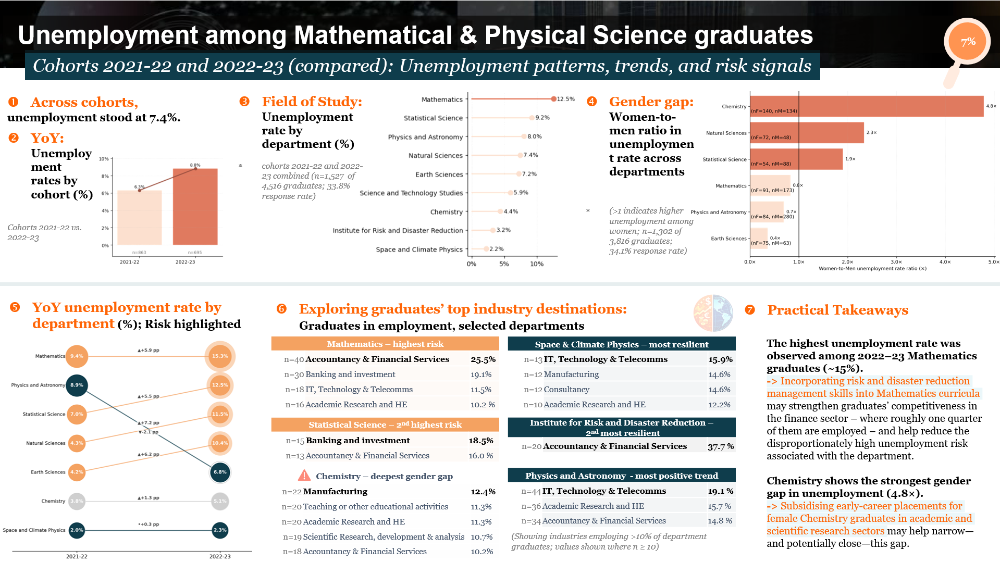

### Exhibit 2 
*Gendered patterns of unemployment*
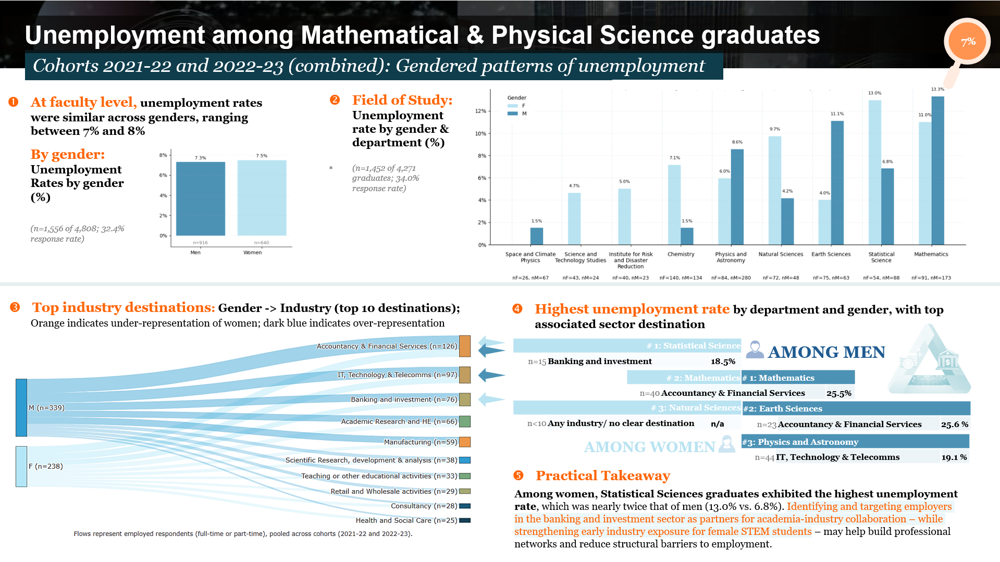

### Exhibit 3
*Diversity and inclusion snapshot*
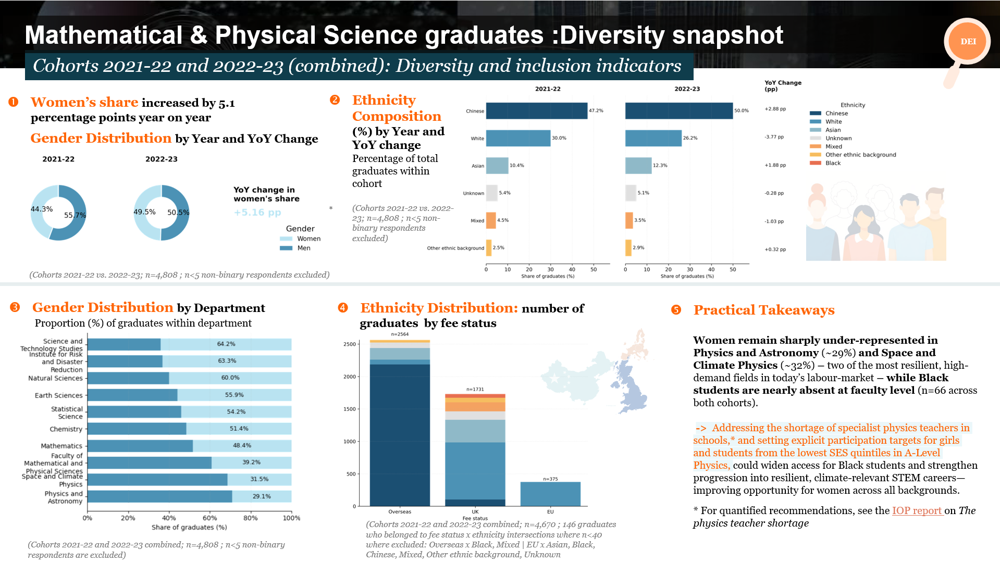

These exhibits are illustrative and focus on clarity, interpretability, and responsible communication of uncertainty, rather than on reproducing official statistics.

## Risks & Limitations

While data quality issues were limited and validation checks indicate generally reliable inputs, **several constraints limit the extent to which the current outputs can be relied upon for population-level inference or operational decision-making.** These constraints are discussed throughout the notebook and are summarised here for clarity.

### **A. Sample size, sparsity, and interpretability**

Despite including two graduating cohorts, the effective analytical sample remains modest once outcomes are disaggregated by department, gender, ethnicity, or their intersections. As discussed in earlier methodological notes, **unemployment is a low-frequency event across most subgroups**, meaning that many rate estimates are driven by small absolute numbers of observations.

As a result, **the current outputs should be interpreted as exploratory and hypothesis-generating**, rather than as a basis for definitive conclusions or prescriptive action. Without a substantially larger analytical base small changes in underlying counts may lead to disproportionate changes in estimated rates, particularly for narrowly defined subgroups. This limitation underpins the application of minimum subgroup-size thresholds, suppression rules, and repeated interpretive cautions throughout the notebook.

### **B. Response rate**

**A marked decline in survey response rates - of nearly 10 percentage points** between the 2021–22 and 2022–23 graduating cohorts (from approximately **37% to 28%**) - substantially limits the generalisability of findings to the full graduate population. **Low response rates introduce two key risks**:

(i) **reported estimates may diverge from true population outcomes**, and

(ii) **minority groups may be systematically under-represented**, resulting in reduced analytical quality and potentially misleading conclusions about the very groups most relevant for targeted higher-education policy interventions.

-> ***Recommendation***: A focused review of the drivers behind declining participation - particularly among under-represented groups - together with a concrete action plan to improve response rates in future survey waves, is essential to safeguard the validity, fairness, and policy relevance of Graduate Outcomes data.

### **C. Feature coverage and analytical scope**

The datasets available for this analysis include a relatively **narrow set of variables per graduate**, constraining the depth of interpretation and limiting the ability to identify underlying drivers of observed outcomes.

-> ***Recommendation***: Enriching future datasets with additional academic, demographic, and employability-related variables - such as degree outcomes or final grades, attrition indicators, first-generation status, caring or parental responsibilities, engagement with careers support services, and job-search duration - would enable more robust investigation of outcome determinants and provide a stronger evidence base for targeted, effective interventions.

### **Structural considerations (persisting beyond sample size)**

Finally, it is important to note that Graduate employment outcomes are shaped by a wide range of external factors - including macroeconomic conditions, regional labour demand, institutional practices, and sector-specific hiring cycles - that are only partially observable within survey-based datasets. Analytical outputs should therefore be interpreted as one input into a broader evidence base, rather than as a complete representation of graduate labour-market dynamics.

### APPENDIX

#### Appendix A: **Top destinations by department (tables)**

In [82]:
#complementary information: top destinations by department
def industry_sector_summary_by_group(
    data,
    split_dim,                   # e.g. 'gender', 'ethnicity', 'faculty'
    department=None,
    faculty=None,
    fee_status=None,
    year=None,
    gender=None,
    ethnicity=None,
    skill_level=None,
    employment_types=None):
    """
    Returns a dict:
      { group_value: industry_sector_summary(...) for that group }
    Example for split_dim='gender':
      {'M': DataFrame of industries for male grads,
        'F': DataFrame of industries for female grads}
    """

    # 1. Start from full data
    base = data.copy()
    
    # 2. Apply filters that define the population of interest.
    if department is not None:
        base = base[base['department'] == department]
    if faculty is not None:
        base = base[base['faculty'] == faculty]
    if fee_status is not None:
        base = base[base['fee_status'] == fee_status]
    if year is not None:
        base = base[base['year'] == year]
    if gender is not None and split_dim != 'gender':
        base = base[base['gender'] == gender]
    if ethnicity is not None and split_dim != 'ethnicity':
        base = base[base['ethnicity'] == ethnicity]
    if skill_level is not None:
        base = base[base['highly_skilled_work_marker'] == skill_level]
    if employment_types is not None:
        base = base[base['graduate_outcomes_activity'].isin(employment_types)]

    # 3. Prepare container for group results
    results = {}
    # Loop over each unique value in the grouping dimension
    for value in base[split_dim].dropna().unique():
        subset = base[base[split_dim] == value]
        # For each subset, we now compute the industry distribution (call industry_sector_summary)
        summary = industry_sector_summary(data=subset)
        results[value] = summary
    return results

In [83]:
# Industry distribution by department: uncomment to print all tables
#result = industry_sector_summary_by_group(data=graduates_all_merged, split_dim='department') 
# Loop and print all tables
#for dept_name, table in result.items():
#    display(dept_name)
#    display(table)
# **Note:** The data include multiple small cells; an excerpt of the resulting output is shown below for illustration.

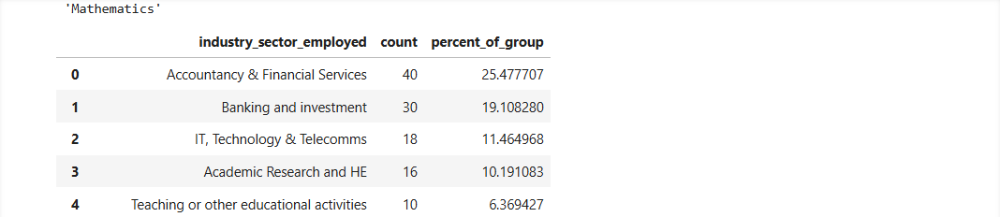

In [84]:
# optional: Combine all results into one long DataFrame - uncomment to run
#combined_rows = []

#for dept_name, table in result.items():
#    tmp = table.copy() 
#    tmp['department'] = dept_name  # add a column so we know where it came from
#    combined_rows.append(tmp)

#combined_df = pd.concat(combined_rows, ignore_index=True)

In [85]:
# Idustry distribution by gender subgroups - uncomment to run
#industry_dist_by_gender = industry_sector_summary_by_group(
#    data=graduates_all_merged, split_dim='gender')
#for dept_name, table in industry_dist_by_gender.items():
#    display(dept_name) 
#    display(table)
#**Note:** The data include multiple small cells; an excerpt of the resulting output is shown below for illustration. 

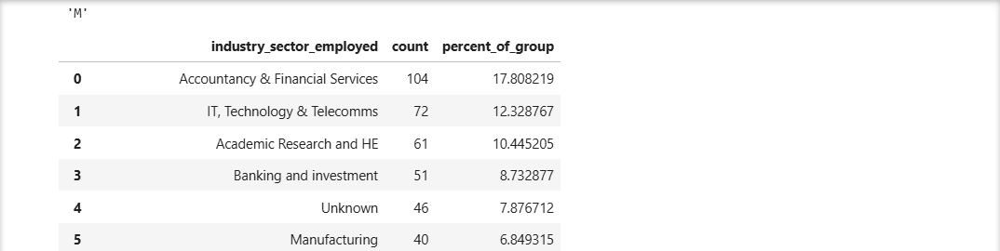
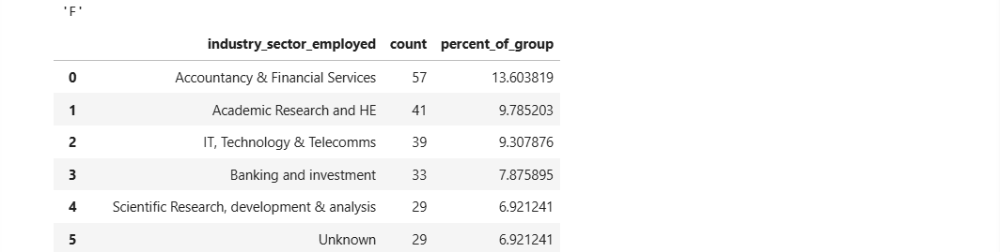

In [86]:
# Industry distribution by ethnicity subgroups - uncomment to run
#industry_dist_by_ethnicity = industry_sector_summary_by_group(
#    data=graduates_all_merged, split_dim='ethnicity')
#for dept_name, table in industry_dist_by_ethnicity.items():
#    display(dept_name) 
#    display(table)

In [87]:
# complementary information - cohorts' diversity - for the year 2021-22 
# get counts by ethnicity
ethnic_diversity_2021_22 = (grads_demographics_2021_22['ethnicity'].value_counts().rename_axis('ethnicity').reset_index(name='count'))
# add percentage column
ethnic_diversity_2021_22['percent'] = (ethnic_diversity_2021_22['count']/ total_2021_22*100)
# same for 2022-23
ethnic_diversity_2022_23 = (grads_demographics_2022_23['ethnicity'].value_counts().rename_axis('ethnicity').reset_index(name='count'))
# add percentage column
ethnic_diversity_2022_23['percent'] = (ethnic_diversity_2022_23['count']/ total_2022_23*100)
# Simple cross-tabulation (counts) - to examine ethnicity by fee_status:
pd.crosstab(graduates_all_merged['ethnicity'], graduates_all_merged['fee_status'],margins=True)

fee_status,EU,Overseas,UK,All
ethnicity,,,,
Asian,12,179,348,539
Black,1,7,58,66
Chinese,21,2185,103,2309
Mixed,25,27,138,190
Other ethnic background,16,40,72,128
Unknown,33,86,131,250
White,375,74,881,1330
All,483,2598,1731,4812


**NOTE: Representation of Chinese graduates**: The notably high proportion of graduates recorded as Chinese in these datasets is consistent with publicly available students enrolment data and therefore does not raise a data-quality issue. For further reading see: HESA, “HE Student Data: Where do HE students come from?”, Table 28 and Table 7, 2025 — https://www.hesa.ac.uk/data-and-analysis/students/where-from)*

#### Appendix A: **Python libraries used (for learners and onboarding)**
This appendix provides a brief overview of the core Python libraries used in the analysis, intended for readers who wish to explore the technical stack in more depth or to support onboarding of junior analysts into similar workflows. It also includes a breakdown of the main reproducible functions used throughout the notebook, for the same purpose.

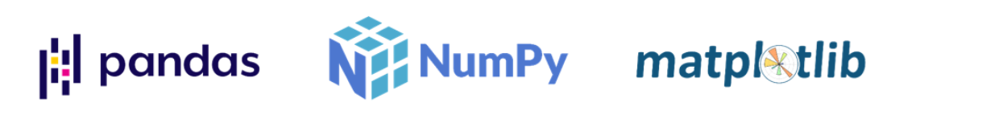
| **pandas**                                                                                                                                                                                      | **NumPy**                                                                                                                                                                                            | **matplotlib**                                                                                                                                                                                                     |
| ----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------ |
| **Main uses:** Data manipulation and analysis of structured/tabular data.                                                                                                                       | **Main uses:** Numerical computing and array operations.                                                                                                                                             | **Main uses:** Data visualization and charting.                                                                                                                                                                    |
| **Key features:**<br>- Read/write data (`read_csv`, `to_excel`)<br>- `DataFrame` and `Series` objects<br>- Filtering, grouping, merging, pivoting<br>- Handle missing data (`fillna`, `dropna`) | **Key features:**<br>- Fast numerical arrays (`ndarray`)<br>- Mathematical/statistical functions (`mean`, `std`, `dot`)<br>- Linear algebra and random sampling<br>- Foundation for pandas and SciPy | **Key features:**<br>- Create plots (`plot`, `bar`, `scatter`)<br>- Customize titles, labels, ticks, legends<br>- Integrate with pandas/NumPy<br>- Advanced control via `matplotlib.ticker` (e.g. `FuncFormatter`) |


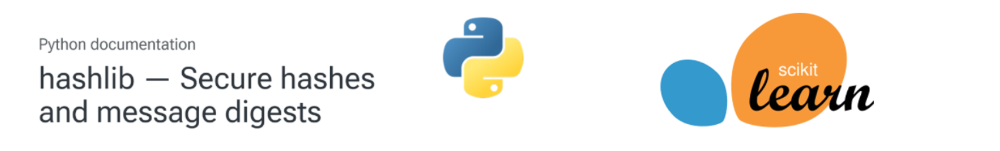


| **hashlib**                                                                                                                                                                                                                                                            | **scikit-learn (sklearn)**                                                                                                                                                                                                                                                             |
| ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | -------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| **Main uses:** Cryptographic hashing of data to create fixed-length, irreversible representations (hashes). Used for anonymisation, data integrity, and security-related tasks.                                                                                        | **Main uses:** Machine learning and statistical modelling, including data preprocessing, sampling, model building, and utility functions for reproducible analysis.                                                                                                                    |
| **Key features:**<br>- Secure hash functions (`sha256`, `sha1`, `md5`)<br>- Deterministic output (same input → same hash)<br>- One-way transformation (original data cannot be recovered)<br>- Commonly used for anonymising identifiers and protecting sensitive data | **Key features:**<br>- Utility functions for data handling (e.g. `shuffle`)<br>- Tools for sampling and resampling<br>- Preprocessing helpers (scaling, encoding)<br>- Machine learning models (classification, regression, clustering)<br>- Widely used, well-tested standard library |


#### Function: `high_skill_summary()`

This reusable analysis engine calculates the **percentage of graduates who are in full-time, high-skilled jobs out of all survey respondents** across a chosen subgroup (e.g., by gender, ethnicity, or department).  
It allows flexible filtering by multiple dimensions to produce comparable tables for deeper insights or dashboard-ready summaries.

| **Parameter** | **Description** | **Example Value / Use** |
|----------------|-----------------|--------------------------| 
| `data` | Input DataFrame containing graduate-level records. |  `'graduates_all_merged'`
| `groupby_dim` | Column used to group results (e.g. gender, ethnicity). | `'gender'`, `'department'` |
| `department` | Filter data for a specific department. | `'Chemistry'` |
| `faculty` | Filter data for a specific faculty. | `'Mathematical and Physical Sciences'` |
| `fee_status` | Filter by tuition fee status. | `'Overseas'` |
| `industry` | Filter by employment industry. | `'Education'` |
| `year` | Restrict to a specific academic year. | `'2022-23'` |
| `gender`, `ethnicity` | Narrow analysis to a single demographic group. | `'Women'`, `'Asian'` |
| `response_filter` | Restrict to a response status group (optional). | `'Survey completed or partially completed'` |
| `employment_filter` | Restrict to a specific employment category (optional). | `'Full-time employment'` |
| `skill_filter` | Restrict to a skill category (optional). | `'High-skilled'` |

**output:**  

- `'total_responded'` - count of respondents (survey completed / partially completed). 
- `full_time_high_skill_count` – number of respondents in full-time, high-skilled jobs 
- `full_time_high_skill_count_rate` – percentage of full-time, high-skilled among respondents

#### Functions: `industry_sector_summary()`, `industry_distribution_inc_unknown()`, `industry_sector_summary_by_group()`

This part of the pipeline include three functions for analysing **industry sector distribution** among employed graduates, allowing flexible filtering and subgroup comparisons.  
They calculate what proportion of graduates (e.g., by gender, ethnicity, or department) are employed in each industry — optionally including those with missing or unknown industry data.

| **Function** | **Purpose / Output** | **Handles Unknown Industry?** | **Grouped View (Split by Category)?** | **Key Filters Available** |
|---------------|----------------------|-------------------------------|--------------------------------------|----------------------------|
| `industry_sector_summary` | Returns a ranked table of industry sectors (count + % share) among selected graduates. | ❌ Excludes missing industry values. | ❌ Single-population view. | Department, faculty, year, gender, ethnicity, fee status, skill level, employment type |
| `industry_distribution_inc_unknown` | Same as above, but **includes** missing/unknown industry as an explicit category (“Unknown / Not reported”). | ✅ Included as separate category. | ❌ Single-population view. | Department, faculty, year, gender, ethnicity, employment type |
| `industry_sector_summary_by_group` | Iterates over subgroups (e.g. gender or ethnicity), returning a **dictionary** of ranked industry tables for each subgroup. | ❌ (delegates to `industry_sector_summary`) | ✅ Multi-group view. | Department, faculty, year, gender, ethnicity, fee status, skill level, employment type |

All three functions rely on the shared logic of filtering, grouping, counting, and computing within-group percentages, enabling parameterised, reproducible queries across demographic or academic dimensions.

***Further refinements** of these functions -such as adding parameters to include or exclude records with missing entries, or introducing additional filters as future datasets become richer - are optional but highly recommended to enhance flexibility and analytical precision.*

#### Functions used for visualisatinos: `unemployment_summary_by_group_table()`; `unemployment_summary_by_group_plot()`; `plot_rate_bars()`

These functions are used to analyse unemployment rates across different groups (e.g. by department, gender, ethnicity) and then visualise those results in a way that can be used directly in slides.

| **Function** | **Purpose / Output** | **Intended Use** | **Key Filters Available** |
|--------------|----------------------|------------------|----------------------------|
| `unemployment_summary_by_group_table()` | Returns a formatted summary table with unemployment rate (%), respondent counts, and total cohort size for each subgroup in `groupby_dim`. Column names are presentation-friendly. | Use when a readable, styled table is needed for reporting, notes, or to paste into slides. | `department`, `faculty`, `fee_status`, `industry`, `year`, `gender`, `ethnicity` |
| `unemployment_summary_by_group_plot()` | Returns two objects: (1) a numeric summary DataFrame (same calculation logic, but with numeric columns, not labels), and (2) `cohort_size` (the filtered population size before dropping missing outcomes). | Use as the data input to plotting functions. | same filters as above |
| `plot_rate_bars()` | Draws a chart from the summary data. Supports vertical bars (with % labels above and n= below), and also an alternate horizontal "lollipop" style for ranking and stacked bar plot for distribution. Automatically annotates response coverage in a subtitle. | Use to create presentation-ready visuals for unemployment rate by department / gender / ethnicity. | accepts `highlight_category`, `direction`, `order`, etc. |

All three functions share the same logic:
1. Filter the dataset down to the relevant population (e.g. Chemistry graduates only, or all departments).
2. Count how many graduates have a known outcome, and how many of those are unemployed.
3. Compute an unemployment rate (%).
4. Rank groups and display results with transparent denominators (sample size and coverage).

*Further refinements of these functions - such as adding parameters to include or exclude records with missing entries, or introducing additional filters as future datasets become richer - are optional but highly recommended to enhance flexibility and analytical precision.*
